# Raw Data & Import

In [0]:
#Jait Purohit

import sklearn.feature_extraction.text as sk_text
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from pandas import Series
%matplotlib inline
import json
import csv
import pandas as pd
import keras
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Conv1D, MaxPooling1D
import time
import seaborn as sns
sns.set_style('whitegrid')
import numpy as np
from sklearn.svm import SVC
from sklearn.calibration import CalibratedClassifierCV
import time
import numpy as np
import pandas as pd
from scipy import stats
import statsmodels
import matplotlib.pyplot as plt
import matplotlib
import pickle
import math
import pandas as pd
import numpy as np
from sklearn.preprocessing import Imputer
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import precision_score, accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

%matplotlib inline

from sklearn.model_selection import train_test_split

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

import seaborn as sns

In [0]:
import collections
from sklearn import preprocessing
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import shutil
import os
from sklearn.metrics import roc_curve, auc

# Encode text values to dummy variables(i.e. [1,0,0],[0,1,0],[0,0,1] for red,green,blue)
def encode_text_dummy(df, name):
    dummies = pd.get_dummies(df[name])
    for x in dummies.columns:
        dummy_name = "{}-{}".format(name, x)
        df[dummy_name] = dummies[x]
    df.drop(name, axis=1, inplace=True)


# Encode text values to indexes(i.e. [1],[2],[3] for red,green,blue).
def encode_text_index(df, name):
    le = preprocessing.LabelEncoder()
    df[name] = le.fit_transform(df[name])
    return le.classes_


# Encode a numeric column as zscores
def encode_numeric_zscore(df, name, mean=None, sd=None):
    if mean is None:
        mean = df[name].mean()

    if sd is None:
        sd = df[name].std()

    df[name] = (df[name] - mean) / sd


# Convert all missing values in the specified column to the median
def missing_median(df, name):
    med = df[name].median()
    df[name] = df[name].fillna(med)


# Convert all missing values in the specified column to the default
def missing_default(df, name, default_value):
    df[name] = df[name].fillna(default_value)


# Convert a Pandas dataframe to the x,y inputs that TensorFlow needs
def to_xy(df, target):
    result = []
    for x in df.columns:
        if x != target:
            result.append(x)
    # find out the type of the target column. 
    target_type = df[target].dtypes
    target_type = target_type[0] if isinstance(target_type, collections.Sequence) else target_type
    # Encode to int for classification, float otherwise. TensorFlow likes 32 bits.
    if target_type in (np.int64, np.int32):
        # Classification
        dummies = pd.get_dummies(df[target])
        return df[result].values.astype(np.float32), dummies.values.astype(np.float32)
    else:
        # Regression
        return df[result].values.astype(np.float32), df[target].values.astype(np.float32)

# Nicely formatted time string
def hms_string(sec_elapsed):
    h = int(sec_elapsed / (60 * 60))
    m = int((sec_elapsed % (60 * 60)) / 60)
    s = sec_elapsed % 60
    return "{}:{:>02}:{:>05.2f}".format(h, m, s)


# Regression chart.
def chart_regression(pred,y,sort=True):
    t = pd.DataFrame({'pred' : pred, 'y' : y.flatten()})
    if sort:
        t.sort_values(by=['y'],inplace=True)
    a = plt.plot(t['y'].tolist(),label='expected')
    b = plt.plot(t['pred'].tolist(),label='prediction')
    plt.ylabel('output')
    plt.legend()
    plt.show()

# Remove all rows where the specified column is +/- sd standard deviations
def remove_outliers(df, name, sd):
    drop_rows = df.index[(np.abs(df[name] - df[name].mean()) >= (sd * df[name].std()))]
    df.drop(drop_rows, axis=0, inplace=True)


# Encode a column to a range between normalized_low and normalized_high.
def encode_numeric_range(df, name, normalized_low=-1, normalized_high=1,
                         data_low=None, data_high=None):
    if data_low is None:
        data_low = min(df[name])
        data_high = max(df[name])

    df[name] = ((df[name] - data_low) / (data_high - data_low)) \
               * (normalized_high - normalized_low) + normalized_low


In [9]:
# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')
# 4/nQGR-xdp25F2tuLBwf1kKyjtJk-HJX5C0wYX_DV2soGrEWSo-HwfH6k

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
pip install geopandas

     |████████████████████████████████| 921kB 3.3MB/s 
     |████████████████████████████████| 11.9MB 48.7MB/s 
     |████████████████████████████████| 10.1MB 43.2MB/s 
  Created wheel for munch: filename=munch-2.3.2-py2.py3-none-any.whl size=6614 sha256=9fe013156bef88e691a506fabb7c6745ecf0c75e292f0c2d79639fbe34eec77b
  Stored in directory: /root/.cache/pip/wheels/db/bf/bc/06a3e1bfe0ab27d2e720ceb3cff3159398d92644c0cec2c125
Successfully built munch


In [0]:
# Load all importance packages
import geopandas
import numpy as np
import pandas as pd
from shapely.geometry import Point

import missingno as msn

import seaborn as sns
import matplotlib.pyplot as plt

In [0]:
train_data = pd.read_csv("/content/drive/My Drive/Colab Notebooks/masters_project/train.csv")
test_data = pd.read_csv("/content/drive/My Drive/Colab Notebooks/masters_project/test.csv")

In [0]:
type(train_data)

pandas.core.frame.DataFrame

In [0]:
train_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68',Time,'SF','HDOP',Latitude,Longitude
0,-200,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,'2017-12-28T16:14:07.247000+00:00',12,1.02,51.216736,4.412130
1,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-102,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,'2017-11-28T12:01:02.380000+00:00',7,0.57,51.232037,4.405185
2,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-106,-200,-200,-200,-200,-200,-97,-200,-84,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,'2017-12-14T09:05:22.832000+00:00',9,1.00,51.202763,4.390477
3,-200,-100,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,'2018-01-17T09:11:49.222000+00:00',12,0.62,51.194584,4.417887
4,-200,-106,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,'2018-01-10T14:47:01.379000+00:00',12,1.00,51.207203,4.403470


In [0]:
# Time is not necessary, so we will remove it
train_data.drop(columns=['Time'],inplace=True)
test_data.drop(columns=['Time'],inplace=True)

In [0]:
train_data.shape

(90515, 72)

# Base Stations on Map

In [0]:
pip install geopandas

In [0]:
# importing libraries
import pandas as pd # Reading csv file 
from shapely.geometry import Point # Shapely for converting latitude/longtitude to geometry
import geopandas as gpd # To create GeodataFrame

In [0]:
train_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude
0,-200,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,1.02,51.216736,4.412130
1,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-102,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.57,51.232037,4.405185
2,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-106,-200,-200,-200,-200,-200,-97,-200,-84,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.00,51.202763,4.390477
3,-200,-100,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.62,51.194584,4.417887
4,-200,-106,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,1.00,51.207203,4.403470


In [0]:
import pandas as pd
import descartes
import geopandas as gpd
from shapely.geometry import Point, Polygon

In [0]:
crs = {'init': 'epsg:4326'}
train_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude
0,-200,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,1.02,51.216736,4.412130
1,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-102,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.57,51.232037,4.405185
2,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-106,-200,-200,-200,-200,-200,-97,-200,-84,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.00,51.202763,4.390477
3,-200,-100,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.62,51.194584,4.417887
4,-200,-106,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,1.00,51.207203,4.403470


In [0]:
# Converting to (X,Y)
geometry = [Point(xy) for xy in zip(train_data["Longitude"], train_data["Latitude"])]

In [0]:
geo_df = gpd.GeoDataFrame(train_data, crs = crs,geometry = geometry)

In [0]:
geo_df.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,geometry
0,-200,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,1.02,51.216736,4.412130,POINT (4.412129879 51.21673584)
1,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-102,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.57,51.232037,4.405185,POINT (4.405184746000001 51.23203659)
2,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-106,-200,-200,-200,-200,-200,-97,-200,-84,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.00,51.202763,4.390477,POINT (4.390476704 51.2027626)
3,-200,-100,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.62,51.194584,4.417887,POINT (4.417886734 51.19458389)
4,-200,-106,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,1.00,51.207203,4.403470,POINT (4.403470039 51.20720291)


In [0]:
train_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,geometry
0,-200,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,1.02,51.216736,4.412130,POINT (4.412129879 51.21673584)
1,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-102,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.57,51.232037,4.405185,POINT (4.405184746000001 51.23203659)
2,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-106,-200,-200,-200,-200,-200,-97,-200,-84,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.00,51.202763,4.390477,POINT (4.390476704 51.2027626)
3,-200,-100,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.62,51.194584,4.417887,POINT (4.417886734 51.19458389)
4,-200,-106,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,1.00,51.207203,4.403470,POINT (4.403470039 51.20720291)


In [0]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [0]:
geo_train = geo_df.sample(n = 1000)

In [0]:
geo_train.shape

(1000, 73)

In [0]:
pip install folium

In [0]:
#Part 1
# Let's change the basemap style to 'Stamen Toner'
import folium
m = folium.Map(location=[51.216736, 4.412130], tiles='Stamen Toner',
                zoom_start=12, control_scale=True, prefer_canvas=True)

m

In [0]:
# Create a Map instance
m = folium.Map(location=[51.216736, 4.412130],
    zoom_start=12, control_scale=True)

# Add marker
# Run: help(folium.Icon) for more info about icons
folium.Marker(
    lo
    cation=[51.216736, 4.412130],
    popup='Antwerp City Hall',
    icon=folium.Icon(color='green', icon='ok-sign'),
).add_to(m)

In [0]:
points_gjson = folium.features.GeoJson(geo_train, name = "Base stations")

In [0]:
# Create a Map instance
m = folium.Map(location=[51.216736, 4.412130], tiles = 'cartodbpositron', zoom_start=14, control_scale=True)

# Add points to the map instance
points_gjson.add_to(m)

# Alternative syntax for adding points to the map instance
#m.add_child(points_gjson)

#Show map
m

In [0]:
pip install mplleaflet

  Created wheel for mplleaflet: filename=mplleaflet-0.0.5-cp36-none-any.whl size=28555 sha256=e781f5921db78e54914799ebb3a52a4ee2d445a880e89b8be0ef36c89b0a74aa
  Stored in directory: /root/.cache/pip/wheels/bf/fd/0b/0513de62c339c4a56e2234aa42a5d06e6660a4446fdae7b796
Successfully built mplleaflet


In [0]:
import geopandas as gpd
import matplotlib.pyplot as plt
import mplleaflet

In [0]:
# 1.Plot data:
geo_train.plot()

# 2. Convert plot to a web map:
mplleaflet.show()

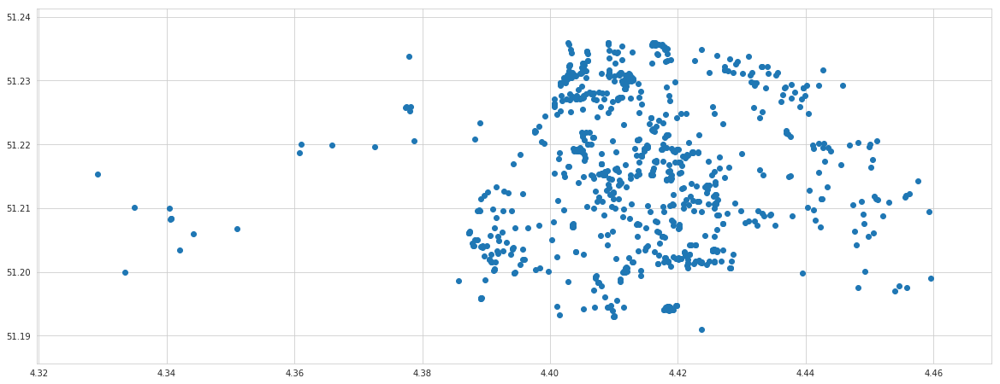

In [0]:
# 1. Plot data:
geo_train.plot(figsize=(20,20));

# Data Preprocessing

In [0]:
geo_df.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,geometry,distance
0,-200,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,1.02,51.216736,4.412130,POINT (4.412129879 51.21673584),733.210442
1,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-102,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.57,51.232037,4.405185,POINT (4.405184746000001 51.23203659),1417.507615
2,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-106,-200,-200,-200,-200,-200,-97,-200,-84,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.00,51.202763,4.390477,POINT (4.390476704 51.2027626),2030.745012
3,-200,-100,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.62,51.194584,4.417887,POINT (4.417886734 51.19458389),2960.307633
4,-200,-106,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,1.00,51.207203,4.403470,POINT (4.403470039 51.20720291),1357.936594


In [0]:
geo_df.describe()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
count,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.00000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.00000,90515.000000,90515.000000,90515.0,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000,90515.000000
mean,-179.303066,-170.813059,-191.315881,-194.792841,-187.650876,-197.607148,-193.240369,-197.692493,-180.996100,-183.771408,-191.232613,-192.455251,-179.398409,-160.043142,-196.542849,-199.611788,-185.717351,-187.064895,-193.993084,-191.757874,-199.169574,-197.824670,-197.722035,-199.697310,-194.462940,-199.562437,-193.565199,-198.232735,-199.261504,-199.54929,-198.235342,-198.631354,-199.713793,-199.150693,-199.585671,-199.918069,-199.153499,-199.756946,-199.096150,-198.850434,-199.643739,-199.985052,-199.907120,-199.962537,-199.963840,-199.907253,-199.921980,-199.744042,-199.940827,-199.751157,-199.975639,-199.992852,-199.990189,-199.963299,-199.988422,-199.962139,-199.997249,-199.981230,-199.992521,-199.987615,-199.996277,-199.99905,-199.998862,-199.999061,-200.0,-199.994156,-199.999061,-199.999094,10.274949,0.792437,51.213483,4.414083,1861.727251
std,38.315835,44.906299,27.392112,21.226694,32.152025,14.534820,23.993144,14.466146,37.724607,37.759828,27.283226,25.449703,39.394342,47.307592,17.700979,5.906121,33.063932,32.724457,22.519511,26.159166,9.195125,13.913955,14.207073,5.730401,21.680018,6.586268,23.589913,12.866084,8.049674,6.71786,12.475811,10.788303,5.648665,8.706943,6.409764,2.664182,8.687912,4.817294,9.414886,10.196141,5.764053,1.202128,2.851795,1.805028,1.866393,3.044805,2.746895,4.660325,2.421768,4.756662,1.565756,0.815479,1.044914,1.793645,1.005728,2.015932,0.477830,1.331473,0.795575,1.033773,0.560065,0.28585,0.342355,0.282526,0.0,0.788951,0.282526,0.272555,1.686280,0.742089,0.013153,0.015150,932.849872
min,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.00000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.00000,-200.000000,-200.000000,-200.0,-200.000000,-200.000000,-200.000000,7.000000,0.510000,51.186169,4.325181,28.448078
25%,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.

In [0]:
# check for missing values
geo_df.isnull().values.any()

False

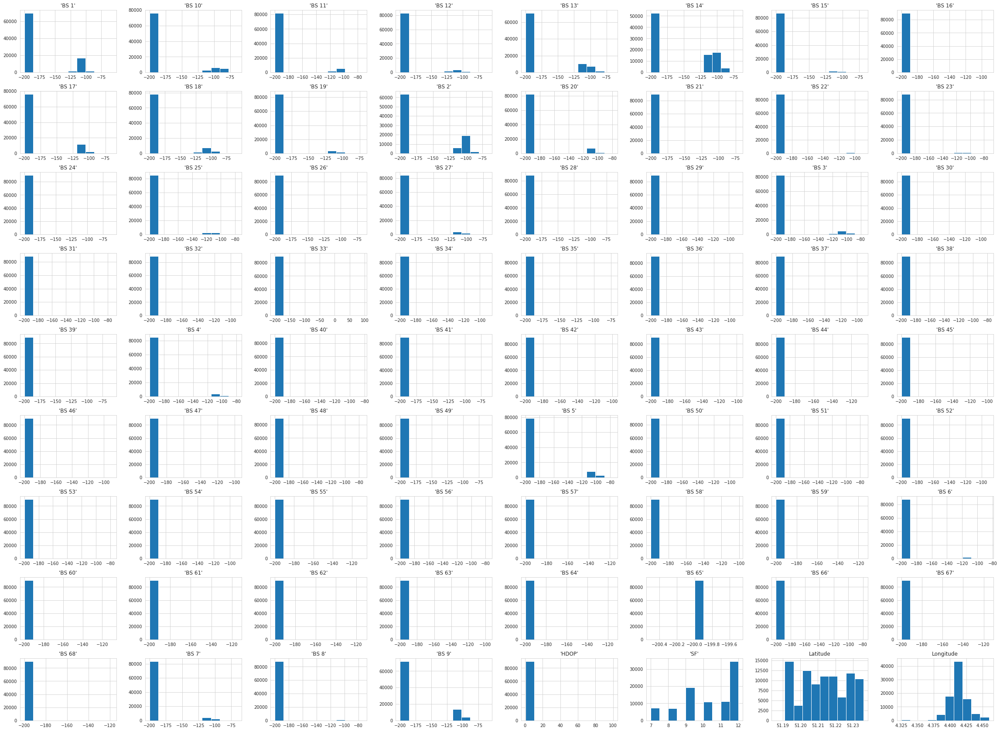

In [0]:
%matplotlib inline
import matplotlib.pyplot as plt 
geo_df.hist(figsize=(40,30))# Plotting all the beacons values 
#x axis = RSSI value
#y axis = number of data points at a perticular RSSI value
plt.savefig('Leabeled_beacons_Histograms.png')
plt.show()

# FingerPrinting Maps for Base-Stations

## Fingerprinting Maps for Base Station-1

In [0]:
train_data.isnull().sum().sum()

0

In [0]:
test_data.isnull().sum().sum()

0

In [0]:
len(train_data.Latitude.unique())

10753

In [0]:
len(test_data.Latitude.unique())

9112

In [0]:
len(train_data.Longitude.unique())

26882

In [0]:
len(test_data.Longitude.unique())

16627

In [0]:
train_sort_data = train_data.sort_values("'BS 1'")

In [0]:
test_sort_data = test_data.sort_values("'BS 1'")

In [0]:
train_sort_data.loc[train_sort_data["'BS 1'"] == -200].shape

(69982, 72)

In [0]:
#train_sort_data1 = train_sort_data.iloc[69000:, :]

In [0]:
train_sort_data.shape

(90515, 72)

In [0]:
test_sort_data.shape

(33013, 72)

In [0]:
train_sort_data2 = train_sort_data.reset_index(drop=True)

In [0]:
test_sort_data2 = test_sort_data.reset_index(drop=True)

In [0]:
train_sort_data2.shape

(90515, 72)

In [0]:
test_sort_data2.shape

(33013, 72)

In [0]:
train_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
test_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
train_filtered_data = train_sort_data2.reset_index(drop=True)

In [0]:
test_filtered_data = test_sort_data2.reset_index(drop=True)

In [0]:
#train_filtered_data = train_sort_data2.iloc[970:1000,:]

In [0]:
train_filtered_data.groupby("'BS 1'").size()

'BS 1'
-200    62801
-119       16
-117       82
-116       89
-115     1234
-114     2549
-113     1798
-112     1124
-111      997
-110      911
-109      856
-108      852
-107      860
-106      714
-105      608
-104      572
-103      429
-102      357
-101      295
-100      200
-99       181
-98       133
-97       128
-96       112
-95        65
-94        61
-93        55
-92        30
-91        25
-90        19
-89        17
-88        11
-87        16
-86         8
-85         2
-84         7
-83         5
-82         5
-81         3
-80         3
-79         4
-78         6
-77         3
-76         4
-75         4
-74         3
-73         7
-72         2
-71         1
-70         1
-69         4
-68         4
-67         3
-66         4
-64         5
-63         4
-62         5
-61         3
dtype: int64

In [0]:
# Replacing values with Nan outside range of (-150,150)
train_filtered_data["'BS 1'"]=train_filtered_data["'BS 1'"].where(train_filtered_data["'BS 1'"].between(-150,150))

In [0]:
#train_data["'BS 2'"]=train_data["'BS 2'"].where(train_data["'BS 2'"].between(-150,150))

In [0]:
train_filtered_data.shape

(78297, 72)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_filtered_data['distance'] = train_filtered_data.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_sort_data2['distance'] = train_sort_data2.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

test_filtered_data['distance'] = test_filtered_data.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

test_sort_data2['distance'] = test_sort_data2.apply(lambda row: haversine(row), axis=1)

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,NaN,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,1.02,51.216736,4.412130,0.733210
1,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.87,51.203705,4.389272,1.973544
2,NaN,-109,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.63,51.212929,4.439023,2.643698
3,NaN,-200,-200,-200,-200,-200,-200,-200,-103,-200,-200,-200,-200,-89,-200,-200,-200,-100,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.65,51.215996,4.410177,0.655104
4,NaN,-200,-116,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-90,-200,-200,-200,-200,-200,-200,-119,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.62,51.203636,4.394001,1.850124


In [0]:
test_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-98,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.75,51.218407,4.406668,0.310602
1,-200,-200,-200,-105,-103,-200,-200,-200,-200,-200,-200,-200,-200,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,1.35,51.231571,4.417382,1.704575
2,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-105,-110,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.60,51.227009,4.405367,0.869300
3,-200,-118,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.76,51.196632,4.401170,2.533338
4,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-98,-200,-200,-200,-115,-200,-200,-200,-200,-200,-116,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.73,51.205791,4.349908,3.963554


In [0]:
train_filtered_data.isnull().sum().sum()

62801

In [0]:
len(train_filtered_data.Latitude.unique())

10753

In [0]:
len(train_filtered_data.Longitude.unique())

26882

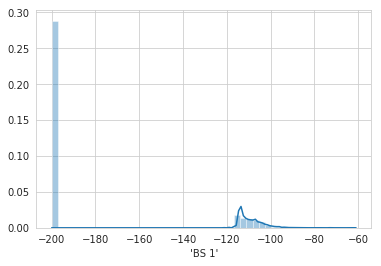

In [0]:
sns.distplot(train_sort_data2["'BS 1'"])

70% values from BS-1 have been made NaN as it is out of range. We will try to predict it using interpolation.

### Plotting Fingerprinting Heatmap for BS-1 training data

In [0]:
# Line 2.
extent = x_extent = x_min, x_max, y_min, y_max = [train_sort_data2.Latitude.min()-50, train_sort_data2.Latitude.max()+50,
                                                  train_sort_data2.Longitude.min()-10, train_sort_data2.Longitude.max()+10]

In [0]:
extent

[1.1861686700000007, 101.23601913, -5.674818516, 14.45976162]

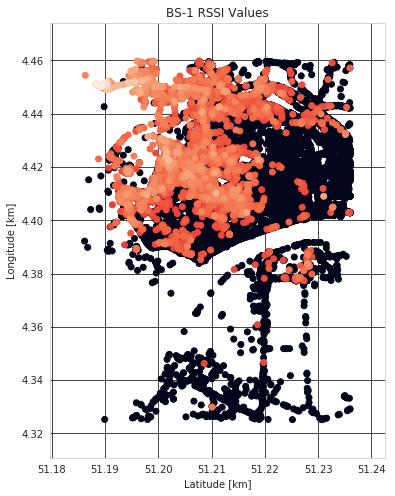

In [0]:
fig, ax = plt.subplots(figsize=(15,8))

ax.scatter(train_sort_data2.Latitude, train_sort_data2.Longitude, c=train_sort_data2["'BS 1'"])
ax.set_aspect(.5)
#ax.set_xlim(*extent[:])
#ax.set_ylim(*extent[:])
ax.set_xlabel('Latitude [km]')
ax.set_ylabel('Longitude [km]')
ax.set_title('BS-1 RSSI Values')
ax.grid(c='k', alpha=0.9)

plt.show()

### Interpolation Techniques

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,NaN,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,1.02,51.216736,4.412130,0.733210
1,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.87,51.203705,4.389272,1.973544
2,NaN,-109,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.63,51.212929,4.439023,2.643698
3,NaN,-200,-200,-200,-200,-200,-200,-200,-103,-200,-200,-200,-200,-89,-200,-200,-200,-100,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.65,51.215996,4.410177,0.655104
4,NaN,-200,-116,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-90,-200,-200,-200,-200,-200,-200,-119,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.62,51.203636,4.394001,1.850124


In [0]:
train_filtered_data = train_filtered_data.reset_index(drop=True)

In [0]:
test_filtered_data = test_filtered_data.reset_index(drop=True)

In [0]:
train_df = train_filtered_data.sort_values(by="'BS 1'", ascending=False)

In [0]:
test_df = test_filtered_data.sort_values(by="'BS 1'", ascending=False)

### Linear *Interpolation*

In [0]:
train_df.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
62796,NaN,-200,-200,-105,-100,-200,-200,-200,-200,-200,-200,-200,-104,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.96,51.235973,4.415761,2.061292
62797,NaN,-200,-200,-200,-101,-200,-200,-200,-200,-200,-200,-200,-99,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.60,51.231884,4.405218,1.401003
62798,NaN,-200,-200,-200,-200,-200,-200,-200,-110,-200,-200,-200,-200,-200,-200,-200,-113,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.66,51.213638,4.410793,0.862621
62799,NaN,-200,-200,-112,-200,-200,-200,-200,-111,-200,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.94,51.235657,4.416378,2.049782
62800,NaN,-200,-200,-200,-112,-200,-200,-200,-200,-200,-110,-200,-200,-112,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.71,51.231232,4.425323,2.063230


In [0]:
test_df.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
10325,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-109,-200,-200,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-117,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.77,51.207390,4.413971,1.556260
10324,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-111,-99,-200,-200,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.04,51.218376,4.405312,0.226507
10323,-200,-92,-103,-200,-200,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.72,51.194355,4.418590,3.001995
10322,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-106,-200,-200,-200,-110,-200,-200,-200,-200,-200,-200,-200,-200,-100,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.63,51.202896,4.407722,1.870845
15495,-200,-101,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.92,51.194386,4.406012,2.792219


In [0]:
train_df1 = train_df.interpolate(method ='linear', limit_direction ='forward')

In [0]:
train_df1.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
62796,-119.0,-200,-200,-105,-100,-200,-200,-200,-200,-200,-200,-200,-104,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.96,51.235973,4.415761,2.061292
62797,-119.0,-200,-200,-200,-101,-200,-200,-200,-200,-200,-200,-200,-99,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.60,51.231884,4.405218,1.401003
62798,-119.0,-200,-200,-200,-200,-200,-200,-200,-110,-200,-200,-200,-200,-200,-200,-200,-113,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.66,51.213638,4.410793,0.862621
62799,-119.0,-200,-200,-112,-200,-200,-200,-200,-111,-200,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.94,51.235657,4.416378,2.049782
62800,-119.0,-200,-200,-200,-112,-200,-200,-200,-200,-200,-110,-200,-200,-112,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.71,51.231232,4.425323,2.063230


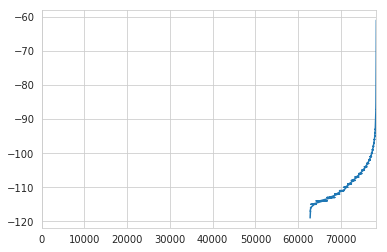

In [0]:
train_df["'BS 1'"].plot()

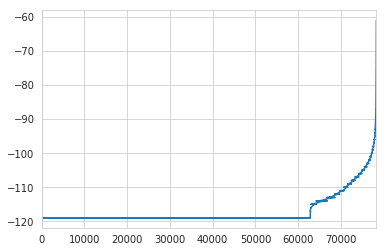

In [0]:
df_linear = train_df1["'BS 1'"].plot()

### Linear, Cubic, Quadratic *Interpolation*

In [0]:
from scipy.interpolate.rbf import Rbf  # radial basis functions
from urllib.request import urlopen
 
import matplotlib.pyplot as plt
import numpy as np

In [0]:
random_subset1 = train_df1.sample(n=100, replace=True)
random_test_subset1 = test_df.sample(n=100, replace=True)
random_subset2 = train_df1.sample(n=100, replace=True)

In [0]:
random_subset = train_df.sample(n=100, replace=True)

In [0]:
random_subset1.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
9070,-119.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-107,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.20,51.205093,4.388210,1.876580
55341,-119.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-104,-200,-200,-200,-105,-200,-200,-200,-200,-200,-102,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.82,51.206066,4.387350,1.819861
59623,-119.0,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-105,-200,-101,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.84,51.215328,4.438293,2.533755
42751,-119.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-94,-200,-200,-200,-200,-200,-200,-115,-200,-117,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.69,51.204079,4.391988,1.854342
58504,-119.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-105,-200,-84,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.24,51.203838,4.389298,1.959553


In [0]:
# Linear Interpolation

In [0]:
df0 = random_subset1.interpolate(method ='linear', limit_direction ='backward')

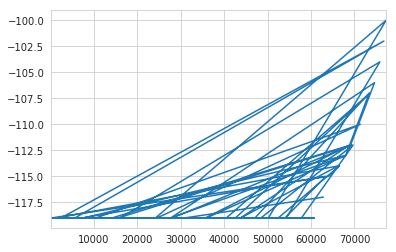

In [0]:
df_linear = df0["'BS 1'"].sample(100).plot()

In [0]:
# Cubic Interpolation

In [0]:
df1 = random_subset1.interpolate(method ='cubic', limit_direction ='backward')

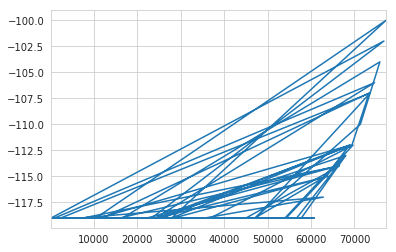

In [0]:
df_cubic = df1["'BS 1'"].plot()

In [0]:
# Quadratic Interpolation

In [0]:
df2 = random_subset1.interpolate(method ='quadratic', limit_direction ='backward')

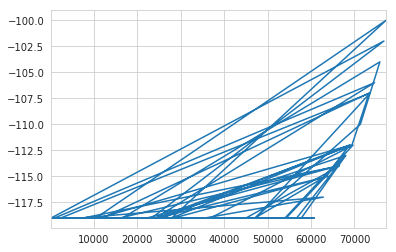

In [0]:
df_quadratic = df2
df2["'BS 1'"].plot()

In [0]:
import numpy as np; np.random.seed(0)
import seaborn as sns

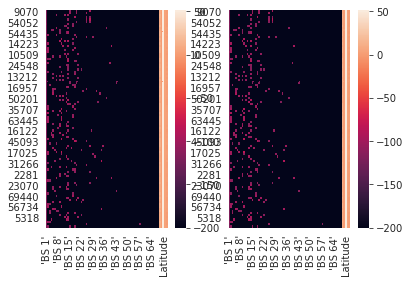

In [0]:
fig, ax =plt.subplots(1,2)

sns.heatmap(df0, ax=ax[0])
sns.heatmap(df1, ax=ax[1])

plt.show()

In [0]:
#Creating some data, with each coordinate and the values stored in separated lists
x = random_subset1.distance
y = random_subset1.distance
values = random_subset1["'BS 1'"]

In [0]:
random_subset1.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
hm = random_subset1.pivot("Latitude", "Longitude", "'BS 1'")
hm.head()

Longitude,4.329185009,4.377558231,4.378441811,4.387350082,4.38820982,4.389298439,4.391495228,4.39151144,4.391988277,4.394028187,4.39801836,4.399600029,4.399988174,4.400266647,4.400728226,4.400976658,4.401703358,4.402005196,4.402463436000001,4.402776718,4.4033298489999995,4.40343523,4.404778481,4.40514183,4.405153275,4.405898093999999,4.405924797,4.40661478,4.406768322,4.407551765,4.407575131000001,4.408014774,4.408140183,4.408885002,4.409178257,4.409184933,4.409306526,4.409464836000001,4.409639835,4.409923554,...,4.417936802,4.41824007,4.418334961,4.418336868,4.418341637,4.418361664,4.4184064869999995,4.418479919,4.41853857,4.418630123,4.418640137,4.418858528,4.419004917,4.419264793,4.420361519,4.421575069,4.422108173,4.4223151210000005,4.423553467,4.423735142,4.424405098,4.4246001239999995,4.425391674,4.425483227,4.425666809,4.425908089,4.4299016,4.43347168,4.435239792,4.435731888,4.435848236,4.43612814,4.438293456999999,4.439438343,4.442678452,4.443886757,4.444003582,4.447728157,4.448316574,4.453128338
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.193634,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-119.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194241,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-119.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,-119.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194248,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,-119.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194275,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,-119.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
hm_df = hm.interpolate(method ='linear', limit_direction ='both')

In [0]:
hm_df.head()

Longitude,4.329185009,4.377558231,4.378441811,4.387350082,4.38820982,4.389298439,4.391495228,4.39151144,4.391988277,4.394028187,4.39801836,4.399600029,4.399988174,4.400266647,4.400728226,4.400976658,4.401703358,4.402005196,4.402463436000001,4.402776718,4.4033298489999995,4.40343523,4.404778481,4.40514183,4.405153275,4.405898093999999,4.405924797,4.40661478,4.406768322,4.407551765,4.407575131000001,4.408014774,4.408140183,4.408885002,4.409178257,4.409184933,4.409306526,4.409464836000001,4.409639835,4.409923554,...,4.417936802,4.41824007,4.418334961,4.418336868,4.418341637,4.418361664,4.4184064869999995,4.418479919,4.41853857,4.418630123,4.418640137,4.418858528,4.419004917,4.419264793,4.420361519,4.421575069,4.422108173,4.4223151210000005,4.423553467,4.423735142,4.424405098,4.4246001239999995,4.425391674,4.425483227,4.425666809,4.425908089,4.4299016,4.43347168,4.435239792,4.435731888,4.435848236,4.43612814,4.438293456999999,4.439438343,4.442678452,4.443886757,4.444003582,4.447728157,4.448316574,4.453128338
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.193634,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-112.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,...,-119.0,-114.0,-104.0,-119.0,-119.0,-119.0,-115.0,-119.0,-119.0,-119.0,-119.0,-100.0,-106.0,-119.0,-119.0,-107.0,-119.0,-119.0,-119.0,-113.0,-119.0,-119.0,-112.0,-113.0,-102.0,-119.0,-119.0,-119.0,-119.0,-117.0,-119.0,-119.0,-119.0,-119.0,-112.0,-115.0,-119.0,-114.0,-110.0,-119.0
51.194241,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-112.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,...,-119.0,-114.0,-104.0,-119.0,-119.0,-119.0,-115.0,-119.0,-119.0,-119.0,-119.0,-100.0,-106.0,-119.0,-119.0,-107.0,-119.0,-119.0,-119.0,-113.0,-119.0,-119.0,-112.0,-113.0,-102.0,-119.0,-119.0,-119.0,-119.0,-117.0,-119.0,-119.0,-119.0,-119.0,-112.0,-115.0,-119.0,-114.0,-110.0,-119.0
51.194244,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-112.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,...,-119.0,-114.0,-104.0,-119.0,-119.0,-119.0,-115.0,-119.0,-119.0,-119.0,-119.0,-100.0,-106.0,-119.0,-119.0,-107.0,-119.0,-119.0,-119.0,-113.0,-119.0,-119.0,-112.0,-113.0,-102.0,-119.0,-119.0,-119.0,-119.0,-117.0,-119.0,-119.0,-119.0,-119.0,-112.0,-115.0,-119.0,-114.0,-110.0,-119.0
51.194248,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-112.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,...,-119.0,-114.0,-104.0,-119.0,-119.0,-119.0,-115.0,-119.0,-119.0,-119.0,-119.0,-100.0,-106.0,-119.0,-119.0,-107.0,-119.0,-119.0,-119.0,-113.0,-119.0,-119.0,-112.0,-113.0,-102.0,-119.0,-119.0,-119.0,-119.0,-117.0,-119.0,-119.0,-119.0,-119.0,-112.0,-115.0,-119.0,-114.0,-110.0,-119.0
51.194275,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-112.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,...,-119.0,-114.0,-104.0,-119.0,-119.0,-119.0,-115.0,-119.0,-119.0,-119.0,-119.0,-100.0,-106.0,-119.0,-119.0,-107.0,-119.0,-119.0,-119.0,-113.0,-119.0,-119.0,-112.0,-113.0,-102.0,-119.0,-119.0,-119.0,-119.0,-117.0,-119.0,-119.0,-119.0,-119.0,-112.0,-115.0,-119.0,-114.0,-110.0,-119.0


In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

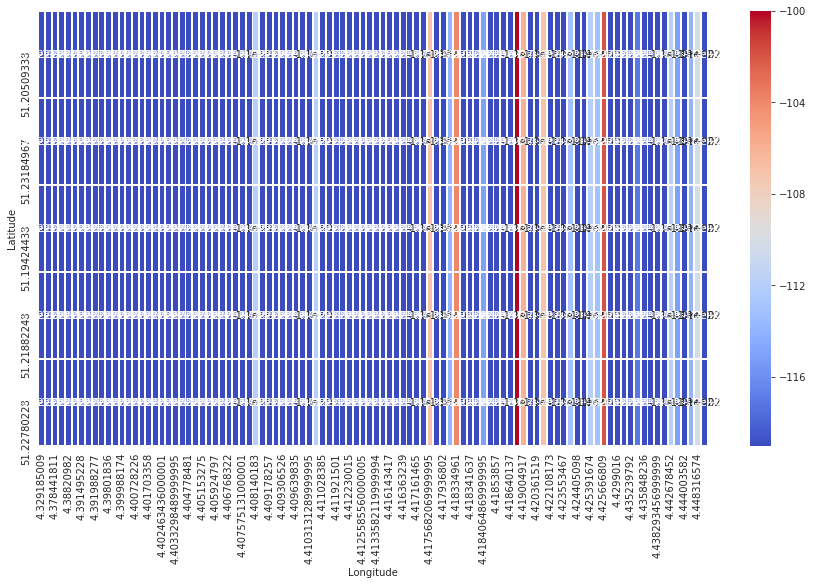

In [0]:
plt.figure(figsize=(15,8))
sns.heatmap(hm_df.sample(5), annot=True, linewidth = 0.9, cmap='coolwarm')

### AutoEncoder Imputation

In [0]:
from numpy import nan
from sklearn.preprocessing import Imputer

In [0]:
traincols = train_df.columns.tolist() 
traincols.remove('Latitude')
traincols.remove('Longitude')
traincols.remove('distance')
len(traincols)

70

In [0]:
columns_X = traincols
x = train_df[columns_X]

In [0]:
columns_y = ['Latitude','Longitude']
y = train_df[columns_y]

In [0]:
imp = Imputer(strategy='mean')
X2 = imp.fit_transform(train_df)
X2

array([[ -61.        , -200.        , -102.        , ...,   51.18915939,
           4.45044184,    4.73951412],
       [ -61.        , -104.        ,  -97.        , ...,   51.18829727,
           4.45105982,    4.8380323 ],
       [ -61.        , -200.        , -105.        , ...,   51.18875122,
           4.45088673,    4.7935787 ],
       ...,
       [-109.07569695, -200.        , -200.        , ...,   51.21363831,
           4.4107933 ,    0.86262127],
       [-109.07569695, -200.        , -200.        , ...,   51.23565674,
           4.4163785 ,    2.04978187],
       [-109.07569695, -200.        , -200.        , ...,   51.23123169,
           4.42532349,    2.06323023]])

In [0]:
model = LinearRegression().fit(X2, y)
model.predict(X2)

array([[51.18915939,  4.45044184],
       [51.18829727,  4.45105982],
       [51.18875122,  4.45088673],
       ...,
       [51.21363831,  4.4107933 ],
       [51.23565674,  4.4163785 ],
       [51.23123169,  4.42532349]])

In [0]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures

model = make_pipeline(Imputer(strategy='mean'),
                      PolynomialFeatures(degree=2),
                      LinearRegression())

In [0]:
def make_reconstruction_loss(n_features):

    def reconstruction_loss(input_and_mask, y_pred):
        X_values = input_and_mask[:, :n_features]
        X_values.name = "$X_values"

        missing_mask = input_and_mask[:, n_features:]
        missing_mask.name = "$missing_mask"
        observed_mask = 1 - missing_mask
        observed_mask.name = "$observed_mask"

        X_values_observed = X_values * observed_mask
        X_values_observed.name = "$X_values_observed"

        pred_observed = y_pred * observed_mask
        pred_observed.name = "$y_pred_observed"

        return mse(y_true=X_values_observed, y_pred=pred_observed)
    return reconstruction_loss
  
def masked_mae(X_true, X_pred, mask):
    masked_diff = X_true[mask] - X_pred[mask]
    return np.mean(np.abs(masked_diff))

In [0]:
import random
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
from keras.utils import np_utils
from sklearn.preprocessing import LabelEncoder

from keras.objectives import mse
from keras.models import Sequential
from keras.layers.core import Dropout, Dense

from keras.regularizers import L1L2

from collections import defaultdict

%matplotlib inline

In [0]:
class Autoencoder:

    def __init__(self, data,
                 recurrent_weight=0.5,
                 optimizer="adam",
                 dropout_probability=0.5,
                 hidden_activation="relu",
                 output_activation="sigmoid",
                 init="glorot_normal",
                 L1_penalty=0,
                 L2_penalty=0):
        self.data = data.copy()
        self.recurrent_weight = recurrent_weight
        self.optimizer = optimizer
        self.dropout_probability = dropout_probability
        self.hidden_activation = hidden_activation
        self.output_activation = output_activation
        self.init = init
        self.L1_penalty = L1_penalty
        self.L2_penalty = L2_penalty

    def _get_hidden_layer_sizes(self):
        n_dims = self.data.shape[1]
        return [
            min(2000, 8 * n_dims),
            min(500, 2 * n_dims),
            int(np.ceil(0.5 * n_dims)),
        ]

    def _create_model(self):

        hidden_layer_sizes = self._get_hidden_layer_sizes()
        first_layer_size = hidden_layer_sizes[0]
        n_dims = self.data.shape[1]

        model = Sequential()

        model.add(Dense(
            first_layer_size,
            input_dim= 2 * n_dims,
            activation=self.hidden_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))
        model.add(Dropout(self.dropout_probability))

        for layer_size in hidden_layer_sizes[1:]:
            model.add(Dense(
                layer_size,
                activation=self.hidden_activation,
                W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
                init=self.init))
            model.add(Dropout(self.dropout_probability))

        model.add(Dense(
            n_dims,
            activation=self.output_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))

        loss_function = make_reconstruction_loss(n_dims)

        model.compile(optimizer=self.optimizer, loss=loss_function)
        return model

    def fill(self, missing_mask):
        self.data[missing_mask] = -1

    def _create_missing_mask(self):
        if self.data.dtype != "f" and self.data.dtype != "d":
            self.data = self.data.astype(float)

        return np.isnan(self.data)

    def _train_epoch(self, model, missing_mask, batch_size):
        input_with_mask = np.hstack([self.data, missing_mask])
        n_samples = len(input_with_mask)
        n_batches = int(np.ceil(n_samples / batch_size))
        indices = np.arange(n_samples)
        np.random.shuffle(indices)
        X_shuffled = input_with_mask[indices]

        for batch_idx in range(n_batches):
            batch_start = batch_idx * batch_size
            batch_end = (batch_idx + 1) * batch_size
            batch_data = X_shuffled[batch_start:batch_end, :]
            model.train_on_batch(batch_data, batch_data)
        return model.predict(input_with_mask)

    def train(self, batch_size=256, train_epochs=100):
        missing_mask = self._create_missing_mask()
        self.fill(missing_mask)
        self.model = self._create_model()

        observed_mask = ~missing_mask

        for epoch in range(train_epochs):
            X_pred = self._train_epoch(self.model, missing_mask, batch_size)
            observed_mae = masked_mae(X_true=self.data,
                                    X_pred=X_pred,
                                    mask=observed_mask)
            if epoch % 50 == 0:
                print("observed mae:", observed_mae)

            old_weight = (1.0 - self.recurrent_weight)
            self.data[missing_mask] *= old_weight
            pred_missing = X_pred[missing_mask]
            self.data[missing_mask] += self.recurrent_weight * pred_missing
        return self.data.copy()

In [0]:
train_df["'BS 1'"] = pd.to_numeric(train_df["'BS 1'"], errors='coerce')

In [0]:
train_df3 = train_df.dropna(subset=["'BS 1'"])


In [0]:
train_df3["'BS 1'"] = train_df3["'BS 1'"].astype(int)

In [0]:
missing_encoded = pd.get_dummies(train_df)

for col in train_df.columns:
    missing_cols = missing_encoded.columns.str.startswith(str(col) + "_")
    missing_encoded.loc[train_df[col].isnull(), missing_cols] = np.nan

In [0]:
missing_encoded.values

array([[ -61.        , -200.        , -102.        , ...,   51.18915939,
           4.45044184,    4.73951412],
       [ -61.        , -104.        ,  -97.        , ...,   51.18829727,
           4.45105982,    4.8380323 ],
       [ -61.        , -200.        , -105.        , ...,   51.18875122,
           4.45088673,    4.7935787 ],
       ...,
       [          nan, -200.        , -200.        , ...,   51.21363831,
           4.4107933 ,    0.86262127],
       [          nan, -200.        , -200.        , ...,   51.23565674,
           4.4163785 ,    2.04978187],
       [          nan, -200.        , -200.        , ...,   51.23123169,
           4.42532349,    2.06323023]])

In [0]:
#pip install autoencoder-impute

In [0]:
def mle(row):
    res = np.zeros(row.shape[0])
    res[np.argmax(row)] = 1
    return res

col_classes = [len(train_df[c].unique()) for c in train_df.columns]

dummy_df = pd.get_dummies(train_df)

mle_complete = None

for i, cnt in enumerate(col_classes):
    start_idx = int(sum(col_classes[0:i]))
    col_true = dummy_df.values[:, start_idx:start_idx+cnt]
    col_completed = complete_encoded[:, start_idx:start_idx+cnt]
    mle_completed = np.apply_along_axis(mle, axis=1, arr=col_completed)
    if mle_complete is None:
        mle_complete = mle_completed
    else:
        mle_complete = np.hstack([mle_complete, mle_completed])

In [0]:
model.fit(x, y)  # X with missing values, from above
print(model.predict(x))

[[51.18580151  4.45960999]
 [51.18636417  4.44564819]
 [51.19097805  4.49260521]
 ...
 [51.21339703  4.4172287 ]
 [51.23276806  4.41635132]
 [51.23012638  4.41302872]]


In [0]:
random_subset1.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
5318,-119.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-99,-200,-96,-200,-200,-200,-200,-200,-102,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.94,51.221203,4.406768,0.358544
24217,-119.0,-200,-200,-99,-200,-200,-200,-200,-200,-200,-200,-200,-93,-100,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.69,51.230610,4.412425,1.425276
74645,-106.0,-106,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.82,51.206573,4.419005,1.831907
1044,-119.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-117,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.58,51.225979,4.400267,0.747886
39684,-119.0,-112,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-108,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.65,51.194927,4.400728,2.724047


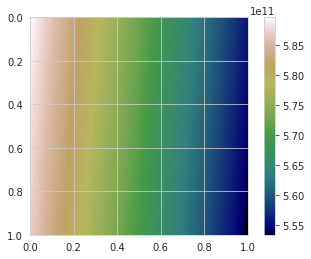

In [0]:
# Radial Basis Function(Normalizing it)
import numpy as np
import scipy.interpolate
import matplotlib.pyplot as plt
np.random.seed(2000)

x = train_data.sample(100).Latitude
y = train_data.sample(100).Longitude
z = train_data.sample(100)["'BS 1'"]

interp = scipy.interpolate.Rbf(x, y, z, function='cubic')

yi, xi = np.mgrid[0:1:100j, 0:1:100j]

zi = interp(xi, yi)

plt.plot(x, y, 'ko')
plt.imshow(zi, extent=[0, 1, 1, 0], cmap='gist_earth')
plt.colorbar()

plt.show()

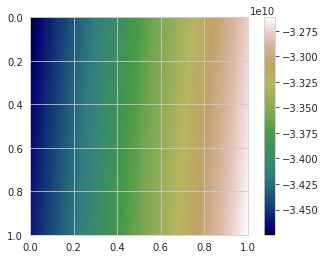

In [0]:
# Radial Basis Function(Normalizing it)
import numpy as np
import scipy.interpolate
import matplotlib.pyplot as plt
np.random.seed(2000)

x = random_subset1.Latitude
y = random_subset1.Longitude
z = random_subset1["'BS 1'"]

interp = scipy.interpolate.Rbf(x, y, z, function='cubic')

yi, xi = np.mgrid[0:1:100j, 0:1:100j]

zi = interp(xi, yi)

plt.plot(x, y, 'ko')
plt.imshow(zi, extent=[0, 1, 1, 0], cmap='gist_earth')
plt.colorbar()

plt.show()

In [0]:
import pandas as pd 
import folium
from folium.plugins import HeatMap

# Fingerprinting linear
max_amount = float(random_subset1["'BS 1'"].max())

hmap = folium.Map(location=[51.2, 4.42], zoom_start=12, width=500,height=500)

hm_wide = HeatMap( list(zip(random_subset1.Latitude.values, random_subset1.Longitude.values, random_subset1["'BS 1'"].values)),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=20, blur=15, 
                   max_zoom=1, 
                 )

hmap.add_child(hm_wide)

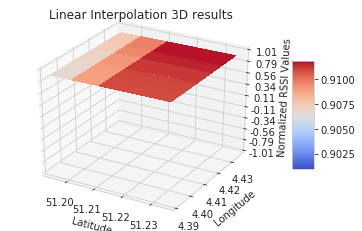

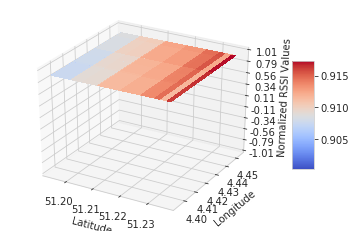

In [0]:
# This import registers the 3D projection, but is otherwise unused.
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt


fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df0.sample(20).Latitude
y = df0.sample(20).Longitude
z = random_subset1["'BS 1'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Linear Interpolation 3D results')

ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df1.sample(20).Latitude
y = df1.sample(20).Longitude
z = random_subset1["'BS 1'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

In [0]:
train_df1.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
62796,-119.0,-200,-200,-105,-100,-200,-200,-200,-200,-200,-200,-200,-104,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.96,51.235973,4.415761,2.061292
62797,-119.0,-200,-200,-200,-101,-200,-200,-200,-200,-200,-200,-200,-99,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.60,51.231884,4.405218,1.401003
62798,-119.0,-200,-200,-200,-200,-200,-200,-200,-110,-200,-200,-200,-200,-200,-200,-200,-113,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.66,51.213638,4.410793,0.862621
62799,-119.0,-200,-200,-112,-200,-200,-200,-200,-111,-200,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.94,51.235657,4.416378,2.049782
62800,-119.0,-200,-200,-200,-112,-200,-200,-200,-200,-200,-110,-200,-200,-112,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.71,51.231232,4.425323,2.063230


In [0]:
train_df1.isnull().sum().sum()

0

In [0]:
random_subset1.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
5318,-119.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-99,-200,-96,-200,-200,-200,-200,-200,-102,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.94,51.221203,4.406768,0.358544
24217,-119.0,-200,-200,-99,-200,-200,-200,-200,-200,-200,-200,-200,-93,-100,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.69,51.230610,4.412425,1.425276
74645,-106.0,-106,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.82,51.206573,4.419005,1.831907
1044,-119.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-117,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.58,51.225979,4.400267,0.747886
39684,-119.0,-112,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-108,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.65,51.194927,4.400728,2.724047


In [0]:
random_subset1.isnull().sum().sum()

0

## Fingerprinting Maps for Base Station-2

In [0]:
train_df1.shape

(78297, 73)

In [0]:
train_df1.isnull().sum().sum()

0

In [0]:
test_data.isnull().sum().sum()

0

In [0]:
len(train_df1.Latitude.unique())

10753

In [0]:
len(test_data.Latitude.unique())

9112

In [0]:
len(train_df1.Longitude.unique())

26882

In [0]:
len(test_data.Longitude.unique())

16627

In [0]:
train_sort_data = train_df1.sort_values("'BS 2'")

In [0]:
test_sort_data = test_data.sort_values("'BS 2'")

In [0]:
train_sort_data.loc[train_sort_data["'BS 2'"] == -200].shape

(56781, 73)

In [0]:
#train_sort_data1 = train_sort_data.iloc[63000:, :]

In [0]:
train_sort_data.shape

(78297, 73)

In [0]:
test_sort_data.shape

(33013, 72)

In [0]:
train_sort_data2 = train_sort_data.reset_index(drop=True)

In [0]:
test_sort_data2 = test_sort_data.reset_index(drop=True)

In [0]:
train_sort_data2.shape

(78297, 73)

In [0]:
test_sort_data2.shape

(33013, 72)

In [0]:
train_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
test_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
train_filtered_data = train_sort_data2.reset_index(drop=True)

In [0]:
test_filtered_data = test_sort_data2.reset_index(drop=True)

In [0]:
#train_filtered_data = train_sort_data2.iloc[970:1000,:]

In [0]:
train_filtered_data.groupby("'BS 2'").size()

'BS 2'
-200    56781
-125        2
-123        4
-121       10
-119       73
-118       93
-117      119
-116      179
-115      273
-114      206
-113      371
-112      450
-111      508
-110      573
-109      686
-108      759
-107      903
-106     1064
-105     1156
-104     1250
-103     1256
-102     1305
-101     1435
-100     1651
-99      1498
-98      1279
-97       971
-96       766
-95       692
-94       693
-93       591
-92       308
-91       106
-90        42
-89        28
-88        23
-87        35
-86        32
-85        43
-84        19
-83        10
-82         9
-81         9
-80        14
-79         5
-78         6
-77         2
-76         2
-75         3
-71         1
-68         2
-67         1
dtype: int64

In [0]:
# Replacing values with Nan outside range of (-150,150)
train_filtered_data["'BS 2'"]=train_filtered_data["'BS 2'"].where(train_filtered_data["'BS 2'"].between(-150,150))

In [0]:
#train_data["'BS 2'"]=train_data["'BS 2'"].where(train_data["'BS 2'"].between(-150,150))

In [0]:
train_filtered_data.shape

(78297, 73)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_filtered_data['distance'] = train_filtered_data.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_sort_data2['distance'] = train_sort_data2.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

test_filtered_data['distance'] = test_filtered_data.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

test_sort_data2['distance'] = test_sort_data2.apply(lambda row: haversine(row), axis=1)

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-61.0,NaN,-102,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-120,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.59,51.189159,4.450442,4.739514
1,-119.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-89,-200,-200,-200,-200,-105,-200,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.66,51.206333,4.393573,1.580425
2,-119.0,NaN,-200,-200,-108,-200,-200,-200,-200,-200,-114,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.63,51.231850,4.405193,1.396987
3,-119.0,NaN,-200,-200,-200,-200,-200,-200,-106,-200,-200,-94,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.94,51.218899,4.422323,1.381737
4,-119.0,NaN,-200,-200,-200,-200,-200,-200,-98,-200,-200,-200,-108,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.68,51.223026,4.419740,1.266560


In [0]:
test_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-98,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.75,51.218407,4.406668,0.310602
1,-200,-200,-200,-105,-103,-200,-200,-200,-200,-200,-200,-200,-200,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,1.35,51.231571,4.417382,1.704575
2,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-105,-110,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.60,51.227009,4.405367,0.869300
3,-200,-118,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.76,51.196632,4.401170,2.533338
4,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-98,-200,-200,-200,-115,-200,-200,-200,-200,-200,-116,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.73,51.205791,4.349908,3.963554


In [0]:
train_filtered_data.isnull().sum().sum()

56781

In [0]:
len(train_filtered_data.Latitude.unique())

10753

In [0]:
len(train_filtered_data.Longitude.unique())

26882

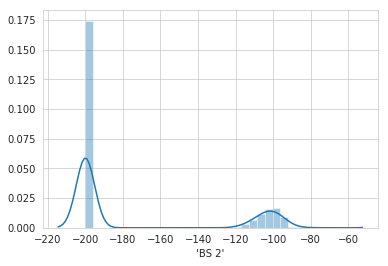

In [0]:
sns.distplot(train_sort_data2["'BS 2'"])

70% values from BS-2 have been made NaN as it is out of range. We will try to predict it using interpolation.

### Plotting Fingerprinting Heatmap for BS-2 training data

In [0]:
# Line 2.
extent = x_extent = x_min, x_max, y_min, y_max = [train_sort_data2.Latitude.min()-50, train_sort_data2.Latitude.max()+50,
                                                  train_sort_data2.Longitude.min()-10, train_sort_data2.Longitude.max()+10]

In [0]:
extent

[1.1861686700000007, 101.23601913, -5.674818516, 14.45976162]

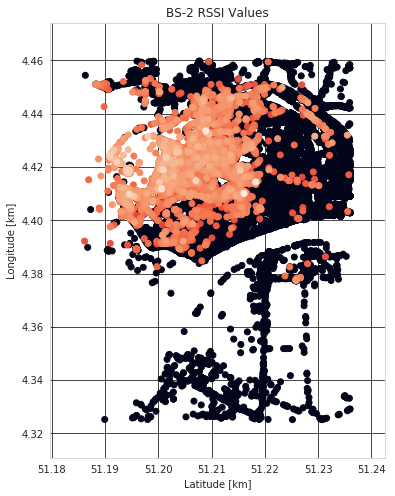

In [0]:
fig, ax = plt.subplots(figsize=(15,8))

ax.scatter(train_sort_data2.Latitude, train_sort_data2.Longitude, c=train_sort_data2["'BS 2'"])
ax.set_aspect(.5)
#ax.set_xlim(*extent[:])
#ax.set_ylim(*extent[:])
ax.set_xlabel('Latitude [km]')
ax.set_ylabel('Longitude [km]')
ax.set_title('BS-2 RSSI Values')
ax.grid(c='k', alpha=0.9)

plt.show()

### Interpolation Techniques

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-61.0,NaN,-102,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-120,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.59,51.189159,4.450442,4.739514
1,-119.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-89,-200,-200,-200,-200,-105,-200,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.66,51.206333,4.393573,1.580425
2,-119.0,NaN,-200,-200,-108,-200,-200,-200,-200,-200,-114,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.63,51.231850,4.405193,1.396987
3,-119.0,NaN,-200,-200,-200,-200,-200,-200,-106,-200,-200,-94,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.94,51.218899,4.422323,1.381737
4,-119.0,NaN,-200,-200,-200,-200,-200,-200,-98,-200,-200,-200,-108,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.68,51.223026,4.419740,1.266560


In [0]:
train_filtered_data = train_filtered_data.reset_index(drop=True)

In [0]:
test_filtered_data = test_filtered_data.reset_index(drop=True)

In [0]:
train_df = train_filtered_data.sort_values(by="'BS 2'", ascending=False)

In [0]:
test_df = test_filtered_data.sort_values(by="'BS 2'", ascending=False)

### Linear *Interpolation*

In [0]:
train_df.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
56776,-119.0,NaN,-200,-113,-200,-200,-200,-200,-107,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,1.52,51.235649,4.416477,2.052269
56777,-119.0,NaN,-200,-200,-200,-200,-200,-200,-107,-200,-108,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.82,51.231682,4.427302,2.201818
56778,-119.0,NaN,-200,-200,-200,-200,-200,-106,-114,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.81,51.209824,4.455552,3.845577
56779,-119.0,NaN,-200,-200,-200,-200,-200,-200,-107,-200,-200,-200,-112,-83,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.98,51.219715,4.409062,0.458349
56780,-119.0,NaN,-200,-200,-200,-200,-113,-200,-200,-200,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.61,51.227150,4.439483,2.715853


In [0]:
test_df.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
10325,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-109,-200,-200,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-117,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.77,51.207390,4.413971,1.556260
10324,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-111,-99,-200,-200,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.04,51.218376,4.405312,0.226507
10323,-200,-92,-103,-200,-200,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.72,51.194355,4.418590,3.001995
10322,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-106,-200,-200,-200,-110,-200,-200,-200,-200,-200,-200,-200,-200,-100,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.63,51.202896,4.407722,1.870845
15495,-200,-101,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.92,51.194386,4.406012,2.792219


In [0]:
train_df2 = train_df.interpolate(method ='linear', limit_direction ='forward')

In [0]:
train_df2.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
56776,-119.0,-125.0,-200,-113,-200,-200,-200,-200,-107,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,1.52,51.235649,4.416477,2.052269
56777,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-107,-200,-108,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.82,51.231682,4.427302,2.201818
56778,-119.0,-125.0,-200,-200,-200,-200,-200,-106,-114,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.81,51.209824,4.455552,3.845577
56779,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-107,-200,-200,-200,-112,-83,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.98,51.219715,4.409062,0.458349
56780,-119.0,-125.0,-200,-200,-200,-200,-113,-200,-200,-200,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.61,51.227150,4.439483,2.715853


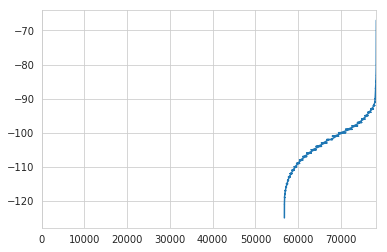

In [0]:
train_df["'BS 2'"].plot()

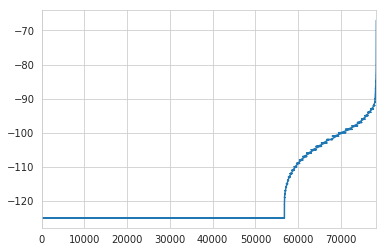

In [0]:
df_linear = train_df2["'BS 2'"].plot()

### Linear, Cubic, Quadratic *Interpolation*

In [0]:
from scipy.interpolate.rbf import Rbf  # radial basis functions
from urllib.request import urlopen
 
import matplotlib.pyplot as plt
import numpy as np

In [0]:
random_subset2 = train_df2.sample(n=100, replace=True)
random_test_subset2 = test_df.sample(n=100, replace=True)

In [0]:
random_subset22 = train_df.sample(n=100, replace=True)

In [0]:
random_subset2.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
28894,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-111,-112,-200,-200,-200,-200,-200,-112,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.68,51.226978,4.407827,0.920709
5011,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-104,-200,-200,-200,-97,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,1.05,51.235680,4.415687,2.029782
6554,-119.0,-125.0,-200,-200,-101,-200,-200,-200,-112,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.78,51.230637,4.403327,1.250778
24842,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-116,-116,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.86,51.201488,4.423728,2.480621
35791,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-100,-73,-200,-200,-200,-200,-200,-112,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.85,51.224129,4.413925,0.953716


In [0]:
# Linear Interpolation

In [0]:
df0 = random_subset2.interpolate(method ='linear', limit_direction ='backward')

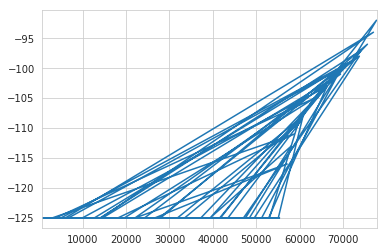

In [0]:
df_linear = df0["'BS 2'"].sample(100).plot()

In [0]:
# Cubic Interpolation

In [0]:
df1 = random_subset2.interpolate(method ='cubic', limit_direction ='backward')

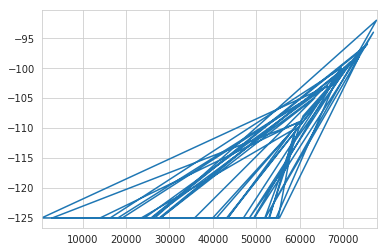

In [0]:
df_cubic = df1["'BS 2'"].plot()

In [0]:
# Quadratic Interpolation

In [0]:
df2 = random_subset2.interpolate(method ='quadratic', limit_direction ='backward')

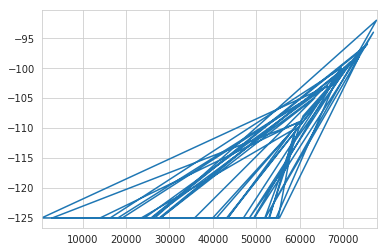

In [0]:
df_quadratic = df2
df2["'BS 2'"].plot()

In [0]:
import numpy as np; np.random.seed(0)
import seaborn as sns

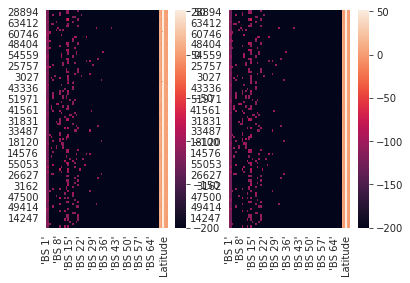

In [0]:
fig, ax =plt.subplots(1,2)

sns.heatmap(df0, ax=ax[0])
sns.heatmap(df1, ax=ax[1])

plt.show()

In [0]:
#Creating some data, with each coordinate and the values stored in separated lists
x = random_subset2.distance
y = random_subset2.distance
values = random_subset2["'BS 2'"]

In [0]:
random_subset2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
hm = random_subset2.pivot("Latitude", "Longitude", "'BS 1'")
hm.head()

Longitude,4.378221512,4.38370657,4.390473366,4.39087677,4.391435146,4.394578457,4.394758225,4.395896435,4.4000015260000005,4.400835037,4.4013032910000005,4.401666641,4.402823448,4.402928352,4.402973175,4.403176785,4.403326511,4.4037299160000005,4.403976917,4.404001713,4.405106545,4.40515995,4.405175208999999,4.405211448999999,4.405344963,4.405443192,4.40590477,4.406701565,4.407010078,4.407626629,4.407826901,4.408305168,4.408396721,4.409126758999999,4.409134865,4.409611702,4.40979147,4.410676479,4.410785198,4.410811901000001,...,4.417408466,4.417456627,4.417651653,4.417703152,4.417921543,4.418453217,4.4184598919999996,4.418561459,4.41857338,4.418578148,4.4185934069999995,4.418596745,4.41869688,4.41877842,4.419040203,4.419706821,4.420040131,4.42012167,4.423540115,4.423728466,4.424349785,4.425518513,4.425610066,4.425886631,4.433236599,4.436241627,4.436343193,4.437661648,4.437799931,4.43797493,4.439706802,4.439764977,4.439911842,4.4414634710000005,4.44664669,4.44675684,4.447276592,4.448278427,4.455621719,4.458171845
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.194160,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-119.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194199,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,-113.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194263,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,-114.0,NaN,NaN,NaN,NaN,NaN,-119.0,-119.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194305,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-119.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194321,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-119.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
hm_df = hm.interpolate(method ='linear', limit_direction ='both')

In [0]:
hm_df.head()

Longitude,4.378221512,4.38370657,4.390473366,4.39087677,4.391435146,4.394578457,4.394758225,4.395896435,4.4000015260000005,4.400835037,4.4013032910000005,4.401666641,4.402823448,4.402928352,4.402973175,4.403176785,4.403326511,4.4037299160000005,4.403976917,4.404001713,4.405106545,4.40515995,4.405175208999999,4.405211448999999,4.405344963,4.405443192,4.40590477,4.406701565,4.407010078,4.407626629,4.407826901,4.408305168,4.408396721,4.409126758999999,4.409134865,4.409611702,4.40979147,4.410676479,4.410785198,4.410811901000001,...,4.417408466,4.417456627,4.417651653,4.417703152,4.417921543,4.418453217,4.4184598919999996,4.418561459,4.41857338,4.418578148,4.4185934069999995,4.418596745,4.41869688,4.41877842,4.419040203,4.419706821,4.420040131,4.42012167,4.423540115,4.423728466,4.424349785,4.425518513,4.425610066,4.425886631,4.433236599,4.436241627,4.436343193,4.437661648,4.437799931,4.43797493,4.439706802,4.439764977,4.439911842,4.4414634710000005,4.44664669,4.44675684,4.447276592,4.448278427,4.455621719,4.458171845
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.194160,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-102.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-108.0,-110.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,...,-96.0,-119.0,-113.0,-108.0,-119.0,-113.0,-114.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-105.0,-119.0,-112.0,-119.0,-119.0,-119.0,-119.0,-119.0,-106.0,-114.0,-119.0,-119.0,-119.0,-111.0,-119.0,-119.0,-101.0,-119.0,-108.0
51.194199,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-102.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-108.0,-110.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,...,-96.0,-119.0,-113.0,-108.0,-119.0,-113.0,-114.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-105.0,-119.0,-112.0,-119.0,-119.0,-119.0,-119.0,-119.0,-106.0,-114.0,-119.0,-119.0,-119.0,-111.0,-119.0,-119.0,-101.0,-119.0,-108.0
51.194263,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-102.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-108.0,-110.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,...,-96.0,-119.0,-113.0,-108.0,-119.0,-113.0,-114.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-105.0,-119.0,-112.0,-119.0,-119.0,-119.0,-119.0,-119.0,-106.0,-114.0,-119.0,-119.0,-119.0,-111.0,-119.0,-119.0,-101.0,-119.0,-108.0
51.194305,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-102.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-108.0,-110.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,...,-96.0,-119.0,-113.0,-108.0,-119.0,-113.0,-114.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-105.0,-119.0,-112.0,-119.0,-119.0,-119.0,-119.0,-119.0,-106.0,-114.0,-119.0,-119.0,-119.0,-111.0,-119.0,-119.0,-101.0,-119.0,-108.0
51.194321,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-102.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-108.0,-110.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,...,-96.0,-119.0,-113.0,-108.0,-119.0,-113.0,-114.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-105.0,-119.0,-112.0,-119.0,-119.0,-119.0,-119.0,-119.0,-106.0,-114.0,-119.0,-119.0,-119.0,-111.0,-119.0,-119.0,-101.0,-119.0,-108.0


In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

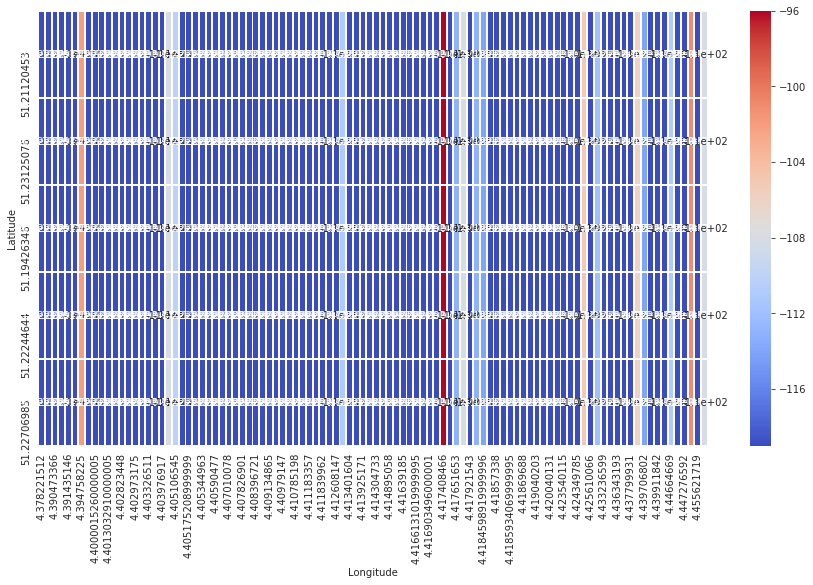

In [0]:
plt.figure(figsize=(15,8))
sns.heatmap(hm_df.sample(5), annot=True, linewidth = 0.9, cmap='coolwarm')

### AutoEncoder Imputation

In [0]:
from numpy import nan
from sklearn.preprocessing import Imputer

In [0]:
traincols = train_df.columns.tolist() 
traincols.remove('Latitude')
traincols.remove('Longitude')
traincols.remove('distance')
len(traincols)

70

In [0]:
columns_X = traincols
x = train_df[columns_X]

In [0]:
columns_y = ['Latitude','Longitude']
y = train_df[columns_y]

In [0]:
imp = Imputer(strategy='mean')
X2 = imp.fit_transform(train_df)
X2

array([[-119.        ,  -67.        , -200.        , ...,   51.21608353,
           4.41009998,    0.64512081],
       [-119.        ,  -68.        , -200.        , ...,   51.20889664,
           4.43358517,    2.4601065 ],
       [-119.        ,  -68.        , -200.        , ...,   51.21827698,
           4.41438484,    0.83710601],
       ...,
       [-119.        , -102.36972486, -200.        , ...,   51.20982361,
           4.45555162,    3.84557655],
       [-119.        , -102.36972486, -200.        , ...,   51.21971512,
           4.40906191,    0.45834928],
       [-119.        , -102.36972486, -200.        , ...,   51.22714996,
           4.43948317,    2.71585255]])

In [0]:
model = LinearRegression().fit(X2, y)
model.predict(X2)

array([[51.21608353,  4.41009998],
       [51.20889664,  4.43358517],
       [51.21827698,  4.41438484],
       ...,
       [51.20982361,  4.45555162],
       [51.21971512,  4.40906191],
       [51.22714996,  4.43948317]])

In [0]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures

model = make_pipeline(Imputer(strategy='mean'),
                      PolynomialFeatures(degree=2),
                      LinearRegression())

In [0]:
def make_reconstruction_loss(n_features):

    def reconstruction_loss(input_and_mask, y_pred):
        X_values = input_and_mask[:, :n_features]
        X_values.name = "$X_values"

        missing_mask = input_and_mask[:, n_features:]
        missing_mask.name = "$missing_mask"
        observed_mask = 1 - missing_mask
        observed_mask.name = "$observed_mask"

        X_values_observed = X_values * observed_mask
        X_values_observed.name = "$X_values_observed"

        pred_observed = y_pred * observed_mask
        pred_observed.name = "$y_pred_observed"

        return mse(y_true=X_values_observed, y_pred=pred_observed)
    return reconstruction_loss
  
def masked_mae(X_true, X_pred, mask):
    masked_diff = X_true[mask] - X_pred[mask]
    return np.mean(np.abs(masked_diff))

In [0]:
import random
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
from keras.utils import np_utils
from sklearn.preprocessing import LabelEncoder

from keras.objectives import mse
from keras.models import Sequential
from keras.layers.core import Dropout, Dense

from keras.regularizers import L1L2

from collections import defaultdict

%matplotlib inline

In [0]:
class Autoencoder:

    def __init__(self, data,
                 recurrent_weight=0.5,
                 optimizer="adam",
                 dropout_probability=0.5,
                 hidden_activation="relu",
                 output_activation="sigmoid",
                 init="glorot_normal",
                 L1_penalty=0,
                 L2_penalty=0):
        self.data = data.copy()
        self.recurrent_weight = recurrent_weight
        self.optimizer = optimizer
        self.dropout_probability = dropout_probability
        self.hidden_activation = hidden_activation
        self.output_activation = output_activation
        self.init = init
        self.L1_penalty = L1_penalty
        self.L2_penalty = L2_penalty

    def _get_hidden_layer_sizes(self):
        n_dims = self.data.shape[1]
        return [
            min(2000, 8 * n_dims),
            min(500, 2 * n_dims),
            int(np.ceil(0.5 * n_dims)),
        ]

    def _create_model(self):

        hidden_layer_sizes = self._get_hidden_layer_sizes()
        first_layer_size = hidden_layer_sizes[0]
        n_dims = self.data.shape[1]

        model = Sequential()

        model.add(Dense(
            first_layer_size,
            input_dim= 2 * n_dims,
            activation=self.hidden_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))
        model.add(Dropout(self.dropout_probability))

        for layer_size in hidden_layer_sizes[1:]:
            model.add(Dense(
                layer_size,
                activation=self.hidden_activation,
                W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
                init=self.init))
            model.add(Dropout(self.dropout_probability))

        model.add(Dense(
            n_dims,
            activation=self.output_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))

        loss_function = make_reconstruction_loss(n_dims)

        model.compile(optimizer=self.optimizer, loss=loss_function)
        return model

    def fill(self, missing_mask):
        self.data[missing_mask] = -1

    def _create_missing_mask(self):
        if self.data.dtype != "f" and self.data.dtype != "d":
            self.data = self.data.astype(float)

        return np.isnan(self.data)

    def _train_epoch(self, model, missing_mask, batch_size):
        input_with_mask = np.hstack([self.data, missing_mask])
        n_samples = len(input_with_mask)
        n_batches = int(np.ceil(n_samples / batch_size))
        indices = np.arange(n_samples)
        np.random.shuffle(indices)
        X_shuffled = input_with_mask[indices]

        for batch_idx in range(n_batches):
            batch_start = batch_idx * batch_size
            batch_end = (batch_idx + 1) * batch_size
            batch_data = X_shuffled[batch_start:batch_end, :]
            model.train_on_batch(batch_data, batch_data)
        return model.predict(input_with_mask)

    def train(self, batch_size=256, train_epochs=100):
        missing_mask = self._create_missing_mask()
        self.fill(missing_mask)
        self.model = self._create_model()

        observed_mask = ~missing_mask

        for epoch in range(train_epochs):
            X_pred = self._train_epoch(self.model, missing_mask, batch_size)
            observed_mae = masked_mae(X_true=self.data,
                                    X_pred=X_pred,
                                    mask=observed_mask)
            if epoch % 50 == 0:
                print("observed mae:", observed_mae)

            old_weight = (1.0 - self.recurrent_weight)
            self.data[missing_mask] *= old_weight
            pred_missing = X_pred[missing_mask]
            self.data[missing_mask] += self.recurrent_weight * pred_missing
        return self.data.copy()

In [0]:
train_df["'BS 2'"] = pd.to_numeric(train_df["'BS 2'"], errors='coerce')

In [0]:
train_df3 = train_df.dropna(subset=["'BS 2'"])


In [0]:
train_df3["'BS 2'"] = train_df3["'BS 2'"].astype(int)

In [0]:
missing_encoded = pd.get_dummies(train_df)

for col in train_df.columns:
    missing_cols = missing_encoded.columns.str.startswith(str(col) + "_")
    missing_encoded.loc[train_df[col].isnull(), missing_cols] = np.nan

In [0]:
missing_encoded.values

array([[-119.        ,  -67.        , -200.        , ...,   51.21608353,
           4.41009998,    0.64512081],
       [-119.        ,  -68.        , -200.        , ...,   51.20889664,
           4.43358517,    2.4601065 ],
       [-119.        ,  -68.        , -200.        , ...,   51.21827698,
           4.41438484,    0.83710601],
       ...,
       [-119.        ,           nan, -200.        , ...,   51.20982361,
           4.45555162,    3.84557655],
       [-119.        ,           nan, -200.        , ...,   51.21971512,
           4.40906191,    0.45834928],
       [-119.        ,           nan, -200.        , ...,   51.22714996,
           4.43948317,    2.71585255]])

In [0]:
#pip install autoencoder-impute

In [0]:
def mle(row):
    res = np.zeros(row.shape[0])
    res[np.argmax(row)] = 1
    return res

col_classes = [len(train_df[c].unique()) for c in train_df.columns]

dummy_df = pd.get_dummies(train_df)

mle_complete = None

for i, cnt in enumerate(col_classes):
    start_idx = int(sum(col_classes[0:i]))
    col_true = dummy_df.values[:, start_idx:start_idx+cnt]
    col_completed = complete_encoded[:, start_idx:start_idx+cnt]
    mle_completed = np.apply_along_axis(mle, axis=1, arr=col_completed)
    if mle_complete is None:
        mle_complete = mle_completed
    else:
        mle_complete = np.hstack([mle_complete, mle_completed])

In [0]:
model.fit(x, y)  # X with missing values, from above
print(model.predict(x))

[[51.21328592  4.41948318]
 [51.20157099  4.41653442]
 [51.21482229  4.41938782]
 ...
 [51.20866537  4.45732498]
 [51.22380114  4.41303635]
 [51.22622919  4.4396019 ]]


In [0]:
random_subset2.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
14247,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-111,-109,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.25,51.218948,4.403730,0.099295
3826,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-96,-200,-107,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.98,51.221207,4.407627,0.409678
43471,-102.0,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.62,51.213341,4.394758,0.862962
59701,-119.0,-109.0,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.60,51.207367,4.423540,1.984468
14030,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-109,-200,-200,-99,-200,-101,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.63,51.219475,4.418561,1.118643


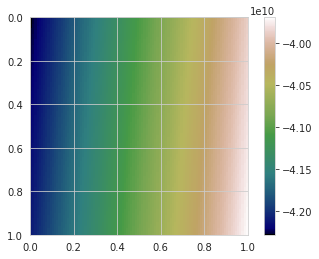

In [0]:
# Radial Basis Function(Normalizing it)
import numpy as np
import scipy.interpolate
import matplotlib.pyplot as plt
np.random.seed(2000)

x = random_subset2.Latitude
y = random_subset2.Longitude
z = random_subset2["'BS 2'"]

interp = scipy.interpolate.Rbf(x, y, z, function='cubic')

yi, xi = np.mgrid[0:1:100j, 0:1:100j]

zi = interp(xi, yi)

plt.plot(x, y, 'ko')
plt.imshow(zi, extent=[0, 1, 1, 0], cmap='gist_earth')
plt.colorbar()

plt.show()

In [0]:
import pandas as pd 
import folium
from folium.plugins import HeatMap

# Fingerprinting linear
max_amount = float(random_subset2["'BS 2'"].max())

hmap = folium.Map(location=[51.2, 4.42], zoom_start=12, width=500,height=500)

hm_wide = HeatMap( list(zip(random_subset2.Latitude.values, random_subset2.Longitude.values, random_subset2["'BS 2'"].values)),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=20, blur=15, 
                   max_zoom=1, 
                 )

hmap.add_child(hm_wide)

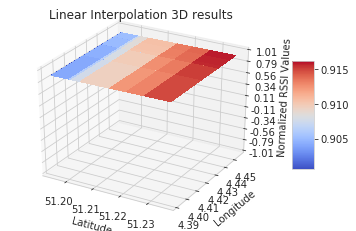

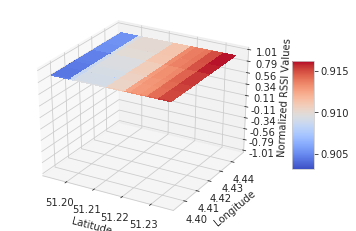

In [0]:
# This import registers the 3D projection, but is otherwise unused.
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt


fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df0.sample(20).Latitude
y = df0.sample(20).Longitude
z = random_subset2["'BS 1'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Linear Interpolation 3D results')

ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df1.sample(20).Latitude
y = df1.sample(20).Longitude
z = random_subset2["'BS 2'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

In [0]:
train_df2.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
56776,-119.0,-125.0,-200,-113,-200,-200,-200,-200,-107,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,1.52,51.235649,4.416477,2.052269
56777,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-107,-200,-108,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.82,51.231682,4.427302,2.201818
56778,-119.0,-125.0,-200,-200,-200,-200,-200,-106,-114,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.81,51.209824,4.455552,3.845577
56779,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-107,-200,-200,-200,-112,-83,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.98,51.219715,4.409062,0.458349
56780,-119.0,-125.0,-200,-200,-200,-200,-113,-200,-200,-200,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.61,51.227150,4.439483,2.715853


In [0]:
random_subset2.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
14247,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-111,-109,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.25,51.218948,4.403730,0.099295
3826,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-96,-200,-107,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.98,51.221207,4.407627,0.409678
43471,-102.0,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.62,51.213341,4.394758,0.862962
59701,-119.0,-109.0,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.60,51.207367,4.423540,1.984468
14030,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-109,-200,-200,-99,-200,-101,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.63,51.219475,4.418561,1.118643


In [0]:
random_subset2.isnull().sum().sum()

0

In [0]:
train_df2.isnull().sum().sum()

0

## Fingerprinting Maps for Base Station-7

In [0]:
train_df2.isnull().sum().sum()

0

In [0]:
test_data.isnull().sum().sum()

0

In [0]:
len(train_df2.Latitude.unique())

10753

In [0]:
len(test_data.Latitude.unique())

9112

In [0]:
len(train_df2.Longitude.unique())

26882

In [0]:
len(test_data.Longitude.unique())

16627

In [0]:
train_sort_data = train_df2.sort_values("'BS 7'")

In [0]:
test_sort_data = test_data.sort_values("'BS 7'")

In [0]:
train_sort_data.loc[train_sort_data["'BS 7'"] == -200].shape

(72497, 73)

In [0]:
#train_sort_data1 = train_sort_data.iloc[83000:, :]

In [0]:
train_sort_data.shape

(78297, 73)

In [0]:
test_sort_data.shape

(33013, 72)

In [0]:
train_sort_data2 = train_sort_data.reset_index(drop=True)

In [0]:
test_sort_data2 = test_sort_data.reset_index(drop=True)

In [0]:
train_sort_data2.shape

(78297, 73)

In [0]:
test_sort_data2.shape

(33013, 72)

In [0]:
train_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
test_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
train_filtered_data = train_sort_data2.reset_index(drop=True)

In [0]:
test_filtered_data = test_sort_data2.reset_index(drop=True)

In [0]:
#train_filtered_data = train_sort_data2.iloc[970:1000,:]

In [0]:
train_filtered_data.groupby("'BS 7'").size()

'BS 7'
-200    72497
-125        2
-123        3
-121       14
-120       77
-119      261
-118      131
-117      404
-116       49
-115      427
-114      403
-113      372
-112      248
-111      343
-110       74
-109      391
-108      345
-107      357
-106      255
-105      288
-104       81
-103      213
-102      182
-101      192
-100      102
-99       123
-98        38
-97        71
-96        78
-95        58
-94        28
-93        32
-92        17
-91        26
-90        17
-89        24
-88         7
-87        12
-86         3
-85         9
-84         7
-83         6
-82         3
-81         7
-80         1
-79         3
-78         5
-77         2
-76         2
-75         3
-74         2
-69         1
-66         1
dtype: int64

In [0]:
# Replacing values with Nan outside range of (-150,150)
train_filtered_data["'BS 7'"]=train_filtered_data["'BS 7'"].where(train_filtered_data["'BS 7'"].between(-150,150))

In [0]:
#train_data["'BS 7'"]=train_data["'BS 7'"].where(train_data["'BS 7'"].between(-150,150))

In [0]:
train_filtered_data.shape

(78297, 73)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_filtered_data['distance'] = train_filtered_data.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_sort_data2['distance'] = train_sort_data2.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

test_filtered_data['distance'] = test_filtered_data.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

test_sort_data2['distance'] = test_sort_data2.apply(lambda row: haversine(row), axis=1)

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-119.0,-67.0,-200,-200,-200,-200,NaN,-200,-110,-200,-200,-200,-200,-87,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.95,51.216084,4.410100,0.645121
1,-119.0,-125.0,-200,-200,-103,-200,NaN,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.69,51.232262,4.403017,1.430604
2,-119.0,-125.0,-200,-200,-200,-200,NaN,-200,-94,-200,-200,-200,-200,-101,-200,-200,-200,-200,-200,-200,-200,-101,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.76,51.219826,4.419638,1.194534
3,-119.0,-125.0,-200,-200,-200,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.71,51.219078,4.404943,0.173902
4,-119.0,-125.0,-200,-200,-200,-200,NaN,-200,-112,-200,-200,-200,-105,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.69,51.227180,4.408490,0.960470


In [0]:
test_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-98,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.75,51.218407,4.406668,0.310602
1,-200,-200,-200,-105,-103,-200,-200,-200,-200,-200,-200,-200,-200,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,1.35,51.231571,4.417382,1.704575
2,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-105,-110,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.60,51.227009,4.405367,0.869300
3,-200,-118,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.76,51.196632,4.401170,2.533338
4,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-98,-200,-200,-200,-115,-200,-200,-200,-200,-200,-116,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.73,51.205791,4.349908,3.963554


In [0]:
train_filtered_data.isnull().sum().sum()

72497

In [0]:
len(train_filtered_data.Latitude.unique())

10753

In [0]:
len(train_filtered_data.Longitude.unique())

26882

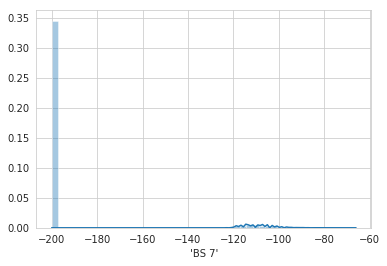

In [0]:
sns.distplot(train_sort_data2["'BS 7'"])

70% values from BS-1 have been made NaN as it is out of range. We will try to predict it using interpolation.

### Plotting Fingerprinting Heatmap for BS-1 training data

In [0]:
# Line 2.
extent = x_extent = x_min, x_max, y_min, y_max = [train_sort_data2.Latitude.min()-50, train_sort_data2.Latitude.max()+50,
                                                  train_sort_data2.Longitude.min()-10, train_sort_data2.Longitude.max()+10]

In [0]:
extent

[1.1861686700000007, 101.23601913, -5.674818516, 14.45976162]

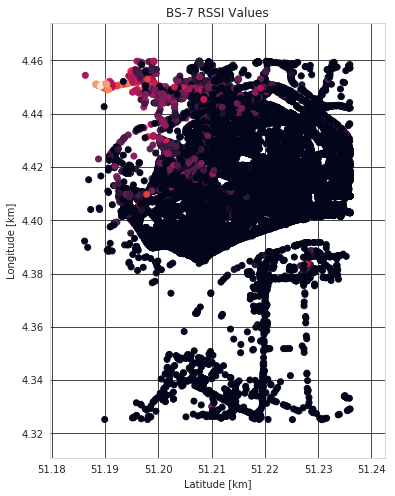

In [0]:
fig, ax = plt.subplots(figsize=(15,8))

ax.scatter(train_sort_data2.Latitude, train_sort_data2.Longitude, c=train_sort_data2["'BS 1'"])
ax.set_aspect(.5)
#ax.set_xlim(*extent[:])
#ax.set_ylim(*extent[:])
ax.set_xlabel('Latitude [km]')
ax.set_ylabel('Longitude [km]')
ax.set_title('BS-7 RSSI Values')
ax.grid(c='k', alpha=0.9)

plt.show()

### Interpolation Techniques

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-119.0,-67.0,-200,-200,-200,-200,NaN,-200,-110,-200,-200,-200,-200,-87,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.95,51.216084,4.410100,0.645121
1,-119.0,-125.0,-200,-200,-103,-200,NaN,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.69,51.232262,4.403017,1.430604
2,-119.0,-125.0,-200,-200,-200,-200,NaN,-200,-94,-200,-200,-200,-200,-101,-200,-200,-200,-200,-200,-200,-200,-101,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.76,51.219826,4.419638,1.194534
3,-119.0,-125.0,-200,-200,-200,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.71,51.219078,4.404943,0.173902
4,-119.0,-125.0,-200,-200,-200,-200,NaN,-200,-112,-200,-200,-200,-105,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.69,51.227180,4.408490,0.960470


In [0]:
train_filtered_data = train_filtered_data.reset_index(drop=True)

In [0]:
test_filtered_data = test_filtered_data.reset_index(drop=True)

In [0]:
train_df = train_filtered_data.sort_values(by="'BS 7'", ascending=False)

In [0]:
test_df = test_filtered_data.sort_values(by="'BS 7'", ascending=False)

### Linear *Interpolation*

In [0]:
train_df.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
72492,-119.0,-125.0,-200,-200,-113,-200,NaN,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.65,51.228138,4.411366,1.151212
72493,-119.0,-125.0,-200,-200,-200,-200,NaN,-200,-200,-200,-200,-200,-107,-91,-200,-200,-200,-200,-200,-100,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.70,51.220863,4.415699,0.933498
72494,-119.0,-125.0,-200,-106,-105,-200,NaN,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,1.70,51.235752,4.416232,2.054360
72495,-119.0,-125.0,-200,-200,-200,-200,NaN,-200,-113,-200,-200,-200,-114,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.77,51.224827,4.425766,1.729034
72496,-119.0,-125.0,-200,-200,-200,-200,NaN,-200,-200,-87,-200,-119,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.55,51.194736,4.419562,2.988956


In [0]:
test_df.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
10755,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-103,-200,-106,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.69,51.230972,4.412065,1.448953
10753,-200,-200,-200,-200,-200,-200,-200,-200,-104,-200,-200,-200,-91,-94,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.71,51.229843,4.417033,1.540360
10752,-200,-200,-200,-114,-200,-200,-200,-200,-200,-200,-111,-200,-102,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.89,51.230270,4.413463,1.429644
10751,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-100,-116,-200,-200,-200,-200,-200,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.62,51.198006,4.394962,2.436208
30989,-63,-200,-100,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.59,51.189468,4.450430,4.714604


In [0]:
train_df7 = train_df.interpolate(method ='linear', limit_direction ='forward')

In [0]:
train_df7.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
72492,-119.0,-125.0,-200,-200,-113,-200,-125.0,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.65,51.228138,4.411366,1.151212
72493,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-200,-200,-200,-200,-107,-91,-200,-200,-200,-200,-200,-100,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.70,51.220863,4.415699,0.933498
72494,-119.0,-125.0,-200,-106,-105,-200,-125.0,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,1.70,51.235752,4.416232,2.054360
72495,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-113,-200,-200,-200,-114,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.77,51.224827,4.425766,1.729034
72496,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-200,-87,-200,-119,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.55,51.194736,4.419562,2.988956


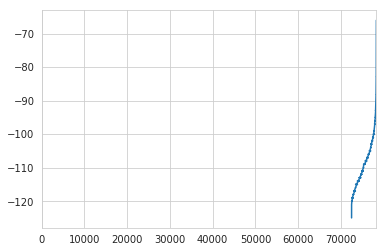

In [0]:
train_df["'BS 7'"].plot()

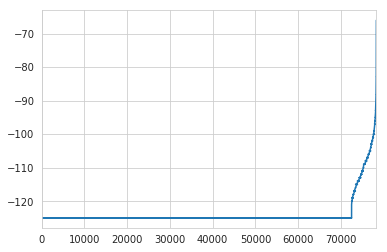

In [0]:
df_linear = train_df7["'BS 7'"].plot()

### Linear, Cubic, Quadratic *Interpolation*

In [0]:
from scipy.interpolate.rbf import Rbf  # radial basis functions
from urllib.request import urlopen
 
import matplotlib.pyplot as plt
import numpy as np

In [0]:
random_subset7 = train_df7.sample(n=100, replace=True)
random_test_subset7 = test_df.sample(n=100, replace=True)
random_subset77 = train_df7.sample(n=100, replace=True)

In [0]:
#random_subset7 = train_df.sample(n=100, replace=True)

In [0]:
random_subset7.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
44610,-119.0,-106.0,-200,-200,-200,-200,-125.0,-200,-114,-200,-200,-200,-114,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.73,51.216343,4.405648,0.404514
20727,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-102,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-104,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.76,51.228252,4.406476,1.022554
22270,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-200,-200,-200,-200,-108,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-99,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.74,51.231689,4.405108,1.378544
40558,-103.0,-101.0,-200,-200,-200,-200,-125.0,-200,-200,-82,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.72,51.194065,4.418083,3.019050
51507,-113.0,-94.0,-200,-200,-200,-200,-125.0,-200,-200,-99,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.65,51.194046,4.418632,3.034966


In [0]:
# Linear Interpolation

In [0]:
df0 = random_subset7.interpolate(method ='linear', limit_direction ='backward')

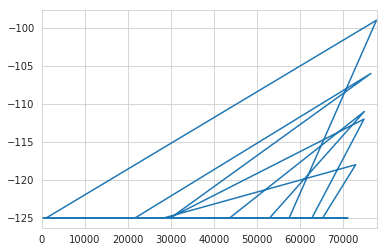

In [0]:
df_linear = df0["'BS 7'"].sample(100).plot()

In [0]:
# Cubic Interpolation

In [0]:
df1 = random_subset7.interpolate(method ='cubic', limit_direction ='backward')

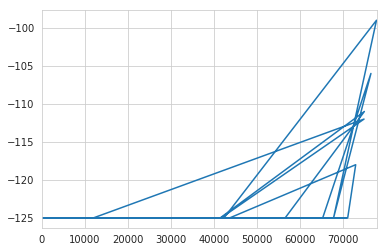

In [0]:
df_cubic = df1["'BS 7'"].plot()

In [0]:
# Quadratic Interpolation

In [0]:
df2 = random_subset7.interpolate(method ='quadratic', limit_direction ='backward')

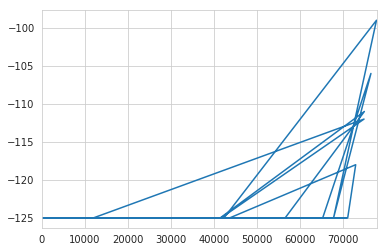

In [0]:
df_quadratic = df2
df2["'BS 7'"].plot()

In [0]:
import numpy as np; np.random.seed(0)
import seaborn as sns

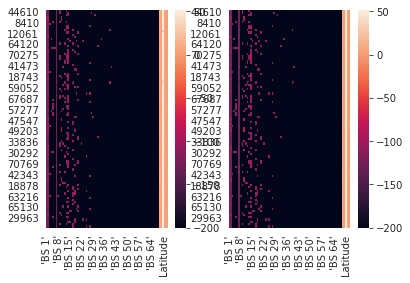

In [0]:
fig, ax =plt.subplots(1,2)

sns.heatmap(df0, ax=ax[0])
sns.heatmap(df1, ax=ax[1])

plt.show()

In [0]:
#Creating some data, with each coordinate and the values stored in separated lists
x = random_subset7.distance
y = random_subset7.distance
values = random_subset7["'BS 7'"]

In [0]:
random_subset7.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
hm = random_subset7.pivot("Latitude", "Longitude", "'BS 7'")
hm.head()

Longitude,4.377441883,4.389744759,4.39151001,4.391785145,4.39201355,4.392584801,4.393676758,4.39435339,4.40075016,4.400760174,4.402266502,4.402484894,4.403581619,4.403689861,4.4040732380000005,4.404283523999999,4.404333115,4.404438496,4.404451847,4.404461861000001,4.4047517780000005,4.404963493,4.4051084519999995,4.405200005,4.405388355,4.405648232,4.4058666230000005,4.405958176,4.406374931,4.406414986000001,4.406476498,4.406663418,4.4074501989999995,4.407674789,4.408151627,4.40967989,4.410093308,4.410473347,4.411388397,4.411540031,...,4.418083191,4.41825819,4.418363094,4.4184064869999995,4.418425083,4.418515205,4.418581486,4.41862011,4.418631554,4.418654919,4.4188518519999995,4.418911457,4.4189267160000005,4.418943405,4.419363499,4.420683384,4.421595097,4.422183513999999,4.423438549,4.423741818,4.424073218999999,4.425411701,4.42550993,4.425561905,4.425654888,4.427346706,4.427616596,4.429291725,4.430366516,4.431831837,4.431891441,4.4328498839999995,4.433371544,4.4349617960000005,4.436369896,4.442035198,4.447468281,4.4480466839999995,4.454249859,4.454851627
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.194046,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-125.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194065,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-125.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194141,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-125.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194187,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,-125.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,-125.0,-125.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
hm_df = hm.interpolate(method ='linear', limit_direction ='both')

In [0]:
hm_df.head()

Longitude,4.377441883,4.389744759,4.39151001,4.391785145,4.39201355,4.392584801,4.393676758,4.39435339,4.40075016,4.400760174,4.402266502,4.402484894,4.403581619,4.403689861,4.4040732380000005,4.404283523999999,4.404333115,4.404438496,4.404451847,4.404461861000001,4.4047517780000005,4.404963493,4.4051084519999995,4.405200005,4.405388355,4.405648232,4.4058666230000005,4.405958176,4.406374931,4.406414986000001,4.406476498,4.406663418,4.4074501989999995,4.407674789,4.408151627,4.40967989,4.410093308,4.410473347,4.411388397,4.411540031,...,4.418083191,4.41825819,4.418363094,4.4184064869999995,4.418425083,4.418515205,4.418581486,4.41862011,4.418631554,4.418654919,4.4188518519999995,4.418911457,4.4189267160000005,4.418943405,4.419363499,4.420683384,4.421595097,4.422183513999999,4.423438549,4.423741818,4.424073218999999,4.425411701,4.42550993,4.425561905,4.425654888,4.427346706,4.427616596,4.429291725,4.430366516,4.431831837,4.431891441,4.4328498839999995,4.433371544,4.4349617960000005,4.436369896,4.442035198,4.447468281,4.4480466839999995,4.454249859,4.454851627
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.194046,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,...,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-99.0,-106.0,-111.0,-125.0,-118.0,-125.0,-112.0,-125.0,-125.0
51.194065,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,...,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-99.0,-106.0,-111.0,-125.0,-118.0,-125.0,-112.0,-125.0,-125.0
51.194141,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,...,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-99.0,-106.0,-111.0,-125.0,-118.0,-125.0,-112.0,-125.0,-125.0
51.194187,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,...,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-99.0,-106.0,-111.0,-125.0,-118.0,-125.0,-112.0,-125.0,-125.0
51.194244,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,...,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-99.0,-106.0,-111.0,-125.0,-118.0,

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

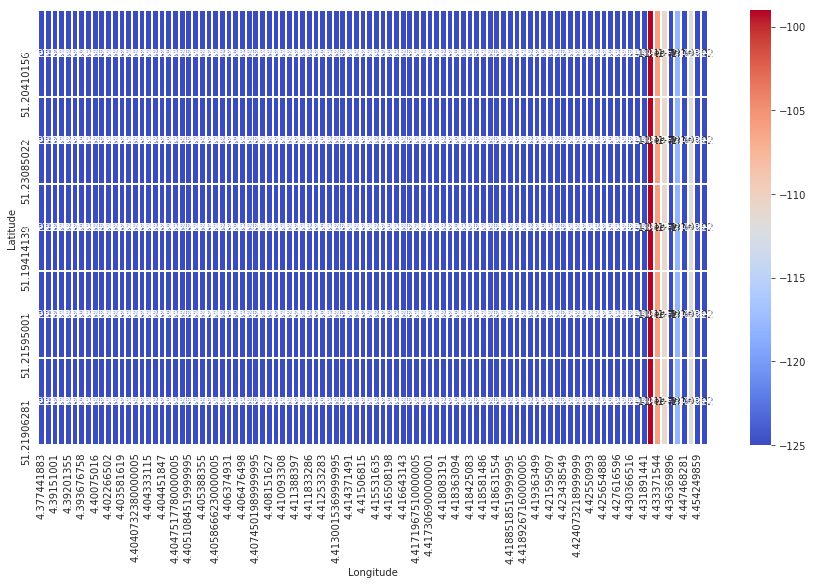

In [0]:
plt.figure(figsize=(15,8))
sns.heatmap(hm_df.sample(5), annot=True, linewidth = 0.9, cmap='coolwarm')

### AutoEncoder Imputation

In [0]:
from numpy import nan
from sklearn.preprocessing import Imputer

In [0]:
traincols = train_df.columns.tolist() 
traincols.remove('Latitude')
traincols.remove('Longitude')
traincols.remove('distance')
len(traincols)

70

In [0]:
columns_X = traincols
x = train_df[columns_X]

In [0]:
columns_y = ['Latitude','Longitude']
y = train_df[columns_y]

In [0]:
imp = Imputer(strategy='mean')
X2 = imp.fit_transform(train_df)
X2

array([[-119.        , -125.        , -200.        , ...,   51.21829605,
           4.45920515,    3.95123119],
       [-119.        , -125.        , -200.        , ...,   51.21841049,
           4.45896482,    3.93412007],
       [-119.        , -125.        , -200.        , ...,   51.21832657,
           4.45910835,    3.94438734],
       ...,
       [-119.        , -125.        , -200.        , ...,   51.23575211,
           4.41623163,    2.05435969],
       [-119.        , -125.        , -200.        , ...,   51.22482681,
           4.42576647,    1.72903397],
       [-119.        , -125.        , -200.        , ...,   51.19473648,
           4.41956186,    2.98895649]])

In [0]:
model = LinearRegression().fit(X2, y)
model.predict(X2)

array([[51.21829605,  4.45920515],
       [51.21841049,  4.45896482],
       [51.21832657,  4.45910835],
       ...,
       [51.23575211,  4.41623163],
       [51.22482681,  4.42576647],
       [51.19473648,  4.41956186]])

In [0]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures

model = make_pipeline(Imputer(strategy='mean'),
                      PolynomialFeatures(degree=2),
                      LinearRegression())

In [0]:
def make_reconstruction_loss(n_features):

    def reconstruction_loss(input_and_mask, y_pred):
        X_values = input_and_mask[:, :n_features]
        X_values.name = "$X_values"

        missing_mask = input_and_mask[:, n_features:]
        missing_mask.name = "$missing_mask"
        observed_mask = 1 - missing_mask
        observed_mask.name = "$observed_mask"

        X_values_observed = X_values * observed_mask
        X_values_observed.name = "$X_values_observed"

        pred_observed = y_pred * observed_mask
        pred_observed.name = "$y_pred_observed"

        return mse(y_true=X_values_observed, y_pred=pred_observed)
    return reconstruction_loss
  
def masked_mae(X_true, X_pred, mask):
    masked_diff = X_true[mask] - X_pred[mask]
    return np.mean(np.abs(masked_diff))

In [0]:
import random
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
from keras.utils import np_utils
from sklearn.preprocessing import LabelEncoder

from keras.objectives import mse
from keras.models import Sequential
from keras.layers.core import Dropout, Dense

from keras.regularizers import L1L2

from collections import defaultdict

%matplotlib inline

In [0]:
class Autoencoder:

    def __init__(self, data,
                 recurrent_weight=0.5,
                 optimizer="adam",
                 dropout_probability=0.5,
                 hidden_activation="relu",
                 output_activation="sigmoid",
                 init="glorot_normal",
                 L1_penalty=0,
                 L2_penalty=0):
        self.data = data.copy()
        self.recurrent_weight = recurrent_weight
        self.optimizer = optimizer
        self.dropout_probability = dropout_probability
        self.hidden_activation = hidden_activation
        self.output_activation = output_activation
        self.init = init
        self.L1_penalty = L1_penalty
        self.L2_penalty = L2_penalty

    def _get_hidden_layer_sizes(self):
        n_dims = self.data.shape[1]
        return [
            min(2000, 8 * n_dims),
            min(500, 2 * n_dims),
            int(np.ceil(0.5 * n_dims)),
        ]

    def _create_model(self):

        hidden_layer_sizes = self._get_hidden_layer_sizes()
        first_layer_size = hidden_layer_sizes[0]
        n_dims = self.data.shape[1]

        model = Sequential()

        model.add(Dense(
            first_layer_size,
            input_dim= 2 * n_dims,
            activation=self.hidden_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))
        model.add(Dropout(self.dropout_probability))

        for layer_size in hidden_layer_sizes[1:]:
            model.add(Dense(
                layer_size,
                activation=self.hidden_activation,
                W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
                init=self.init))
            model.add(Dropout(self.dropout_probability))

        model.add(Dense(
            n_dims,
            activation=self.output_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))

        loss_function = make_reconstruction_loss(n_dims)

        model.compile(optimizer=self.optimizer, loss=loss_function)
        return model

    def fill(self, missing_mask):
        self.data[missing_mask] = -1

    def _create_missing_mask(self):
        if self.data.dtype != "f" and self.data.dtype != "d":
            self.data = self.data.astype(float)

        return np.isnan(self.data)

    def _train_epoch(self, model, missing_mask, batch_size):
        input_with_mask = np.hstack([self.data, missing_mask])
        n_samples = len(input_with_mask)
        n_batches = int(np.ceil(n_samples / batch_size))
        indices = np.arange(n_samples)
        np.random.shuffle(indices)
        X_shuffled = input_with_mask[indices]

        for batch_idx in range(n_batches):
            batch_start = batch_idx * batch_size
            batch_end = (batch_idx + 1) * batch_size
            batch_data = X_shuffled[batch_start:batch_end, :]
            model.train_on_batch(batch_data, batch_data)
        return model.predict(input_with_mask)

    def train(self, batch_size=256, train_epochs=100):
        missing_mask = self._create_missing_mask()
        self.fill(missing_mask)
        self.model = self._create_model()

        observed_mask = ~missing_mask

        for epoch in range(train_epochs):
            X_pred = self._train_epoch(self.model, missing_mask, batch_size)
            observed_mae = masked_mae(X_true=self.data,
                                    X_pred=X_pred,
                                    mask=observed_mask)
            if epoch % 50 == 0:
                print("observed mae:", observed_mae)

            old_weight = (1.0 - self.recurrent_weight)
            self.data[missing_mask] *= old_weight
            pred_missing = X_pred[missing_mask]
            self.data[missing_mask] += self.recurrent_weight * pred_missing
        return self.data.copy()

In [0]:
train_df["'BS 7'"] = pd.to_numeric(train_df["'BS 7'"], errors='coerce')

In [0]:
train_df3 = train_df.dropna(subset=["'BS 7'"])


In [0]:
train_df3["'BS 7'"] = train_df3["'BS 7'"].astype(int)

In [0]:
missing_encoded = pd.get_dummies(train_df)

for col in train_df.columns:
    missing_cols = missing_encoded.columns.str.startswith(str(col) + "_")
    missing_encoded.loc[train_df[col].isnull(), missing_cols] = np.nan

In [0]:
missing_encoded.values

array([[-119.        , -125.        , -200.        , ...,   51.21829605,
           4.45920515,    3.95123119],
       [-119.        , -125.        , -200.        , ...,   51.21841049,
           4.45896482,    3.93412007],
       [-119.        , -125.        , -200.        , ...,   51.21832657,
           4.45910835,    3.94438734],
       ...,
       [-119.        , -125.        , -200.        , ...,   51.23575211,
           4.41623163,    2.05435969],
       [-119.        , -125.        , -200.        , ...,   51.22482681,
           4.42576647,    1.72903397],
       [-119.        , -125.        , -200.        , ...,   51.19473648,
           4.41956186,    2.98895649]])

In [0]:
#pip install autoencoder-impute

In [0]:
def mle(row):
    res = np.zeros(row.shape[0])
    res[np.argmax(row)] = 1
    return res

col_classes = [len(train_df[c].unique()) for c in train_df.columns]

dummy_df = pd.get_dummies(train_df)

mle_complete = None

for i, cnt in enumerate(col_classes):
    start_idx = int(sum(col_classes[0:i]))
    col_true = dummy_df.values[:, start_idx:start_idx+cnt]
    col_completed = complete_encoded[:, start_idx:start_idx+cnt]
    mle_completed = np.apply_along_axis(mle, axis=1, arr=col_completed)
    if mle_complete is None:
        mle_complete = mle_completed
    else:
        mle_complete = np.hstack([mle_complete, mle_completed])

In [0]:
model.fit(x, y)  # X with missing values, from above
print(model.predict(x))

[[51.22797966  4.47580528]
 [51.22526169  4.48105431]
 [51.22307491  4.46527672]
 ...
 [51.23596287  4.41768456]
 [51.22312164  4.41526604]
 [51.19618893  4.428442  ]]


In [0]:
random_subset7.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
29963,-119.0,-125.0,-200,-200,-108,-200,-125.0,-200,-200,-200,-200,-200,-110,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.69,51.232304,4.404963,1.445036
19542,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-104,-200,-200,-200,-200,-114,-200,-120,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.77,51.204102,4.393677,1.808731
59187,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-200,-200,-200,-200,-200,-114,-115,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.81,51.200359,4.414371,2.272998
12344,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-95,-200,-200,-200,-111,-200,-200,-200,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.80,51.222473,4.436370,2.383441
29746,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-119,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.96,51.206173,4.392585,1.624869


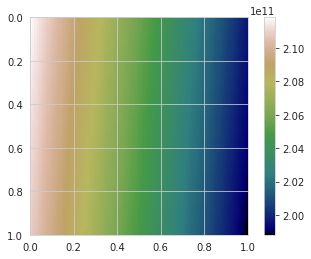

In [0]:
# Radial Basis Function(Normalizing it)
import numpy as np
import scipy.interpolate
import matplotlib.pyplot as plt
np.random.seed(2000)

x = random_subset7.Latitude
y = random_subset7.Longitude
z = random_subset7["'BS 7'"]

interp = scipy.interpolate.Rbf(x, y, z, function='cubic')

yi, xi = np.mgrid[0:1:100j, 0:1:100j]

zi = interp(xi, yi)

plt.plot(x, y, 'ko')
plt.imshow(zi, extent=[0, 1, 1, 0], cmap='gist_earth')
plt.colorbar()

plt.show()

In [0]:
import pandas as pd 
import folium
from folium.plugins import HeatMap

# Fingerprinting linear
max_amount = float(random_subset7["'BS 7'"].max())

hmap = folium.Map(location=[51.2, 4.42], zoom_start=12, width=500,height=500)

hm_wide = HeatMap( list(zip(random_subset7.Latitude.values, random_subset7.Longitude.values, random_subset7["'BS 7'"].values)),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=20, blur=15, 
                   max_zoom=1, 
                 )

hmap.add_child(hm_wide)

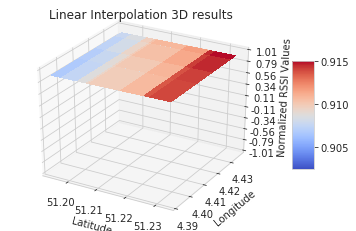

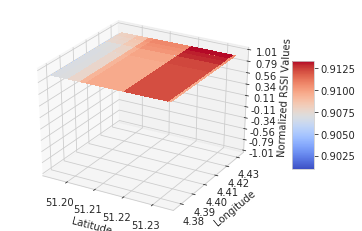

In [0]:
# This import registers the 3D projection, but is otherwise unused.
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt


fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df0.sample(20).Latitude
y = df0.sample(20).Longitude
z = random_subset7["'BS 1'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Linear Interpolation 3D results')

ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df1.sample(20).Latitude
y = df1.sample(20).Longitude
z = random_subset7["'BS 7'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

In [0]:
random_subset7.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
29963,-119.0,-125.0,-200,-200,-108,-200,-125.0,-200,-200,-200,-200,-200,-110,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.69,51.232304,4.404963,1.445036
19542,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-104,-200,-200,-200,-200,-114,-200,-120,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.77,51.204102,4.393677,1.808731
59187,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-200,-200,-200,-200,-200,-114,-115,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.81,51.200359,4.414371,2.272998
12344,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-95,-200,-200,-200,-111,-200,-200,-200,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.80,51.222473,4.436370,2.383441
29746,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-119,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.96,51.206173,4.392585,1.624869


In [0]:
train_df7.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
72492,-119.0,-125.0,-200,-200,-113,-200,-125.0,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.65,51.228138,4.411366,1.151212
72493,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-200,-200,-200,-200,-107,-91,-200,-200,-200,-200,-200,-100,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.70,51.220863,4.415699,0.933498
72494,-119.0,-125.0,-200,-106,-105,-200,-125.0,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,1.70,51.235752,4.416232,2.054360
72495,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-113,-200,-200,-200,-114,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.77,51.224827,4.425766,1.729034
72496,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-200,-87,-200,-119,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.55,51.194736,4.419562,2.988956


## Fingerprinting Maps for Base Station-9

In [0]:
train_df7.isnull().sum().sum()

0

In [0]:
test_data.isnull().sum().sum()

0

In [0]:
len(train_df7.Latitude.unique())

10753

In [0]:
len(test_data.Latitude.unique())

9112

In [0]:
len(train_df7.Longitude.unique())

26882

In [0]:
len(test_data.Longitude.unique())

16627

In [0]:
train_sort_data = train_df7.sort_values("'BS 9'")

In [0]:
test_sort_data = test_data.sort_values("'BS 9'")

In [0]:
train_sort_data.loc[train_sort_data["'BS 9'"] == -200].shape

(61616, 73)

In [0]:
#train_sort_data1 = train_sort_data.iloc[60000:, :]

In [0]:
train_sort_data.shape

(78297, 73)

In [0]:
test_sort_data.shape

(33013, 72)

In [0]:
train_sort_data2 = train_sort_data.reset_index(drop=True)

In [0]:
test_sort_data2 = test_sort_data.reset_index(drop=True)

In [0]:
train_sort_data2.shape

(78297, 73)

In [0]:
test_sort_data2.shape

(33013, 72)

In [0]:
train_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
test_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
train_filtered_data = train_sort_data2.reset_index(drop=True)

In [0]:
test_filtered_data = test_sort_data2.reset_index(drop=True)

In [0]:
#train_filtered_data = train_sort_data2.iloc[970:1000,:]

In [0]:
train_filtered_data.groupby("'BS 9'").size()

'BS 9'
-200    61616
-119        2
-118       28
-117       60
-116      124
-115      629
-114     1170
-113     1245
-112     1119
-111     1060
-110     1040
-109     1054
-108     1003
-107      878
-106      866
-105      830
-104      829
-103      708
-102      670
-101      631
-100      530
-99       408
-98       343
-97       262
-96       199
-95       176
-94       151
-93       125
-92        89
-91        78
-90        59
-89        53
-88        41
-87        30
-86        31
-85        25
-84        17
-83        15
-82        22
-81        15
-80        14
-79         6
-78         4
-77         7
-76        10
-75         2
-74         5
-73         3
-72         1
-70         1
-69         3
-68         6
-67         1
-64         1
-63         1
-60         1
dtype: int64

In [0]:
# Replacing values with Nan outside range of (-150,150)
train_filtered_data["'BS 9'"]=train_filtered_data["'BS 9'"].where(train_filtered_data["'BS 9'"].between(-150,150))

In [0]:
#train_data["'BS 2'"]=train_data["'BS 2'"].where(train_data["'BS 2'"].between(-150,150))

In [0]:
train_filtered_data.shape

(78297, 73)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_filtered_data['distance'] = train_filtered_data.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_sort_data2['distance'] = train_sort_data2.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

test_filtered_data['distance'] = test_filtered_data.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

test_sort_data2['distance'] = test_sort_data2.apply(lambda row: haversine(row), axis=1)

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-119.0,-125.0,-200,-200,-200,-200,-66.0,-109,NaN,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.72,51.218296,4.459205,3.951231
1,-100.0,-112.0,-200,-200,-200,-200,-125.0,-200,NaN,-200,-200,-200,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.70,51.203411,4.425415,2.389304
2,-119.0,-112.0,-200,-200,-200,-200,-125.0,-200,NaN,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.96,51.215446,4.408152,0.590087
3,-119.0,-112.0,-200,-200,-200,-200,-125.0,-200,NaN,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.94,51.210251,4.415990,1.384861
4,-119.0,-112.0,-200,-200,-200,-200,-125.0,-200,NaN,-200,-200,-200,-200,-102,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-101,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.66,51.200985,4.415780,2.246930


In [0]:
test_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-98,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.75,51.218407,4.406668,0.310602
1,-200,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-84,-92,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.81,51.222904,4.416162,1.028130
2,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-115,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.68,51.214104,4.394208,0.824829
3,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-101,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.70,51.215378,4.427442,1.793804
4,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-110,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.72,51.230766,4.411752,1.418611


In [0]:
train_filtered_data.isnull().sum().sum()

61616

In [0]:
len(train_filtered_data.Latitude.unique())

10753

In [0]:
len(train_filtered_data.Longitude.unique())

26882

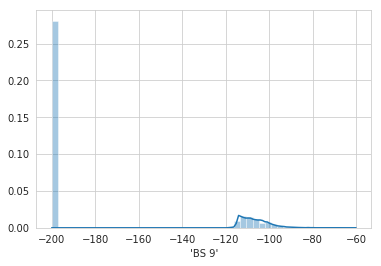

In [0]:
sns.distplot(train_sort_data2["'BS 9'"])

70% values from BS-1 have been made NaN as it is out of range. We will try to predict it using interpolation.

### Plotting Fingerprinting Heatmap for BS-1 training data

In [0]:
# Line 2.
extent = x_extent = x_min, x_max, y_min, y_max = [train_sort_data2.Latitude.min()-50, train_sort_data2.Latitude.max()+50,
                                                  train_sort_data2.Longitude.min()-10, train_sort_data2.Longitude.max()+10]

In [0]:
extent

[1.1861686700000007, 101.23601913, -5.674818516, 14.45976162]

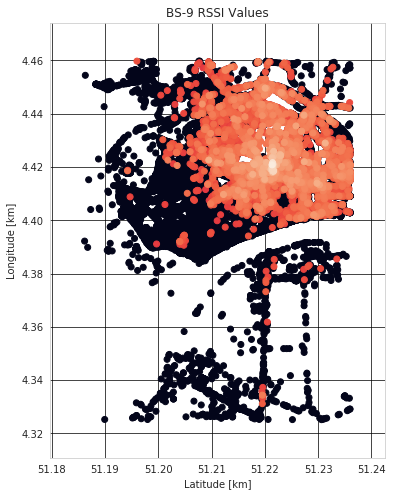

In [0]:
fig, ax = plt.subplots(figsize=(15,8))

ax.scatter(train_sort_data2.Latitude, train_sort_data2.Longitude, c=train_sort_data2["'BS 9'"])
ax.set_aspect(.5)
#ax.set_xlim(*extent[:])
#ax.set_ylim(*extent[:])
ax.set_xlabel('Latitude [km]')
ax.set_ylabel('Longitude [km]')
ax.set_title('BS-9 RSSI Values')
ax.grid(c='k', alpha=0.9)

plt.show()

### Interpolation Techniques

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-119.0,-125.0,-200,-200,-200,-200,-66.0,-109,NaN,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.72,51.218296,4.459205,3.951231
1,-100.0,-112.0,-200,-200,-200,-200,-125.0,-200,NaN,-200,-200,-200,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.70,51.203411,4.425415,2.389304
2,-119.0,-112.0,-200,-200,-200,-200,-125.0,-200,NaN,-200,-200,-200,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.96,51.215446,4.408152,0.590087
3,-119.0,-112.0,-200,-200,-200,-200,-125.0,-200,NaN,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.94,51.210251,4.415990,1.384861
4,-119.0,-112.0,-200,-200,-200,-200,-125.0,-200,NaN,-200,-200,-200,-200,-102,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-101,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.66,51.200985,4.415780,2.246930


In [0]:
train_filtered_data = train_filtered_data.reset_index(drop=True)

In [0]:
test_filtered_data = test_filtered_data.reset_index(drop=True)

In [0]:
train_df = train_filtered_data.sort_values(by="'BS 9'", ascending=False)

In [0]:
test_df = test_filtered_data.sort_values(by="'BS 9'", ascending=False)

### Linear *Interpolation*

In [0]:
train_df.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
61611,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,NaN,-200,-200,-106,-114,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,1.18,51.221069,4.406722,0.347704
61612,-119.0,-125.0,-200,-117,-200,-200,-125.0,-200,NaN,-200,-200,-200,-103,-200,-200,-200,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.59,51.231171,4.407498,1.354329
61613,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,NaN,-200,-200,-200,-114,-108,-200,-200,-200,-200,-200,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.74,51.227756,4.409370,1.045131
61614,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,NaN,-200,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-104,-200,-200,-200,-200,-117,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.72,51.209438,4.402448,1.107694
61615,-119.0,-125.0,-200,-115,-200,-200,-125.0,-200,NaN,-200,-108,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.72,51.234138,4.427185,2.374985


In [0]:
test_df.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
10325,-200,-200,-200,-200,-200,-200,-200,-200,-200,-99,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.90,51.194225,4.418368,3.009671
10324,-200,-99,-200,-200,-200,-200,-200,-200,-200,-82,-200,-200,-200,-98,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.62,51.194332,4.418502,3.002069
10323,-200,-99,-200,-200,-200,-200,-200,-200,-200,-119,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.71,51.202168,4.419271,2.244231
10322,-200,-200,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-107,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.96,51.234325,4.416475,1.923890
15495,-200,-94,-200,-200,-200,-200,-200,-200,-200,-101,-200,-200,-200,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.65,51.194283,4.418457,3.006021


In [0]:
train_df9 = train_df.interpolate(method ='linear', limit_direction ='forward')

In [0]:
train_df9.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
61611,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-200,-200,-106,-114,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,1.18,51.221069,4.406722,0.347704
61612,-119.0,-125.0,-200,-117,-200,-200,-125.0,-200,-119.0,-200,-200,-200,-103,-200,-200,-200,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.59,51.231171,4.407498,1.354329
61613,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-200,-200,-200,-114,-108,-200,-200,-200,-200,-200,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.74,51.227756,4.409370,1.045131
61614,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-200,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-104,-200,-200,-200,-200,-117,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.72,51.209438,4.402448,1.107694
61615,-119.0,-125.0,-200,-115,-200,-200,-125.0,-200,-119.0,-200,-108,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.72,51.234138,4.427185,2.374985


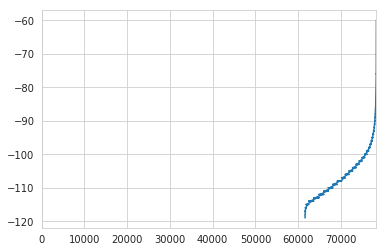

In [0]:
train_df["'BS 9'"].plot()

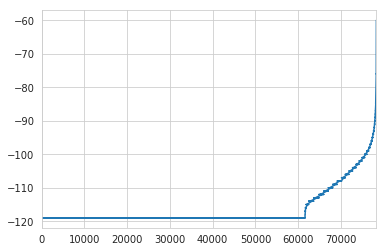

In [0]:
df_linear = train_df9["'BS 9'"].plot()

### Linear, Cubic, Quadratic *Interpolation*

In [0]:
from scipy.interpolate.rbf import Rbf  # radial basis functions
from urllib.request import urlopen
 
import matplotlib.pyplot as plt
import numpy as np

In [0]:
random_subset9 = train_df9.sample(n=100, replace=True)
random_test_subset1 = test_df.sample(n=100, replace=True)
random_subset99 = train_df9.sample(n=100, replace=True)

In [0]:
random_subset91 = train_df.sample(n=100, replace=True)

In [0]:
random_subset9.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
33729,-119.0,-99.0,-200,-200,-200,-200,-125.0,-200,-119.0,-93,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.70,51.194237,4.418370,3.008536
9846,-97.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-200,-200,-200,-200,-104,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.73,51.209133,4.407948,1.203048
11389,-119.0,-125.0,-200,-200,-102,-200,-125.0,-200,-119.0,-200,-200,-200,-106,-100,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.75,51.234051,4.405802,1.645234
29677,-113.0,-92.0,-200,-200,-200,-200,-125.0,-200,-119.0,-100,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.80,51.194122,4.418665,3.027951
40626,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-200,-200,-200,-104,-200,-200,-200,-200,-200,-200,-200,-200,-103,-200,-101,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.60,51.231163,4.403800,1.311117


In [0]:
# Linear Interpolation

In [0]:
df0 = random_subset9.interpolate(method ='linear', limit_direction ='backward')

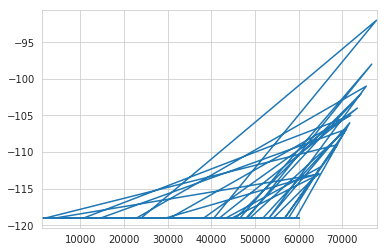

In [0]:
df_linear = df0["'BS 9'"].sample(100).plot()

In [0]:
# Cubic Interpolation

In [0]:
df1 = random_subset9.interpolate(method ='cubic', limit_direction ='backward')

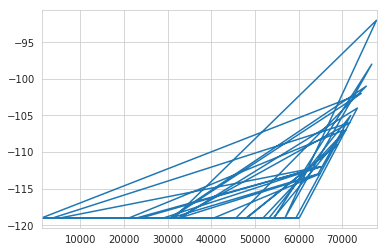

In [0]:
df_cubic = df1["'BS 9'"].plot()

In [0]:
# Quadratic Interpolation

In [0]:
df2 = random_subset9.interpolate(method ='quadratic', limit_direction ='backward')

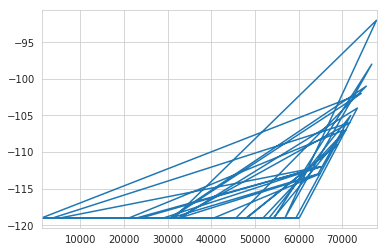

In [0]:
df_quadratic = df2
df2["'BS 9'"].plot()

In [0]:
import numpy as np; np.random.seed(0)
import seaborn as sns

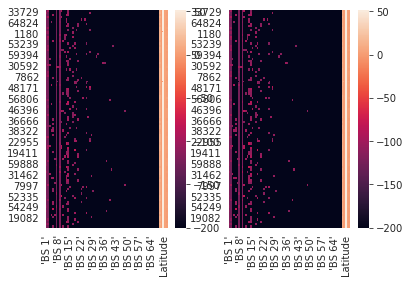

In [0]:
fig, ax =plt.subplots(1,2)

sns.heatmap(df0, ax=ax[0])
sns.heatmap(df1, ax=ax[1])

plt.show()

In [0]:
#Creating some data, with each coordinate and the values stored in separated lists
x = random_subset9.distance
y = random_subset9.distance
values = random_subset9["'BS 9'"]

In [0]:
random_subset9.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
hm = random_subset9.pivot("Latitude", "Longitude", "'BS 9'")
hm.head()

Longitude,4.325796604,4.34204483,4.378466606,4.3854050639999995,4.387476921,4.390494824,4.390763283,4.391876698,4.39214325,4.3921585080000005,4.3987350460000005,4.400330067,4.400443554,4.400473118,4.401983261,4.401989937,4.402378559,4.402806759,4.402939797,4.402988434,4.403031826,4.403104782,4.403321743,4.403516768999999,4.403625011,4.403681755,4.403800011,4.404029846,4.404059887,4.404106617,4.404283523999999,4.404375076,4.404643536,4.404648304,4.405136585,4.405801773,4.405819893,4.406133175,4.406348229,4.4064068789999995,...,4.414983273,4.415070056999999,4.416106701,4.416508198,4.416538238999999,4.416751862,4.417083263,4.417791843,4.417923451,4.4179534910000005,4.418253422,4.418294907,4.4183702469999995,4.418446541000001,4.418540001,4.41865015,4.4186649319999995,4.419561863,4.4203200339999995,4.420478344,4.4216218000000005,4.421888351000001,4.422140122,4.423593521,4.425253391,4.425458431,4.425459862,4.4259800910000004,4.4262099269999995,4.42974329,4.43440342,4.436233521,4.436848164,4.439286709,4.439418316,4.439778328,4.444515228,4.445438385,4.449128151,4.452816486000001
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.194122,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-119.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194210,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-119.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-119.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194237,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-119.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194294,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-119.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
hm_df = hm.interpolate(method ='linear', limit_direction ='both')

In [0]:
hm_df.head()

Longitude,4.325796604,4.34204483,4.378466606,4.3854050639999995,4.387476921,4.390494824,4.390763283,4.391876698,4.39214325,4.3921585080000005,4.3987350460000005,4.400330067,4.400443554,4.400473118,4.401983261,4.401989937,4.402378559,4.402806759,4.402939797,4.402988434,4.403031826,4.403104782,4.403321743,4.403516768999999,4.403625011,4.403681755,4.403800011,4.404029846,4.404059887,4.404106617,4.404283523999999,4.404375076,4.404643536,4.404648304,4.405136585,4.405801773,4.405819893,4.406133175,4.406348229,4.4064068789999995,...,4.414983273,4.415070056999999,4.416106701,4.416508198,4.416538238999999,4.416751862,4.417083263,4.417791843,4.417923451,4.4179534910000005,4.418253422,4.418294907,4.4183702469999995,4.418446541000001,4.418540001,4.41865015,4.4186649319999995,4.419561863,4.4203200339999995,4.420478344,4.4216218000000005,4.421888351000001,4.422140122,4.423593521,4.425253391,4.425458431,4.425459862,4.4259800910000004,4.4262099269999995,4.42974329,4.43440342,4.436233521,4.436848164,4.439286709,4.439418316,4.439778328,4.444515228,4.445438385,4.449128151,4.452816486000001
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.194122,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-107.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-113.0,-119.0,-119.0,-119.0,...,-119.0,-98.0,-119.0,-119.0,-106.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-104.0,-102.0,-113.0,-119.0,-119.0,-119.0,-92.0,-109.0,-112.0,-119.0,-119.0,-101.0,-119.0
51.194210,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-107.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-113.0,-119.0,-119.0,-119.0,...,-119.0,-98.0,-119.0,-119.0,-106.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-104.0,-102.0,-113.0,-119.0,-119.0,-119.0,-92.0,-109.0,-112.0,-119.0,-119.0,-101.0,-119.0
51.194214,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-107.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-113.0,-119.0,-119.0,-119.0,...,-119.0,-98.0,-119.0,-119.0,-106.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-104.0,-102.0,-113.0,-119.0,-119.0,-119.0,-92.0,-109.0,-112.0,-119.0,-119.0,-101.0,-119.0
51.194237,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-107.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-113.0,-119.0,-119.0,-119.0,...,-119.0,-98.0,-119.0,-119.0,-106.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-104.0,-102.0,-113.0,-119.0,-119.0,-119.0,-92.0,-109.0,-112.0,-119.0,-119.0,-101.0,-119.0
51.194294,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-107.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-113.0,-119.0,-119.0,-119.0,...,-119.0,-98.0,-119.0,-119.0,-106.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-119.0,-104.0,-102.0,-113.0,-119.0,-119.0,-119.0,-92.0,-109

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

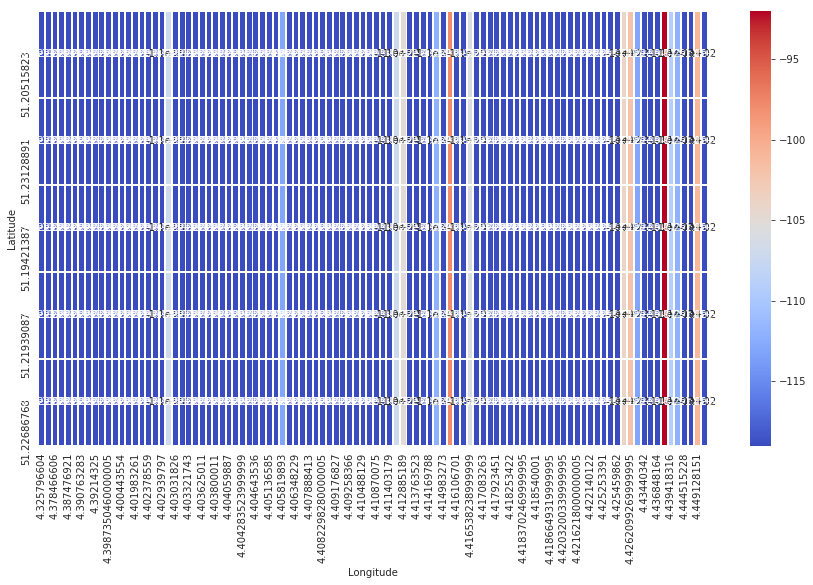

In [0]:
plt.figure(figsize=(15,8))
sns.heatmap(hm_df.sample(5), annot=True, linewidth = 0.9, cmap='coolwarm')

### AutoEncoder Imputation

In [0]:
from numpy import nan
from sklearn.preprocessing import Imputer

In [0]:
traincols = train_df.columns.tolist() 
traincols.remove('Latitude')
traincols.remove('Longitude')
traincols.remove('distance')
len(traincols)

70

In [0]:
columns_X = traincols
x = train_df[columns_X]

In [0]:
columns_y = ['Latitude','Longitude']
y = train_df[columns_y]

In [0]:
imp = Imputer(strategy='mean')
X2 = imp.fit_transform(train_df)
X2

array([[-119.        , -125.        , -200.        , ...,   51.22134018,
           4.42083979,    1.29535424],
       [-119.        , -125.        , -200.        , ...,   51.22143936,
           4.4216485 ,    1.35272619],
       [-109.        , -125.        , -200.        , ...,   51.22141266,
           4.42083645,    1.29649089],
       ...,
       [-119.        , -125.        , -200.        , ...,   51.2277565 ,
           4.40936995,    1.04513094],
       [-119.        , -125.        , -200.        , ...,   51.20943832,
           4.40244818,    1.10769416],
       [-119.        , -125.        , -200.        , ...,   51.23413849,
           4.42718506,    2.37498517]])

In [0]:
model = LinearRegression().fit(X2, y)
model.predict(X2)

array([[51.22134018,  4.42083979],
       [51.22143936,  4.4216485 ],
       [51.22141266,  4.42083645],
       ...,
       [51.2277565 ,  4.40936995],
       [51.20943832,  4.40244818],
       [51.23413849,  4.42718506]])

In [0]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures

model = make_pipeline(Imputer(strategy='mean'),
                      PolynomialFeatures(degree=2),
                      LinearRegression())

In [0]:
def make_reconstruction_loss(n_features):

    def reconstruction_loss(input_and_mask, y_pred):
        X_values = input_and_mask[:, :n_features]
        X_values.name = "$X_values"

        missing_mask = input_and_mask[:, n_features:]
        missing_mask.name = "$missing_mask"
        observed_mask = 1 - missing_mask
        observed_mask.name = "$observed_mask"

        X_values_observed = X_values * observed_mask
        X_values_observed.name = "$X_values_observed"

        pred_observed = y_pred * observed_mask
        pred_observed.name = "$y_pred_observed"

        return mse(y_true=X_values_observed, y_pred=pred_observed)
    return reconstruction_loss
  
def masked_mae(X_true, X_pred, mask):
    masked_diff = X_true[mask] - X_pred[mask]
    return np.mean(np.abs(masked_diff))

In [0]:
import random
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
from keras.utils import np_utils
from sklearn.preprocessing import LabelEncoder

from keras.objectives import mse
from keras.models import Sequential
from keras.layers.core import Dropout, Dense

from keras.regularizers import L1L2

from collections import defaultdict

%matplotlib inline

In [0]:
class Autoencoder:

    def __init__(self, data,
                 recurrent_weight=0.5,
                 optimizer="adam",
                 dropout_probability=0.5,
                 hidden_activation="relu",
                 output_activation="sigmoid",
                 init="glorot_normal",
                 L1_penalty=0,
                 L2_penalty=0):
        self.data = data.copy()
        self.recurrent_weight = recurrent_weight
        self.optimizer = optimizer
        self.dropout_probability = dropout_probability
        self.hidden_activation = hidden_activation
        self.output_activation = output_activation
        self.init = init
        self.L1_penalty = L1_penalty
        self.L2_penalty = L2_penalty

    def _get_hidden_layer_sizes(self):
        n_dims = self.data.shape[1]
        return [
            min(2000, 8 * n_dims),
            min(500, 2 * n_dims),
            int(np.ceil(0.5 * n_dims)),
        ]

    def _create_model(self):

        hidden_layer_sizes = self._get_hidden_layer_sizes()
        first_layer_size = hidden_layer_sizes[0]
        n_dims = self.data.shape[1]

        model = Sequential()

        model.add(Dense(
            first_layer_size,
            input_dim= 2 * n_dims,
            activation=self.hidden_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))
        model.add(Dropout(self.dropout_probability))

        for layer_size in hidden_layer_sizes[1:]:
            model.add(Dense(
                layer_size,
                activation=self.hidden_activation,
                W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
                init=self.init))
            model.add(Dropout(self.dropout_probability))

        model.add(Dense(
            n_dims,
            activation=self.output_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))

        loss_function = make_reconstruction_loss(n_dims)

        model.compile(optimizer=self.optimizer, loss=loss_function)
        return model

    def fill(self, missing_mask):
        self.data[missing_mask] = -1

    def _create_missing_mask(self):
        if self.data.dtype != "f" and self.data.dtype != "d":
            self.data = self.data.astype(float)

        return np.isnan(self.data)

    def _train_epoch(self, model, missing_mask, batch_size):
        input_with_mask = np.hstack([self.data, missing_mask])
        n_samples = len(input_with_mask)
        n_batches = int(np.ceil(n_samples / batch_size))
        indices = np.arange(n_samples)
        np.random.shuffle(indices)
        X_shuffled = input_with_mask[indices]

        for batch_idx in range(n_batches):
            batch_start = batch_idx * batch_size
            batch_end = (batch_idx + 1) * batch_size
            batch_data = X_shuffled[batch_start:batch_end, :]
            model.train_on_batch(batch_data, batch_data)
        return model.predict(input_with_mask)

    def train(self, batch_size=256, train_epochs=100):
        missing_mask = self._create_missing_mask()
        self.fill(missing_mask)
        self.model = self._create_model()

        observed_mask = ~missing_mask

        for epoch in range(train_epochs):
            X_pred = self._train_epoch(self.model, missing_mask, batch_size)
            observed_mae = masked_mae(X_true=self.data,
                                    X_pred=X_pred,
                                    mask=observed_mask)
            if epoch % 50 == 0:
                print("observed mae:", observed_mae)

            old_weight = (1.0 - self.recurrent_weight)
            self.data[missing_mask] *= old_weight
            pred_missing = X_pred[missing_mask]
            self.data[missing_mask] += self.recurrent_weight * pred_missing
        return self.data.copy()

In [0]:
train_df["'BS 9'"] = pd.to_numeric(train_df["'BS 9'"], errors='coerce')

In [0]:
train_df3 = train_df.dropna(subset=["'BS 9'"])


In [0]:
train_df3["'BS 9'"] = train_df3["'BS 9'"].astype(int)

In [0]:
missing_encoded = pd.get_dummies(train_df)

for col in train_df.columns:
    missing_cols = missing_encoded.columns.str.startswith(str(col) + "_")
    missing_encoded.loc[train_df[col].isnull(), missing_cols] = np.nan

In [0]:
missing_encoded.values

array([[-119.        , -125.        , -200.        , ...,   51.22134018,
           4.42083979,    1.29535424],
       [-119.        , -125.        , -200.        , ...,   51.22143936,
           4.4216485 ,    1.35272619],
       [-109.        , -125.        , -200.        , ...,   51.22141266,
           4.42083645,    1.29649089],
       ...,
       [-119.        , -125.        , -200.        , ...,   51.2277565 ,
           4.40936995,    1.04513094],
       [-119.        , -125.        , -200.        , ...,   51.20943832,
           4.40244818,    1.10769416],
       [-119.        , -125.        , -200.        , ...,   51.23413849,
           4.42718506,    2.37498517]])

In [0]:
#pip install autoencoder-impute

In [0]:
def mle(row):
    res = np.zeros(row.shape[0])
    res[np.argmax(row)] = 1
    return res

col_classes = [len(train_df[c].unique()) for c in train_df.columns]

dummy_df = pd.get_dummies(train_df)

mle_complete = None

for i, cnt in enumerate(col_classes):
    start_idx = int(sum(col_classes[0:i]))
    col_true = dummy_df.values[:, start_idx:start_idx+cnt]
    col_completed = complete_encoded[:, start_idx:start_idx+cnt]
    mle_completed = np.apply_along_axis(mle, axis=1, arr=col_completed)
    if mle_complete is None:
        mle_complete = mle_completed
    else:
        mle_complete = np.hstack([mle_complete, mle_completed])

In [0]:
model.fit(x, y)  # X with missing values, from above
print(model.predict(x))

[[51.22428612  4.42835045]
 [51.22339538  4.42703819]
 [51.22944549  4.42431164]
 ...
 [51.22331814  4.40629673]
 [51.2136269   4.40274811]
 [51.23116497  4.41726112]]


In [0]:
random_subset9.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
19082,-119.0,-125.0,-200,-200,-113,-200,-125.0,-200,-119.0,-200,-200,-200,-200,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.71,51.228065,4.406407,1.001233
8661,-119.0,-107.0,-200,-200,-200,-200,-125.0,-200,-119.0,-200,-200,-200,-200,-113,-200,-200,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.85,51.205681,4.413643,1.711620
48306,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-200,-200,-200,-100,-103,-200,-200,-200,-200,-200,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.10,51.225468,4.404644,0.691012
1463,-105.0,-106.0,-200,-200,-200,-200,-125.0,-200,-119.0,-200,-200,-200,-200,-200,-200,-200,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.70,51.204422,4.425253,2.299095
18865,-119.0,-125.0,-200,-200,-112,-200,-125.0,-200,-119.0,-200,-111,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.77,51.231911,4.409180,1.466844


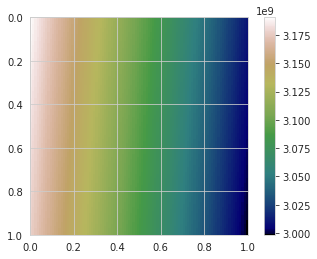

In [0]:
# Radial Basis Function(Normalizing it)
import numpy as np
import scipy.interpolate
import matplotlib.pyplot as plt
np.random.seed(2000)

x = random_subset9.Latitude
y = random_subset9.Longitude
z = random_subset9["'BS 9'"]

interp = scipy.interpolate.Rbf(x, y, z, function='cubic')

yi, xi = np.mgrid[0:1:100j, 0:1:100j]

zi = interp(xi, yi)

plt.plot(x, y, 'ko')
plt.imshow(zi, extent=[0, 1, 1, 0], cmap='gist_earth')
plt.colorbar()

plt.show()

In [0]:
import pandas as pd 
import folium
from folium.plugins import HeatMap

# Fingerprinting linear
max_amount = float(random_subset9["'BS 9'"].max())

hmap = folium.Map(location=[51.2, 4.42], zoom_start=12, width=500,height=500)

hm_wide = HeatMap( list(zip(random_subset9.Latitude.values, random_subset9.Longitude.values, random_subset9["'BS 9'"].values)),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=20, blur=15, 
                   max_zoom=1, 
                 )

hmap.add_child(hm_wide)

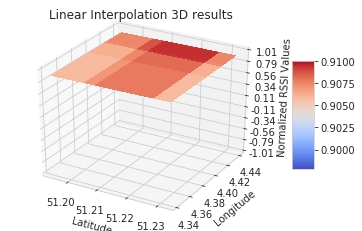

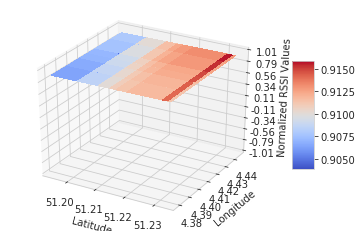

In [0]:
# This import registers the 3D projection, but is otherwise unused.
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt


fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df0.sample(20).Latitude
y = df0.sample(20).Longitude
z = random_subset1["'BS 1'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Linear Interpolation 3D results')

ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df1.sample(20).Latitude
y = df1.sample(20).Longitude
z = random_subset9["'BS 9'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

In [0]:
train_df9.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
61611,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-200,-200,-106,-114,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,1.18,51.221069,4.406722,0.347704
61612,-119.0,-125.0,-200,-117,-200,-200,-125.0,-200,-119.0,-200,-200,-200,-103,-200,-200,-200,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.59,51.231171,4.407498,1.354329
61613,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-200,-200,-200,-114,-108,-200,-200,-200,-200,-200,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.74,51.227756,4.409370,1.045131
61614,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-200,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-104,-200,-200,-200,-200,-117,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.72,51.209438,4.402448,1.107694
61615,-119.0,-125.0,-200,-115,-200,-200,-125.0,-200,-119.0,-200,-108,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.72,51.234138,4.427185,2.374985


## Fingerprinting Maps for Base Station-10

In [0]:
train_df9.isnull().sum().sum()

0

In [0]:
test_data.isnull().sum().sum()

0

In [0]:
len(train_df9.Latitude.unique())

10753

In [0]:
len(test_data.Latitude.unique())

9112

In [0]:
len(train_df9.Longitude.unique())

26882

In [0]:
len(test_data.Longitude.unique())

16627

In [0]:
train_sort_data = train_df9.sort_values("'BS 10'")

In [0]:
test_sort_data = test_data.sort_values("'BS 10'")

In [0]:
train_sort_data.loc[train_sort_data["'BS 10'"] == -200].shape

(67653, 73)

In [0]:
#train_sort_data1 = train_sort_data.iloc[69000:, :]

In [0]:
train_sort_data.shape

(78297, 73)

In [0]:
test_sort_data.shape

(33013, 72)

In [0]:
train_sort_data2 = train_sort_data.reset_index(drop=True)

In [0]:
test_sort_data2 = test_sort_data.reset_index(drop=True)

In [0]:
train_sort_data2.shape

(78297, 73)

In [0]:
test_sort_data2.shape

(33013, 72)

In [0]:
train_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
test_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
train_filtered_data = train_sort_data2.reset_index(drop=True)

In [0]:
test_filtered_data = test_sort_data2.reset_index(drop=True)

In [0]:
#train_filtered_data = train_sort_data2.iloc[970:1000,:]

In [0]:
train_filtered_data.groupby("'BS 10'").size()

'BS 10'
-200    67653
-125        1
-123        2
-121       10
-120      106
-119      306
-118      185
-117      189
-116       40
-115      156
-114       91
-113      284
-112       52
-111      149
-110       24
-109      254
-108       96
-107      349
-106       97
-105      256
-104       53
-103      357
-102      211
-101      462
-100      195
-99       408
-98       109
-97       560
-96       439
-95       628
-94       360
-93       584
-92       224
-91       554
-90       534
-89       468
-88       242
-87       323
-86       125
-85       303
-84       316
-83       303
-82       154
-81        43
-80        11
-79        12
-78         9
-77         4
-73         1
-68         1
-67         3
-66         1
dtype: int64

In [0]:
# Replacing values with Nan outside range of (-150,150)
train_filtered_data["'BS 10'"]=train_filtered_data["'BS 10'"].where(train_filtered_data["'BS 10'"].between(-150,150))

In [0]:
#train_data["'BS 2'"]=train_data["'BS 2'"].where(train_data["'BS 2'"].between(-150,150))

In [0]:
train_filtered_data.shape

(78297, 73)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_filtered_data['distance'] = train_filtered_data.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_sort_data2['distance'] = train_sort_data2.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

test_filtered_data['distance'] = test_filtered_data.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

test_sort_data2['distance'] = test_sort_data2.apply(lambda row: haversine(row), axis=1)

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-60.0,NaN,-200,-200,-104,-101,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.87,51.221340,4.420840,1.295354
1,-119.0,-125.0,-200,-200,-97,-112,-125.0,-200,-119.0,NaN,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.85,51.229816,4.402425,1.158267
2,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,NaN,-200,-200,-106,-106,-200,-200,-200,-200,-200,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.74,51.219303,4.404489,0.138914
3,-119.0,-125.0,-200,-200,-96,-200,-125.0,-200,-119.0,NaN,-200,-200,-102,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.57,51.230442,4.403070,1.228461
4,-110.0,-125.0,-200,-200,-200,-200,-113.0,-200,-119.0,NaN,-200,-200,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.73,51.211445,4.410690,1.052552


In [0]:
test_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-98,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.75,51.218407,4.406668,0.310602
1,-200,-101,-200,-200,-200,-200,-200,-200,-200,-200,-200,-105,-200,-200,-200,-200,-200,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.68,51.213459,4.422603,1.548203
2,-200,-200,-200,-102,-200,-200,-200,-200,-200,-200,-200,-200,-98,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.78,51.232044,4.412880,1.580895
3,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-111,-200,-81,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.90,51.204170,4.390049,1.902663
4,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-104,-110,-200,-200,-200,-200,-200,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.64,51.227688,4.409408,1.039576


In [0]:
train_filtered_data.isnull().sum().sum()

67653

In [0]:
len(train_filtered_data.Latitude.unique())

10753

In [0]:
len(train_filtered_data.Longitude.unique())

26882

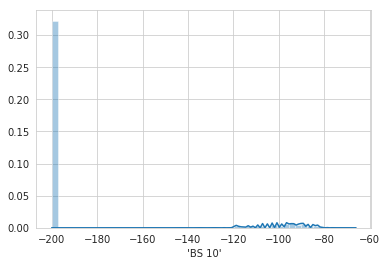

In [0]:
sns.distplot(train_sort_data2["'BS 10'"])

70% values from BS-1 have been made NaN as it is out of range. We will try to predict it using interpolation.

### Plotting Fingerprinting Heatmap for BS-10 training data

In [0]:
# Line 2.
extent = x_extent = x_min, x_max, y_min, y_max = [train_sort_data2.Latitude.min()-50, train_sort_data2.Latitude.max()+50,
                                                  train_sort_data2.Longitude.min()-10, train_sort_data2.Longitude.max()+10]

In [0]:
extent

[1.1861686700000007, 101.23601913, -5.674818516, 14.45976162]

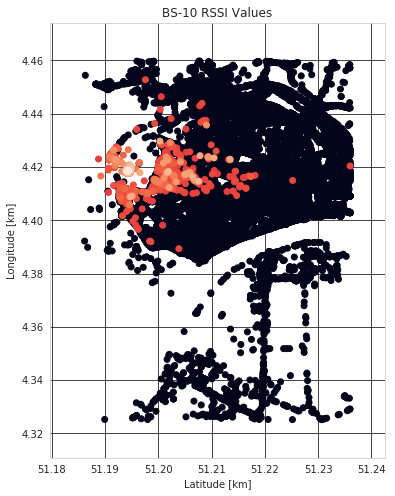

In [0]:
fig, ax = plt.subplots(figsize=(15,8))

ax.scatter(train_sort_data2.Latitude, train_sort_data2.Longitude, c=train_sort_data2["'BS 10'"])
ax.set_aspect(.5)
#ax.set_xlim(*extent[:])
#ax.set_ylim(*extent[:])
ax.set_xlabel('Latitude [km]')
ax.set_ylabel('Longitude [km]')
ax.set_title('BS-10 RSSI Values')
ax.grid(c='k', alpha=0.9)

plt.show()

### Interpolation Techniques

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-60.0,NaN,-200,-200,-104,-101,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.87,51.221340,4.420840,1.295354
1,-119.0,-125.0,-200,-200,-97,-112,-125.0,-200,-119.0,NaN,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.85,51.229816,4.402425,1.158267
2,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,NaN,-200,-200,-106,-106,-200,-200,-200,-200,-200,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.74,51.219303,4.404489,0.138914
3,-119.0,-125.0,-200,-200,-96,-200,-125.0,-200,-119.0,NaN,-200,-200,-102,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.57,51.230442,4.403070,1.228461
4,-110.0,-125.0,-200,-200,-200,-200,-113.0,-200,-119.0,NaN,-200,-200,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.73,51.211445,4.410690,1.052552


In [0]:
train_filtered_data = train_filtered_data.reset_index(drop=True)

In [0]:
test_filtered_data = test_filtered_data.reset_index(drop=True)

In [0]:
train_df = train_filtered_data.sort_values(by="'BS 10'", ascending=False)

In [0]:
test_df = test_filtered_data.sort_values(by="'BS 10'", ascending=False)

### Linear *Interpolation*

In [0]:
train_df.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
67648,-112.0,-107.0,-103,-200,-200,-200,-125.0,-200,-119.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.79,51.206760,4.423392,2.023116
67649,-119.0,-107.0,-200,-200,-200,-200,-125.0,-200,-119.0,NaN,-200,-200,-200,-100,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.66,51.212746,4.410325,0.918989
67650,-111.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,NaN,-200,-200,-200,-112,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.72,51.215317,4.405038,0.487241
67651,-104.0,-107.0,-200,-200,-200,-200,-125.0,-200,-119.0,NaN,-200,-200,-200,-200,-200,-200,-102,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.82,51.200565,4.430420,2.858115
67652,-119.0,-107.0,-200,-200,-200,-200,-125.0,-200,-119.0,NaN,-200,-200,-200,-200,-111,-200,-200,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.78,51.195877,4.409303,2.658220


In [0]:
test_df.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
10325,-200,-200,-200,-200,-112,-200,-200,-200,-200,-200,-104,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.68,51.234741,4.413794,1.878411
10324,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.71,51.210125,4.408862,1.122496
10323,-105,-200,-200,-200,-200,-200,-93,-200,-200,-200,-200,-200,-200,-200,-200,-200,-102,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.68,51.214874,4.446648,3.115791
10322,-200,-200,-200,-119,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-112,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.65,51.232132,4.403007,1.416169
15495,-200,-200,-200,-200,-93,-200,-200,-200,-200,-200,-200,-200,-200,-102,-200,-200,-200,-200,-200,-200,-200,-99,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.79,51.232456,4.403202,1.452606


In [0]:
train_df10 = train_df.interpolate(method ='linear', limit_direction ='forward')

In [0]:
train_df10.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
67648,-112.0,-107.0,-103,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.79,51.206760,4.423392,2.023116
67649,-119.0,-107.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-200,-100,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.66,51.212746,4.410325,0.918989
67650,-111.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-200,-112,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.72,51.215317,4.405038,0.487241
67651,-104.0,-107.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-102,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.82,51.200565,4.430420,2.858115
67652,-119.0,-107.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-200,-200,-111,-200,-200,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.78,51.195877,4.409303,2.658220


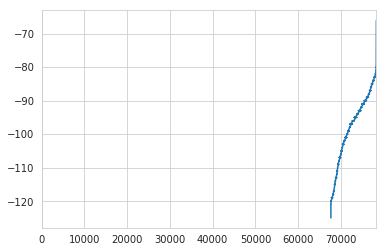

In [0]:
train_df["'BS 10'"].plot()

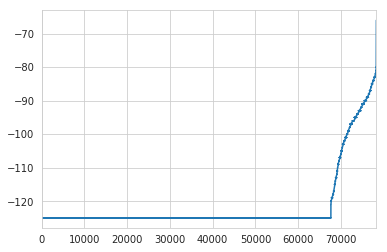

In [0]:
df_linear = train_df10["'BS 10'"].plot()

### Linear, Cubic, Quadratic *Interpolation*

In [0]:
from scipy.interpolate.rbf import Rbf  # radial basis functions
from urllib.request import urlopen
 
import matplotlib.pyplot as plt
import numpy as np

In [0]:
random_subset10 = train_df10.sample(n=100, replace=True)
random_test_subset1 = test_df.sample(n=100, replace=True)
random_subset102 = train_df10.sample(n=100, replace=True)

In [0]:
random_subset1023 = train_df.sample(n=100, replace=True)

In [0]:
random_subset10.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
39766,-119.0,-125.0,-200,-200,-103,-200,-125.0,-200,-110.0,-125.0,-200,-200,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.66,51.230766,4.408983,1.342091
15883,-119.0,-125.0,-200,-200,-103,-200,-125.0,-200,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-94,-200,-200,-200,-100,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,3.78,51.218254,4.395152,0.527414
17426,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-116,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.79,51.215866,4.408973,0.598061
35714,-119.0,-125.0,-200,-200,-200,-200,-117.0,-200,-119.0,-125.0,-200,-200,-200,-114,-200,-200,-116,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.62,51.208263,4.419142,1.696215
46663,-106.0,-125.0,-200,-200,-200,-200,-125.0,-200,-102.0,-125.0,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.61,51.213135,4.410877,0.908706


In [0]:
# Linear Interpolation

In [0]:
df0 = random_subset10.interpolate(method ='linear', limit_direction ='backward')

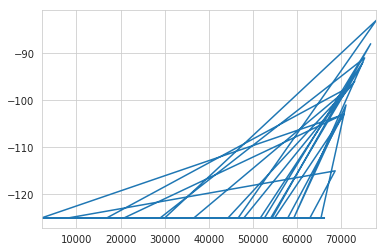

In [0]:
df_linear = df0["'BS 10'"].sample(100).plot()

In [0]:
# Cubic Interpolation

In [0]:
df1 = random_subset10.interpolate(method ='cubic', limit_direction ='backward')

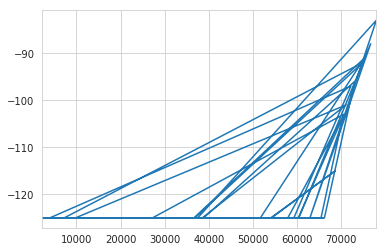

In [0]:
df_cubic = df1["'BS 10'"].plot()

In [0]:
# Quadratic Interpolation

In [0]:
df2 = random_subset10.interpolate(method ='quadratic', limit_direction ='backward')

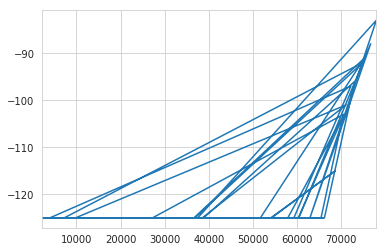

In [0]:
df_quadratic = df2
df2["'BS 10'"].plot()

In [0]:
import numpy as np; np.random.seed(0)
import seaborn as sns

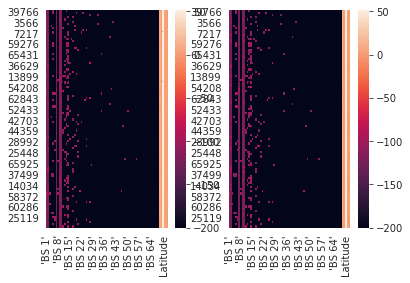

In [0]:
fig, ax =plt.subplots(1,2)

sns.heatmap(df0, ax=ax[0])
sns.heatmap(df1, ax=ax[1])

plt.show()

In [0]:
#Creating some data, with each coordinate and the values stored in separated lists
x = random_subset10.distance
y = random_subset10.distance
values = random_subset1["'BS 10'"]

In [0]:
random_subset10.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
hm = random_subset10.pivot("Latitude", "Longitude", "'BS 10'")
hm.head()

Longitude,4.33106184,4.339666843,4.372506619,4.382358551,4.383160114,4.3849916460000005,4.389493465,4.390351772,4.391823292,4.394090176000001,4.395151615,4.397798538,4.398206711,4.3988118169999995,4.399966717,4.4015817639999995,4.401820183,4.401899815,4.401935101,4.402888298,4.402991772,4.4038033489999995,4.404331684,4.40433836,4.404998303,4.4053215980000004,4.405368328,4.406624794,4.406674862,4.407941818,4.408973217,4.408983231000001,4.409184933,4.409293175,4.409309864,4.409731865,4.41032505,4.410476685,4.410568237,4.410669803999999,...,4.418200016,4.418280125,4.418311596000001,4.418456554,4.418473243999999,4.418478489,4.41850996,4.418519974,4.418566704,4.41857481,4.4186115269999995,4.41862011,4.4190182689999995,4.419141768999999,4.4201297760000005,4.420346737,4.421514988,4.422321796,4.422488213,4.422774792,4.424313068,4.424574852,4.4246635439999995,4.425373554,4.425676823,4.426109791,4.429023266000001,4.429288387,4.431476593,4.433223248,4.437978268,4.439368248,4.440123558,4.441740036000001,4.442389965,4.442914963,4.44750309,4.448093414,4.448291779,4.45137167
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.192268,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-125.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.193359,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-125.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.193947,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-125.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194241,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,-83.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,-91.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
hm_df = hm.interpolate(method ='linear', limit_direction ='both')

In [0]:
hm_df.head()

Longitude,4.33106184,4.339666843,4.372506619,4.382358551,4.383160114,4.3849916460000005,4.389493465,4.390351772,4.391823292,4.394090176000001,4.395151615,4.397798538,4.398206711,4.3988118169999995,4.399966717,4.4015817639999995,4.401820183,4.401899815,4.401935101,4.402888298,4.402991772,4.4038033489999995,4.404331684,4.40433836,4.404998303,4.4053215980000004,4.405368328,4.406624794,4.406674862,4.407941818,4.408973217,4.408983231000001,4.409184933,4.409293175,4.409309864,4.409731865,4.41032505,4.410476685,4.410568237,4.410669803999999,...,4.418200016,4.418280125,4.418311596000001,4.418456554,4.418473243999999,4.418478489,4.41850996,4.418519974,4.418566704,4.41857481,4.4186115269999995,4.41862011,4.4190182689999995,4.419141768999999,4.4201297760000005,4.420346737,4.421514988,4.422321796,4.422488213,4.422774792,4.424313068,4.424574852,4.4246635439999995,4.425373554,4.425676823,4.426109791,4.429023266000001,4.429288387,4.431476593,4.433223248,4.437978268,4.439368248,4.440123558,4.441740036000001,4.442389965,4.442914963,4.44750309,4.448093414,4.448291779,4.45137167
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.192268,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,...,-103.0,-101.0,-125.0,-83.0,-125.0,-91.0,-96.0,-115.0,-125.0,-103.0,-88.0,-92.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0
51.193359,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,...,-103.0,-101.0,-125.0,-83.0,-125.0,-91.0,-96.0,-115.0,-125.0,-103.0,-88.0,-92.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0
51.193947,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,...,-103.0,-101.0,-125.0,-83.0,-125.0,-91.0,-96.0,-115.0,-125.0,-103.0,-88.0,-92.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0
51.194241,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,...,-103.0,-101.0,-125.0,-83.0,-125.0,-91.0,-96.0,-115.0,-125.0,-103.0,-88.0,-92.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0
51.194244,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,...,-103.0,-101.0,-125.0,-83.0,-125.0,-91.0,-96.0,-115.0,-125.0,-103.0,-88.0,-92.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-125.0,-1

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

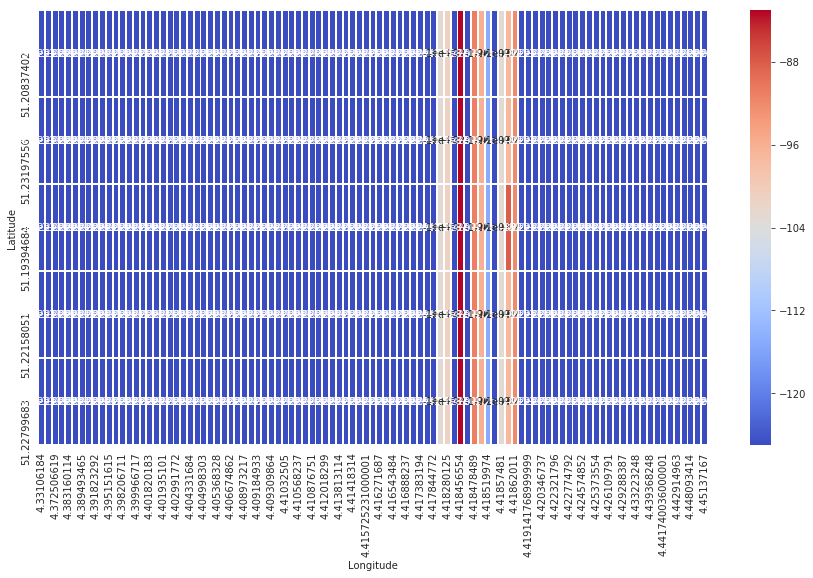

In [0]:
plt.figure(figsize=(15,8))
sns.heatmap(hm_df.sample(5), annot=True, linewidth = 0.9, cmap='coolwarm')

### AutoEncoder Imputation

In [0]:
from numpy import nan
from sklearn.preprocessing import Imputer

In [0]:
traincols = train_df.columns.tolist() 
traincols.remove('Latitude')
traincols.remove('Longitude')
traincols.remove('distance')
len(traincols)

70

In [0]:
columns_X = traincols
x = train_df[columns_X]

In [0]:
columns_y = ['Latitude','Longitude']
y = train_df[columns_y]

In [0]:
imp = Imputer(strategy='mean')
X2 = imp.fit_transform(train_df)
X2

array([[-119.        , -108.        , -200.        , ...,   51.19438171,
           4.41851187,    2.99720919],
       [-119.        , -105.        , -200.        , ...,   51.19433212,
           4.41858816,    3.00430692],
       [-119.        ,  -92.        , -200.        , ...,   51.19408417,
           4.41860485,    3.03033615],
       ...,
       [-111.        , -125.        , -200.        , ...,   51.21531677,
           4.40503836,    0.48724053],
       [-104.        , -107.        , -200.        , ...,   51.20056534,
           4.43041992,    2.85811481],
       [-119.        , -107.        , -200.        , ...,   51.19587708,
           4.40930319,    2.65821952]])

In [0]:
model = LinearRegression().fit(X2, y)
model.predict(X2)

array([[51.19438171,  4.41851187],
       [51.19433212,  4.41858816],
       [51.19408417,  4.41860485],
       ...,
       [51.21531677,  4.40503836],
       [51.20056534,  4.43041992],
       [51.19587708,  4.40930319]])

In [0]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures

model = make_pipeline(Imputer(strategy='mean'),
                      PolynomialFeatures(degree=2),
                      LinearRegression())

In [0]:
def make_reconstruction_loss(n_features):

    def reconstruction_loss(input_and_mask, y_pred):
        X_values = input_and_mask[:, :n_features]
        X_values.name = "$X_values"

        missing_mask = input_and_mask[:, n_features:]
        missing_mask.name = "$missing_mask"
        observed_mask = 1 - missing_mask
        observed_mask.name = "$observed_mask"

        X_values_observed = X_values * observed_mask
        X_values_observed.name = "$X_values_observed"

        pred_observed = y_pred * observed_mask
        pred_observed.name = "$y_pred_observed"

        return mse(y_true=X_values_observed, y_pred=pred_observed)
    return reconstruction_loss
  
def masked_mae(X_true, X_pred, mask):
    masked_diff = X_true[mask] - X_pred[mask]
    return np.mean(np.abs(masked_diff))

In [0]:
import random
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
from keras.utils import np_utils
from sklearn.preprocessing import LabelEncoder

from keras.objectives import mse
from keras.models import Sequential
from keras.layers.core import Dropout, Dense

from keras.regularizers import L1L2

from collections import defaultdict

%matplotlib inline

In [0]:
class Autoencoder:

    def __init__(self, data,
                 recurrent_weight=0.5,
                 optimizer="adam",
                 dropout_probability=0.5,
                 hidden_activation="relu",
                 output_activation="sigmoid",
                 init="glorot_normal",
                 L1_penalty=0,
                 L2_penalty=0):
        self.data = data.copy()
        self.recurrent_weight = recurrent_weight
        self.optimizer = optimizer
        self.dropout_probability = dropout_probability
        self.hidden_activation = hidden_activation
        self.output_activation = output_activation
        self.init = init
        self.L1_penalty = L1_penalty
        self.L2_penalty = L2_penalty

    def _get_hidden_layer_sizes(self):
        n_dims = self.data.shape[1]
        return [
            min(2000, 8 * n_dims),
            min(500, 2 * n_dims),
            int(np.ceil(0.5 * n_dims)),
        ]

    def _create_model(self):

        hidden_layer_sizes = self._get_hidden_layer_sizes()
        first_layer_size = hidden_layer_sizes[0]
        n_dims = self.data.shape[1]

        model = Sequential()

        model.add(Dense(
            first_layer_size,
            input_dim= 2 * n_dims,
            activation=self.hidden_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))
        model.add(Dropout(self.dropout_probability))

        for layer_size in hidden_layer_sizes[1:]:
            model.add(Dense(
                layer_size,
                activation=self.hidden_activation,
                W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
                init=self.init))
            model.add(Dropout(self.dropout_probability))

        model.add(Dense(
            n_dims,
            activation=self.output_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))

        loss_function = make_reconstruction_loss(n_dims)

        model.compile(optimizer=self.optimizer, loss=loss_function)
        return model

    def fill(self, missing_mask):
        self.data[missing_mask] = -1

    def _create_missing_mask(self):
        if self.data.dtype != "f" and self.data.dtype != "d":
            self.data = self.data.astype(float)

        return np.isnan(self.data)

    def _train_epoch(self, model, missing_mask, batch_size):
        input_with_mask = np.hstack([self.data, missing_mask])
        n_samples = len(input_with_mask)
        n_batches = int(np.ceil(n_samples / batch_size))
        indices = np.arange(n_samples)
        np.random.shuffle(indices)
        X_shuffled = input_with_mask[indices]

        for batch_idx in range(n_batches):
            batch_start = batch_idx * batch_size
            batch_end = (batch_idx + 1) * batch_size
            batch_data = X_shuffled[batch_start:batch_end, :]
            model.train_on_batch(batch_data, batch_data)
        return model.predict(input_with_mask)

    def train(self, batch_size=256, train_epochs=100):
        missing_mask = self._create_missing_mask()
        self.fill(missing_mask)
        self.model = self._create_model()

        observed_mask = ~missing_mask

        for epoch in range(train_epochs):
            X_pred = self._train_epoch(self.model, missing_mask, batch_size)
            observed_mae = masked_mae(X_true=self.data,
                                    X_pred=X_pred,
                                    mask=observed_mask)
            if epoch % 50 == 0:
                print("observed mae:", observed_mae)

            old_weight = (1.0 - self.recurrent_weight)
            self.data[missing_mask] *= old_weight
            pred_missing = X_pred[missing_mask]
            self.data[missing_mask] += self.recurrent_weight * pred_missing
        return self.data.copy()

In [0]:
train_df["'BS 10'"] = pd.to_numeric(train_df["'BS 10'"], errors='coerce')

In [0]:
train_df3 = train_df.dropna(subset=["'BS 10'"])


In [0]:
train_df3["'BS 10'"] = train_df3["'BS 10'"].astype(int)

In [0]:
missing_encoded = pd.get_dummies(train_df)

for col in train_df.columns:
    missing_cols = missing_encoded.columns.str.startswith(str(col) + "_")
    missing_encoded.loc[train_df[col].isnull(), missing_cols] = np.nan

In [0]:
missing_encoded.values

array([[-119.        , -108.        , -200.        , ...,   51.19438171,
           4.41851187,    2.99720919],
       [-119.        , -105.        , -200.        , ...,   51.19433212,
           4.41858816,    3.00430692],
       [-119.        ,  -92.        , -200.        , ...,   51.19408417,
           4.41860485,    3.03033615],
       ...,
       [-111.        , -125.        , -200.        , ...,   51.21531677,
           4.40503836,    0.48724053],
       [-104.        , -107.        , -200.        , ...,   51.20056534,
           4.43041992,    2.85811481],
       [-119.        , -107.        , -200.        , ...,   51.19587708,
           4.40930319,    2.65821952]])

In [0]:
#pip install autoencoder-impute

In [0]:
def mle(row):
    res = np.zeros(row.shape[0])
    res[np.argmax(row)] = 1
    return res

col_classes = [len(train_df[c].unique()) for c in train_df.columns]

dummy_df = pd.get_dummies(train_df)

mle_complete = None

for i, cnt in enumerate(col_classes):
    start_idx = int(sum(col_classes[0:i]))
    col_true = dummy_df.values[:, start_idx:start_idx+cnt]
    col_completed = complete_encoded[:, start_idx:start_idx+cnt]
    mle_completed = np.apply_along_axis(mle, axis=1, arr=col_completed)
    if mle_complete is None:
        mle_complete = mle_completed
    else:
        mle_complete = np.hstack([mle_complete, mle_completed])

In [0]:
model.fit(x, y)  # X with missing values, from above
print(model.predict(x))

[[51.1862278   4.41572762]
 [51.18558121  4.42498779]
 [51.18180275  4.41430283]
 ...
 [51.208498    4.41009521]
 [51.2040081   4.42724228]
 [51.20187187  4.40792847]]


In [0]:
random_subset10.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
25119,-119.0,-125.0,-200,-200,-90,-106,-125.0,-200,-119.0,-125.0,-200,-200,-200,-97,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.63,51.229771,4.401820,1.154136
14698,-119.0,-125.0,-200,-200,-200,-103,-125.0,-200,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-105,-200,-200,-200,-200,-200,-98,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.39,51.225605,4.399967,0.712163
54343,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-104.0,-125.0,-200,-200,-200,-92,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,2.24,51.213833,4.411112,0.861966
7500,-119.0,-125.0,-200,-200,-113,-200,-125.0,-200,-119.0,-125.0,-200,-83,-200,-200,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.67,51.219616,4.420130,1.228072
24902,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-93,-200,-200,-92,-200,-200,-98,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.70,51.234554,4.433223,2.723325


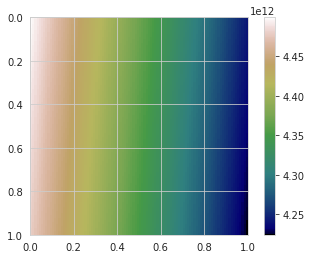

In [0]:
# Radial Basis Function(Normalizing it)
import numpy as np
import scipy.interpolate
import matplotlib.pyplot as plt
np.random.seed(2000)

x = random_subset1.Latitude
y = random_subset1.Longitude
z = random_subset1["'BS 10'"]

interp = scipy.interpolate.Rbf(x, y, z, function='cubic')

yi, xi = np.mgrid[0:1:100j, 0:1:100j]

zi = interp(xi, yi)

plt.plot(x, y, 'ko')
plt.imshow(zi, extent=[0, 1, 1, 0], cmap='gist_earth')
plt.colorbar()

plt.show()

In [0]:
import pandas as pd 
import folium
from folium.plugins import HeatMap

# Fingerprinting linear
max_amount = float(random_subset10["'BS 10'"].max())

hmap = folium.Map(location=[51.2, 4.42], zoom_start=12, width=500,height=500)

hm_wide = HeatMap( list(zip(random_subset1.Latitude.values, random_subset1.Longitude.values, random_subset1["'BS 1'"].values)),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=20, blur=15, 
                   max_zoom=1, 
                 )

hmap.add_child(hm_wide)

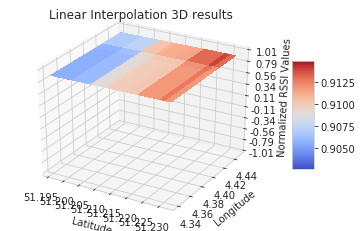

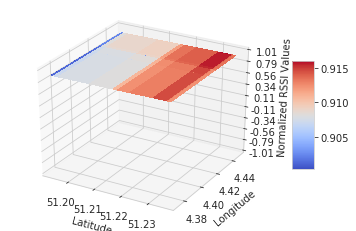

In [0]:
# This import registers the 3D projection, but is otherwise unused.
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt


fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df0.sample(20).Latitude
y = df0.sample(20).Longitude
z = random_subset10["'BS 1'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Linear Interpolation 3D results')

ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df1.sample(20).Latitude
y = df1.sample(20).Longitude
z = random_subset10["'BS 10'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

In [0]:
train_df10.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
67648,-112.0,-107.0,-103,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.79,51.206760,4.423392,2.023116
67649,-119.0,-107.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-200,-100,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.66,51.212746,4.410325,0.918989
67650,-111.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-200,-112,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.72,51.215317,4.405038,0.487241
67651,-104.0,-107.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-102,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.82,51.200565,4.430420,2.858115
67652,-119.0,-107.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-200,-200,-111,-200,-200,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.78,51.195877,4.409303,2.658220


In [0]:
random_subset10.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
25119,-119.0,-125.0,-200,-200,-90,-106,-125.0,-200,-119.0,-125.0,-200,-200,-200,-97,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.63,51.229771,4.401820,1.154136
14698,-119.0,-125.0,-200,-200,-200,-103,-125.0,-200,-119.0,-125.0,-200,-200,-200,-200,-200,-200,-200,-200,-105,-200,-200,-200,-200,-200,-98,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.39,51.225605,4.399967,0.712163
54343,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-104.0,-125.0,-200,-200,-200,-92,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,2.24,51.213833,4.411112,0.861966
7500,-119.0,-125.0,-200,-200,-113,-200,-125.0,-200,-119.0,-125.0,-200,-83,-200,-200,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.67,51.219616,4.420130,1.228072
24902,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-93,-200,-200,-92,-200,-200,-98,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.70,51.234554,4.433223,2.723325


## Fingerprinting Maps for Base Station-13

In [0]:
train_df10.isnull().sum().sum()

0

In [0]:
test_data.isnull().sum().sum()

0

In [0]:
len(train_df10.Latitude.unique())

10753

In [0]:
len(test_data.Latitude.unique())

9112

In [0]:
len(train_df10.Longitude.unique())

26882

In [0]:
len(test_data.Longitude.unique())

16627

In [0]:
train_sort_data = train_df10.sort_values("'BS 13'")

In [0]:
test_sort_data = test_data.sort_values("'BS 13'")

In [0]:
train_sort_data.loc[train_sort_data["'BS 13'"] == -200].shape

(60673, 73)

In [0]:
#train_sort_data1 = train_sort_data.iloc[69000:, :]

In [0]:
train_sort_data.shape

(78297, 73)

In [0]:
test_sort_data.shape

(33013, 72)

In [0]:
train_sort_data2 = train_sort_data.reset_index(drop=True)

In [0]:
test_sort_data2 = test_sort_data.reset_index(drop=True)

In [0]:
train_sort_data2.shape

(78297, 73)

In [0]:
test_sort_data2.shape

(33013, 72)

In [0]:
train_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
test_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
train_filtered_data = train_sort_data2.reset_index(drop=True)

In [0]:
test_filtered_data = test_sort_data2.reset_index(drop=True)

In [0]:
#train_filtered_data = train_sort_data2.iloc[970:1000,:]

In [0]:
train_filtered_data.groupby("'BS 13'").size()

'BS 13'
-200    60673
-120        4
-118       39
-117       43
-116      139
-115      705
-114      920
-113      927
-112      891
-111      924
-110      929
-109      943
-108      942
-107      946
-106     1003
-105      906
-104      855
-103      772
-102      688
-101      650
-100      584
-99       495
-98       461
-97       397
-96       312
-95       262
-94       240
-93       198
-92       171
-91       149
-90       143
-89       122
-88       123
-87       119
-86       115
-85        83
-84        77
-83        60
-82        57
-81        50
-80        45
-79        26
-78        35
-77        16
-76        14
-75        13
-74         6
-73        10
-72         5
-71         3
-70         6
-65         1
dtype: int64

In [0]:
# Replacing values with Nan outside range of (-150,150)
train_filtered_data["'BS 13'"]=train_filtered_data["'BS 13'"].where(train_filtered_data["'BS 13'"].between(-150,150))

In [0]:
#train_data["'BS 2'"]=train_data["'BS 2'"].where(train_data["'BS 2'"].between(-150,150))

In [0]:
train_filtered_data.shape

(78297, 73)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_filtered_data['distance'] = train_filtered_data.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_sort_data2['distance'] = train_sort_data2.apply(lambda row: haversine(row), axis=1)

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-119.0,-108.0,-200,-200,-200,-200,-125.0,-200,-119.0,-66.0,-200,-200,NaN,-98,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.73,51.194382,4.418512,2.997209
1,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-110.0,-125.0,-200,-200,NaN,-88,-200,-200,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.63,51.216011,4.410030,0.645791
2,-119.0,-125.0,-108,-200,-200,-200,-125.0,-200,-110.0,-125.0,-200,-200,NaN,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.77,51.212437,4.409275,0.906752
3,-119.0,-125.0,-200,-200,-101,-200,-125.0,-200,-110.0,-125.0,-200,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,1.25,51.231747,4.403097,1.373516
4,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-110.0,-125.0,-200,-114,NaN,-200,-200,-200,-116,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.76,51.213837,4.429653,1.989822


In [0]:
test_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-98,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.75,51.218407,4.406668,0.310602
1,-200,-200,-100,-200,-200,-200,-200,-200,-200,-200,-200,-117,-200,-200,-200,-200,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.71,51.213367,4.433892,2.287032
2,-200,-200,-200,-105,-103,-200,-200,-200,-200,-200,-200,-200,-200,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,1.35,51.231571,4.417382,1.704575
3,-114,-99,-200,-200,-200,-200,-200,-200,-200,-90,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.73,51.194420,4.418662,2.997175
4,-200,-118,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.76,51.196632,4.401170,2.533338


In [0]:
train_filtered_data.isnull().sum().sum()

60673

In [0]:
len(train_filtered_data.Latitude.unique())

10753

In [0]:
len(train_filtered_data.Longitude.unique())

26882

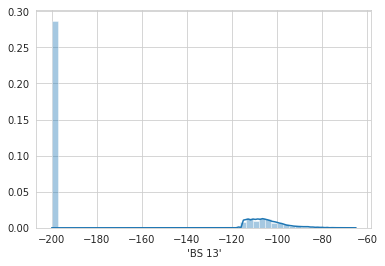

In [0]:
sns.distplot(train_sort_data2["'BS 13'"])

70% values from BS-1 have been made NaN as it is out of range. We will try to predict it using interpolation.

### Plotting Fingerprinting Heatmap for BS-13 training data

In [0]:
# Line 2.
extent = x_extent = x_min, x_max, y_min, y_max = [train_sort_data2.Latitude.min()-50, train_sort_data2.Latitude.max()+50,
                                                  train_sort_data2.Longitude.min()-10, train_sort_data2.Longitude.max()+10]

In [0]:
extent

[1.1861686700000007, 101.23601913, -5.674818516, 14.45976162]

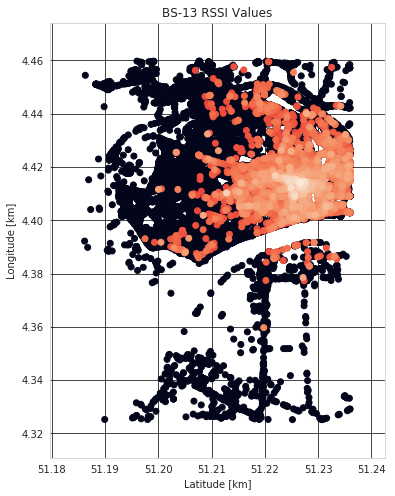

In [0]:
fig, ax = plt.subplots(figsize=(15,8))

ax.scatter(train_sort_data2.Latitude, train_sort_data2.Longitude, c=train_sort_data2["'BS 13'"])
ax.set_aspect(.5)
#ax.set_xlim(*extent[:])
#ax.set_ylim(*extent[:])
ax.set_xlabel('Latitude [km]')
ax.set_ylabel('Longitude [km]')
ax.set_title('BS-13 RSSI Values')
ax.grid(c='k', alpha=0.9)

plt.show()

### Interpolation Techniques

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-119.0,-108.0,-200,-200,-200,-200,-125.0,-200,-119.0,-66.0,-200,-200,NaN,-98,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.73,51.194382,4.418512,2.997209
1,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-110.0,-125.0,-200,-200,NaN,-88,-200,-200,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.63,51.216011,4.410030,0.645791
2,-119.0,-125.0,-108,-200,-200,-200,-125.0,-200,-110.0,-125.0,-200,-200,NaN,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.77,51.212437,4.409275,0.906752
3,-119.0,-125.0,-200,-200,-101,-200,-125.0,-200,-110.0,-125.0,-200,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,1.25,51.231747,4.403097,1.373516
4,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-110.0,-125.0,-200,-114,NaN,-200,-200,-200,-116,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.76,51.213837,4.429653,1.989822


In [0]:
train_filtered_data = train_filtered_data.reset_index(drop=True)

In [0]:
test_filtered_data = test_filtered_data.reset_index(drop=True)

In [0]:
train_df = train_filtered_data.sort_values(by="'BS 13'", ascending=False)

In [0]:
test_df = test_filtered_data.sort_values(by="'BS 13'", ascending=False)

### Linear *Interpolation*

In [0]:
train_df.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
60668,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,NaN,-200,-109,-200,-200,-200,-103,-200,-200,-200,-104,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.14,51.216366,4.393730,0.697789
60669,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,NaN,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-111,-200,-114,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.35,51.209644,4.388875,1.441319
60670,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,NaN,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-111,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.68,51.203934,4.389710,1.936843
60671,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-116,NaN,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-79,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.19,51.208046,4.403258,1.263616
60672,-119.0,-125.0,-200,-200,-111,-200,-125.0,-200,-119.0,-125.0,-200,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-112,-200,-200,-200,-200,-200,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.73,51.227592,4.401753,0.912444


In [0]:
train_df13 = train_df.interpolate(method ='linear', limit_direction ='forward')

In [0]:
train_df13.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
60668,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-200,-109,-200,-200,-200,-103,-200,-200,-200,-104,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.14,51.216366,4.393730,0.697789
60669,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-111,-200,-114,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.35,51.209644,4.388875,1.441319
60670,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-111,-200,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.68,51.203934,4.389710,1.936843
60671,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-116,-120.0,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-79,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.19,51.208046,4.403258,1.263616
60672,-119.0,-125.0,-200,-200,-111,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-112,-200,-200,-200,-200,-200,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.73,51.227592,4.401753,0.912444


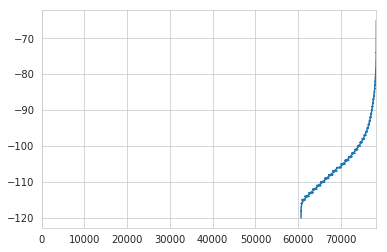

In [0]:
train_df["'BS 13'"].plot()

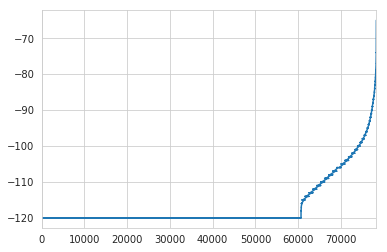

In [0]:
df_linear = train_df13["'BS 13'"].plot()

### Linear, Cubic, Quadratic *Interpolation*

In [0]:
from scipy.interpolate.rbf import Rbf  # radial basis functions
from urllib.request import urlopen
 
import matplotlib.pyplot as plt
import numpy as np

In [0]:
random_subset13 = train_df13.sample(n=100, replace=True)
random_test_subset1342 = test_df.sample(n=100, replace=True)

In [0]:
random_subset13.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
32786,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-104.0,-125.0,-200,-200,-120.0,-95,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.62,51.217308,4.416604,1.009444
8903,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-107,-200,-120.0,-200,-200,-200,-97,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.62,51.194046,4.418358,3.027969
10446,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-110,-200,-200,-112,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.99,51.215279,4.408410,0.616000
28734,-119.0,-125.0,-94,-200,-200,-200,-125.0,-200,-102.0,-125.0,-200,-102,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.69,51.213757,4.423274,1.577101
39683,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-102,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.16,51.194321,4.403091,2.788998


In [0]:
# Linear Interpolation

In [0]:
df0 = random_subset13.interpolate(method ='linear', limit_direction ='backward')

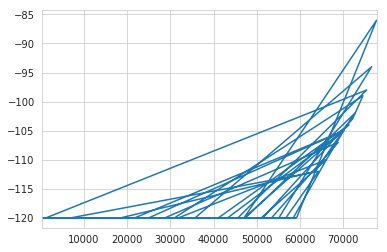

In [0]:
df_linear = df0["'BS 13'"].sample(100).plot()

In [0]:
# Cubic Interpolation

In [0]:
df1 = random_subset13.interpolate(method ='cubic', limit_direction ='backward')

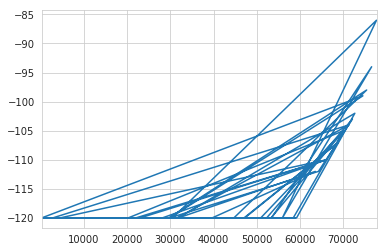

In [0]:
df_cubic = df1["'BS 13'"].plot()

In [0]:
# Quadratic Interpolation

In [0]:
df2 = random_subset13.interpolate(method ='quadratic', limit_direction ='backward')

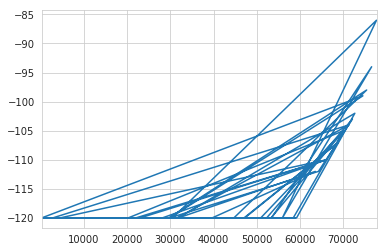

In [0]:
df_quadratic = df2
df2["'BS 13'"].plot()

In [0]:
import numpy as np; np.random.seed(0)
import seaborn as sns

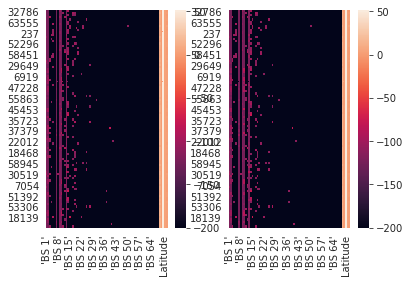

In [0]:
fig, ax =plt.subplots(1,2)

sns.heatmap(df0, ax=ax[0])
sns.heatmap(df1, ax=ax[1])

plt.show()

In [0]:
#Creating some data, with each coordinate and the values stored in separated lists
x = random_subset13.distance
y = random_subset13.distance
values = random_subset13["'BS 13'"]

In [0]:
random_subset13.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
hm = random_subset13.pivot("Latitude", "Longitude", "'BS 13'")
hm.head()

Longitude,4.327266693,4.387956619,4.389211655,4.39212513,4.39217186,4.398025036,4.398051739,4.4003548619999995,4.400566578,4.400650024,4.401158333,4.401598454,4.401888371,4.402454853,4.403091431,4.40435648,4.405106545,4.405125141,4.40541172,4.4058218,4.406803131,4.408410072,4.408496857,4.409953117,4.410299778,4.4107718469999995,4.410873413,4.4110484119999995,4.411463261000001,4.411626816,4.411690235,4.411703587,4.412363528999999,4.412433147,4.4125552180000005,4.412568092,4.414466858,4.414878368,4.41534853,4.415668488000001,...,4.418551445,4.418554783,4.418560028,4.418598175,4.418606758,4.4186115269999995,4.418613434,4.418641567,4.4187216760000005,4.418833256,4.418896675,4.41937685,4.420044899,4.420516491,4.421308518,4.422498226,4.423068523,4.423273563,4.423558235,4.423781872,4.424603462,4.424640179,4.425498486,4.425528526,4.4255700110000005,4.4262099269999995,4.426215172,4.427555084,4.427621841000001,4.428571701,4.429091454,4.4294466969999995,4.435768127,4.437336922,4.439439773999999,4.440245152,4.441971779,4.450573444,4.450578213,4.453100205
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.194046,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194153,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194222,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194248,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-120.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
hm_df = hm.interpolate(method ='linear', limit_direction ='both')

In [0]:
hm_df.head()

Longitude,4.327266693,4.387956619,4.389211655,4.39212513,4.39217186,4.398025036,4.398051739,4.4003548619999995,4.400566578,4.400650024,4.401158333,4.401598454,4.401888371,4.402454853,4.403091431,4.40435648,4.405106545,4.405125141,4.40541172,4.4058218,4.406803131,4.408410072,4.408496857,4.409953117,4.410299778,4.4107718469999995,4.410873413,4.4110484119999995,4.411463261000001,4.411626816,4.411690235,4.411703587,4.412363528999999,4.412433147,4.4125552180000005,4.412568092,4.414466858,4.414878368,4.41534853,4.415668488000001,...,4.418551445,4.418554783,4.418560028,4.418598175,4.418606758,4.4186115269999995,4.418613434,4.418641567,4.4187216760000005,4.418833256,4.418896675,4.41937685,4.420044899,4.420516491,4.421308518,4.422498226,4.423068523,4.423273563,4.423558235,4.423781872,4.424603462,4.424640179,4.425498486,4.425528526,4.4255700110000005,4.4262099269999995,4.426215172,4.427555084,4.427621841000001,4.428571701,4.429091454,4.4294466969999995,4.435768127,4.437336922,4.439439773999999,4.440245152,4.441971779,4.450573444,4.450578213,4.453100205
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.194046,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-110.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-112.0,-86.0,-120.0,-120.0,-120.0,-104.0,-107.0,-120.0,-102.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-105.0,-120.0,-94.0,-120.0,-110.0,-120.0,-120.0,-98.0,...,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0
51.194153,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-110.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-112.0,-86.0,-120.0,-120.0,-120.0,-104.0,-107.0,-120.0,-102.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-105.0,-120.0,-94.0,-120.0,-110.0,-120.0,-120.0,-98.0,...,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0
51.194222,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-110.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-112.0,-86.0,-120.0,-120.0,-120.0,-104.0,-107.0,-120.0,-102.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-105.0,-120.0,-94.0,-120.0,-110.0,-120.0,-120.0,-98.0,...,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0
51.194244,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-110.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-112.0,-86.0,-120.0,-120.0,-120.0,-104.0,-107.0,-120.0,-102.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-105.0,-120.0,-94.0,-120.0,-110.0,-120.0,-120.0,-98.0,...,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0
51.194248,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-110.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-112.0,-86.0,-120.0,-120.0,-120.0,-104.0,-107.0,-120.0,-102.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-105.0,-120.0,-94.0,-120.0,-110.0,-120.0,-120.0,-98.0,...,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-12

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

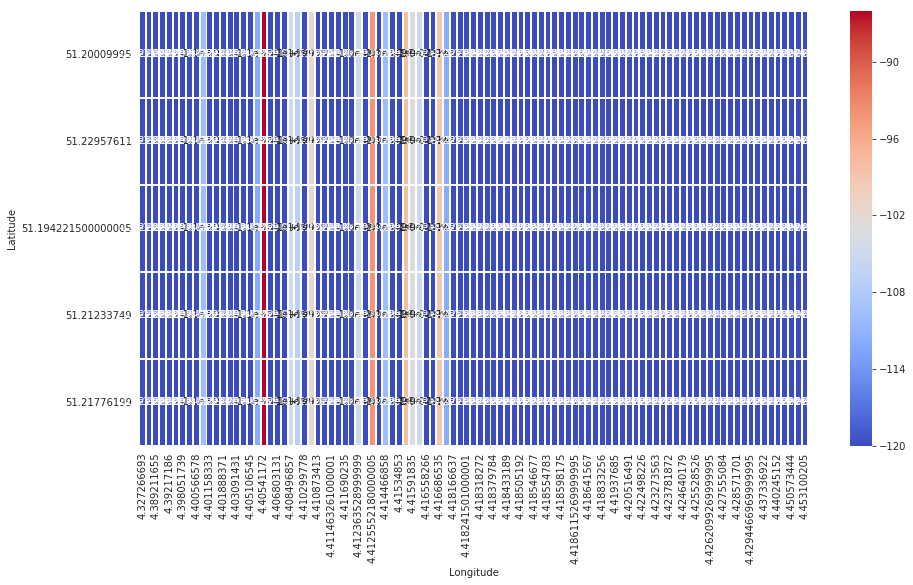

In [0]:
plt.figure(figsize=(15,8))
sns.heatmap(hm_df.sample(5), annot=True, linewidth = 0.9, cmap='coolwarm')

### AutoEncoder Imputation

In [0]:
from numpy import nan
from sklearn.preprocessing import Imputer

In [0]:
traincols = train_df.columns.tolist() 
traincols.remove('Latitude')
traincols.remove('Longitude')
traincols.remove('distance')
len(traincols)

70

In [0]:
columns_X = traincols
x = train_df[columns_X]

In [0]:
columns_y = ['Latitude','Longitude']
y = train_df[columns_y]

In [0]:
imp = Imputer(strategy='mean')
X2 = imp.fit_transform(train_df)
X2

array([[-119.        , -125.        , -200.        , ...,   51.22667313,
           4.41411495,    1.14381883],
       [-119.        , -125.        , -200.        , ...,   51.2265625 ,
           4.41407347,    1.1330983 ],
       [-119.        , -125.        , -200.        , ...,   51.22652817,
           4.41423321,    1.13837702],
       ...,
       [-119.        , -125.        , -200.        , ...,   51.20393372,
           4.38970995,    1.93684261],
       [-119.        , -125.        , -200.        , ...,   51.20804596,
           4.40325832,    1.26361611],
       [-119.        , -125.        , -200.        , ...,   51.22759247,
           4.40175343,    0.91244354]])

In [0]:
model = LinearRegression().fit(X2, y)
model.predict(X2)

array([[51.22667313,  4.41411495],
       [51.2265625 ,  4.41407347],
       [51.22652817,  4.41423321],
       ...,
       [51.20393372,  4.38970995],
       [51.20804596,  4.40325832],
       [51.22759247,  4.40175343]])

In [0]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures

model = make_pipeline(Imputer(strategy='mean'),
                      PolynomialFeatures(degree=2),
                      LinearRegression())

In [0]:
def make_reconstruction_loss(n_features):

    def reconstruction_loss(input_and_mask, y_pred):
        X_values = input_and_mask[:, :n_features]
        X_values.name = "$X_values"

        missing_mask = input_and_mask[:, n_features:]
        missing_mask.name = "$missing_mask"
        observed_mask = 1 - missing_mask
        observed_mask.name = "$observed_mask"

        X_values_observed = X_values * observed_mask
        X_values_observed.name = "$X_values_observed"

        pred_observed = y_pred * observed_mask
        pred_observed.name = "$y_pred_observed"

        return mse(y_true=X_values_observed, y_pred=pred_observed)
    return reconstruction_loss
  
def masked_mae(X_true, X_pred, mask):
    masked_diff = X_true[mask] - X_pred[mask]
    return np.mean(np.abs(masked_diff))

In [0]:
import random
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
from keras.utils import np_utils
from sklearn.preprocessing import LabelEncoder

from keras.objectives import mse
from keras.models import Sequential
from keras.layers.core import Dropout, Dense

from keras.regularizers import L1L2

from collections import defaultdict

%matplotlib inline

In [0]:
class Autoencoder:

    def __init__(self, data,
                 recurrent_weight=0.5,
                 optimizer="adam",
                 dropout_probability=0.5,
                 hidden_activation="relu",
                 output_activation="sigmoid",
                 init="glorot_normal",
                 L1_penalty=0,
                 L2_penalty=0):
        self.data = data.copy()
        self.recurrent_weight = recurrent_weight
        self.optimizer = optimizer
        self.dropout_probability = dropout_probability
        self.hidden_activation = hidden_activation
        self.output_activation = output_activation
        self.init = init
        self.L1_penalty = L1_penalty
        self.L2_penalty = L2_penalty

    def _get_hidden_layer_sizes(self):
        n_dims = self.data.shape[1]
        return [
            min(2000, 8 * n_dims),
            min(500, 2 * n_dims),
            int(np.ceil(0.5 * n_dims)),
        ]

    def _create_model(self):

        hidden_layer_sizes = self._get_hidden_layer_sizes()
        first_layer_size = hidden_layer_sizes[0]
        n_dims = self.data.shape[1]

        model = Sequential()

        model.add(Dense(
            first_layer_size,
            input_dim= 2 * n_dims,
            activation=self.hidden_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))
        model.add(Dropout(self.dropout_probability))

        for layer_size in hidden_layer_sizes[1:]:
            model.add(Dense(
                layer_size,
                activation=self.hidden_activation,
                W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
                init=self.init))
            model.add(Dropout(self.dropout_probability))

        model.add(Dense(
            n_dims,
            activation=self.output_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))

        loss_function = make_reconstruction_loss(n_dims)

        model.compile(optimizer=self.optimizer, loss=loss_function)
        return model

    def fill(self, missing_mask):
        self.data[missing_mask] = -1

    def _create_missing_mask(self):
        if self.data.dtype != "f" and self.data.dtype != "d":
            self.data = self.data.astype(float)

        return np.isnan(self.data)

    def _train_epoch(self, model, missing_mask, batch_size):
        input_with_mask = np.hstack([self.data, missing_mask])
        n_samples = len(input_with_mask)
        n_batches = int(np.ceil(n_samples / batch_size))
        indices = np.arange(n_samples)
        np.random.shuffle(indices)
        X_shuffled = input_with_mask[indices]

        for batch_idx in range(n_batches):
            batch_start = batch_idx * batch_size
            batch_end = (batch_idx + 1) * batch_size
            batch_data = X_shuffled[batch_start:batch_end, :]
            model.train_on_batch(batch_data, batch_data)
        return model.predict(input_with_mask)

    def train(self, batch_size=256, train_epochs=100):
        missing_mask = self._create_missing_mask()
        self.fill(missing_mask)
        self.model = self._create_model()

        observed_mask = ~missing_mask

        for epoch in range(train_epochs):
            X_pred = self._train_epoch(self.model, missing_mask, batch_size)
            observed_mae = masked_mae(X_true=self.data,
                                    X_pred=X_pred,
                                    mask=observed_mask)
            if epoch % 50 == 0:
                print("observed mae:", observed_mae)

            old_weight = (1.0 - self.recurrent_weight)
            self.data[missing_mask] *= old_weight
            pred_missing = X_pred[missing_mask]
            self.data[missing_mask] += self.recurrent_weight * pred_missing
        return self.data.copy()

In [0]:
train_df["'BS 13'"] = pd.to_numeric(train_df["'BS 13'"], errors='coerce')

In [0]:
train_df3 = train_df.dropna(subset=["'BS 13'"])


In [0]:
train_df3["'BS 13'"] = train_df3["'BS 13'"].astype(int)

In [0]:
missing_encoded = pd.get_dummies(train_df)

for col in train_df.columns:
    missing_cols = missing_encoded.columns.str.startswith(str(col) + "_")
    missing_encoded.loc[train_df[col].isnull(), missing_cols] = np.nan

In [0]:
missing_encoded.values

array([[-119.        , -125.        , -200.        , ...,   51.22667313,
           4.41411495,    1.14381883],
       [-119.        , -125.        , -200.        , ...,   51.2265625 ,
           4.41407347,    1.1330983 ],
       [-119.        , -125.        , -200.        , ...,   51.22652817,
           4.41423321,    1.13837702],
       ...,
       [-119.        , -125.        , -200.        , ...,   51.20393372,
           4.38970995,    1.93684261],
       [-119.        , -125.        , -200.        , ...,   51.20804596,
           4.40325832,    1.26361611],
       [-119.        , -125.        , -200.        , ...,   51.22759247,
           4.40175343,    0.91244354]])

In [0]:
#pip install autoencoder-impute

In [0]:
def mle(row):
    res = np.zeros(row.shape[0])
    res[np.argmax(row)] = 1
    return res

col_classes = [len(train_df[c].unique()) for c in train_df.columns]

dummy_df = pd.get_dummies(train_df)

mle_complete = None

for i, cnt in enumerate(col_classes):
    start_idx = int(sum(col_classes[0:i]))
    col_true = dummy_df.values[:, start_idx:start_idx+cnt]
    col_completed = complete_encoded[:, start_idx:start_idx+cnt]
    mle_completed = np.apply_along_axis(mle, axis=1, arr=col_completed)
    if mle_complete is None:
        mle_complete = mle_completed
    else:
        mle_complete = np.hstack([mle_complete, mle_completed])

In [0]:
model.fit(x, y)  # X with missing values, from above
print(model.predict(x))

[[51.23080826  4.40928626]
 [51.23075294  4.41336894]
 [51.22968006  4.41162467]
 ...
 [51.20249748  4.38958764]
 [51.2098875   4.40762591]
 [51.22776794  4.40298104]]


In [0]:
random_subset13.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
18139,-119.0,-125.0,-200,-200,-92,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-200,-75,-200,-200,-200,-200,-200,-200,-104,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.64,51.230068,4.402455,1.186255
7718,-119.0,-103.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-119,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.63,51.203377,4.425529,2.397428
47363,-119.0,-109.0,-200,-200,-200,-200,-108.0,-200,-119.0,-102.0,-200,-200,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.64,51.194248,4.418242,3.004067
520,-119.0,-125.0,-200,-200,-200,-200,-115.0,-200,-110.0,-125.0,-200,-200,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.67,51.220188,4.441972,2.750417
17922,-119.0,-125.0,-103,-200,-200,-200,-125.0,-200,-119.0,-125.0,-104,-200,-120.0,-200,-200,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.62,51.211273,4.423558,1.722774


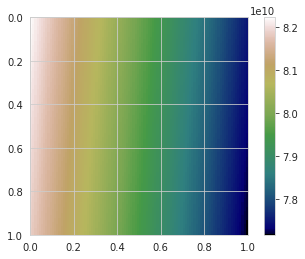

In [0]:
# Radial Basis Function(Normalizing it)
import numpy as np
import scipy.interpolate
import matplotlib.pyplot as plt
np.random.seed(2000)

x = random_subset13.Latitude
y = random_subset13.Longitude
z = random_subset13["'BS 13'"]

interp = scipy.interpolate.Rbf(x, y, z, function='cubic')

yi, xi = np.mgrid[0:1:100j, 0:1:100j]

zi = interp(xi, yi)

plt.plot(x, y, 'ko')
plt.imshow(zi, extent=[0, 1, 1, 0], cmap='gist_earth')
plt.colorbar()

plt.show()

In [0]:
import pandas as pd 
import folium
from folium.plugins import HeatMap

# Fingerprinting linear
max_amount = float(random_subset13["'BS 13'"].max())

hmap = folium.Map(location=[51.2, 4.42], zoom_start=12, width=500,height=500)

hm_wide = HeatMap( list(zip(random_subset13.Latitude.values, random_subset13.Longitude.values, random_subset13["'BS 13'"].values)),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=20, blur=15, 
                   max_zoom=1, 
                 )

hmap.add_child(hm_wide)

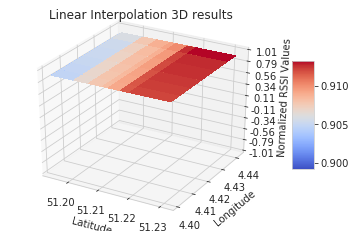

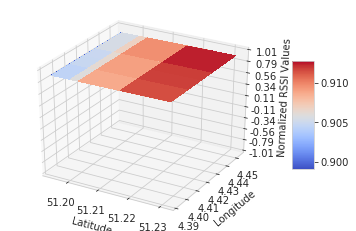

In [0]:
# This import registers the 3D projection, but is otherwise unused.
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt


fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df0.sample(20).Latitude
y = df0.sample(20).Longitude
z = random_subset13["'BS 1'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Linear Interpolation 3D results')

ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df1.sample(20).Latitude
y = df1.sample(20).Longitude
z = random_subset13["'BS 13'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

In [0]:
random_subset13.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
18139,-119.0,-125.0,-200,-200,-92,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-200,-75,-200,-200,-200,-200,-200,-200,-104,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.64,51.230068,4.402455,1.186255
7718,-119.0,-103.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-119,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.63,51.203377,4.425529,2.397428
47363,-119.0,-109.0,-200,-200,-200,-200,-108.0,-200,-119.0,-102.0,-200,-200,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.64,51.194248,4.418242,3.004067
520,-119.0,-125.0,-200,-200,-200,-200,-115.0,-200,-110.0,-125.0,-200,-200,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.67,51.220188,4.441972,2.750417
17922,-119.0,-125.0,-103,-200,-200,-200,-125.0,-200,-119.0,-125.0,-104,-200,-120.0,-200,-200,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.62,51.211273,4.423558,1.722774


## Fingerprinting Maps for Base Station-14

In [0]:
train_df13.isnull().sum().sum()

0

In [0]:
test_data.isnull().sum().sum()

0

In [0]:
len(train_df13.Latitude.unique())

10753

In [0]:
len(test_data.Latitude.unique())

9112

In [0]:
len(train_df13.Longitude.unique())

26882

In [0]:
len(test_data.Longitude.unique())

16627

In [0]:
train_sort_data = train_df13.sort_values("'BS 14'")

In [0]:
test_sort_data = test_data.sort_values("'BS 14'")

In [0]:
train_sort_data.loc[train_sort_data["'BS 14'"] == -200].shape

(44317, 73)

In [0]:
#train_sort_data1 = train_sort_data.iloc[69000:, :]

In [0]:
train_sort_data.shape

(78297, 73)

In [0]:
test_sort_data.shape

(33013, 72)

In [0]:
train_sort_data2 = train_sort_data.reset_index(drop=True)

In [0]:
test_sort_data2 = test_sort_data.reset_index(drop=True)

In [0]:
train_sort_data2.shape

(78297, 73)

In [0]:
test_sort_data2.shape

(33013, 72)

In [0]:
train_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
test_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
train_filtered_data = train_sort_data2.reset_index(drop=True)

In [0]:
test_filtered_data = test_sort_data2.reset_index(drop=True)

In [0]:
#train_filtered_data = train_sort_data2.iloc[970:1000,:]

In [0]:
train_filtered_data.groupby("'BS 14'").size()

'BS 14'
-200    44317
-121        2
-120        1
-119       23
-118        3
-117      117
-116      123
-115     1549
-114     1864
-113     2097
-112     1589
-111     1674
-110     1690
-109     1691
-108     1659
-107     1727
-106     1748
-105     1686
-104     1608
-103     1518
-102     1311
-101     1208
-100     1066
-99      1032
-98       944
-97       817
-96       725
-95       625
-94       531
-93       510
-92       444
-91       427
-90       334
-89       305
-88       251
-87       207
-86       163
-85       130
-84        93
-83        85
-82        61
-81        61
-80        51
-79        44
-78        37
-77        34
-76        27
-75        29
-74        18
-73        16
-72         6
-71         4
-70         5
-69         8
-68         2
dtype: int64

In [0]:
# Replacing values with Nan outside range of (-150,150)
train_filtered_data["'BS 14'"]=train_filtered_data["'BS 14'"].where(train_filtered_data["'BS 14'"].between(-150,150))

In [0]:
#train_data["'BS 2'"]=train_data["'BS 2'"].where(train_data["'BS 2'"].between(-150,150))

In [0]:
train_filtered_data.shape

(78297, 73)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_filtered_data['distance'] = train_filtered_data.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_sort_data2['distance'] = train_sort_data2.apply(lambda row: haversine(row), axis=1)

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-110.0,-105.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,NaN,-200,-200,-98,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.86,51.207195,4.433989,2.579236
1,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,NaN,-200,-200,-200,-87,-101,-200,-200,-200,-200,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.58,51.205212,4.387768,1.882037
2,-114.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-113,-200,-120.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.64,51.227329,4.439465,2.721045
3,-113.0,-105.0,-104,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.71,51.207405,4.420488,1.830001
4,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,NaN,-200,-200,-200,-104,-200,-200,-200,-200,-114,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.67,51.204857,4.394050,1.720908


In [0]:
test_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude
0,-200,-101,-200,-200,-200,-200,-200,-200,-200,-92,-200,-200,-200,-200,-200,-200,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.65,51.194344,4.418575
1,-106,-200,-200,-200,-103,-200,-200,-200,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.75,51.227123,4.412525
2,-200,-101,-200,-200,-200,-200,-111,-200,-200,-96,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.67,51.194309,4.418983
3,-200,-200,-200,-200,-200,-200,-101,-104,-200,-200,-200,-200,-200,-200,-200,-200,-96,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.69,51.209988,4.447072
4,-107,-101,-200,-200,-200,-200,-200,-200,-200,-93,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.74,51.194275,4.418485


In [0]:
train_filtered_data.isnull().sum().sum()

44317

In [0]:
len(train_filtered_data.Latitude.unique())

10753

In [0]:
len(train_filtered_data.Longitude.unique())

26882

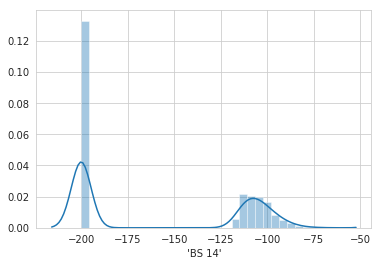

In [0]:
sns.distplot(train_sort_data2["'BS 14'"])

70% values from BS-1 have been made NaN as it is out of range. We will try to predict it using interpolation.

### Plotting Fingerprinting Heatmap for BS-14 training data

In [0]:
# Line 2.
extent = x_extent = x_min, x_max, y_min, y_max = [train_sort_data2.Latitude.min()-50, train_sort_data2.Latitude.max()+50,
                                                  train_sort_data2.Longitude.min()-10, train_sort_data2.Longitude.max()+10]

In [0]:
extent

[1.1861686700000007, 101.23601913, -5.674818516, 14.45976162]

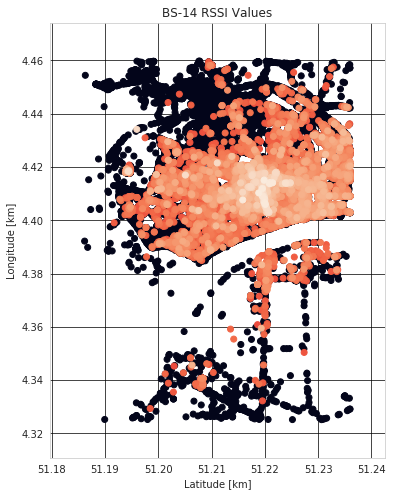

In [0]:
fig, ax = plt.subplots(figsize=(15,8))

ax.scatter(train_sort_data2.Latitude, train_sort_data2.Longitude, c=train_sort_data2["'BS 14'"])
ax.set_aspect(.5)
#ax.set_xlim(*extent[:])
#ax.set_ylim(*extent[:])
ax.set_xlabel('Latitude [km]')
ax.set_ylabel('Longitude [km]')
ax.set_title('BS-14 RSSI Values')
ax.grid(c='k', alpha=0.9)

plt.show()

### Interpolation Techniques

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-110.0,-105.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,NaN,-200,-200,-98,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.86,51.207195,4.433989,2.579236
1,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,NaN,-200,-200,-200,-87,-101,-200,-200,-200,-200,-200,-103,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.58,51.205212,4.387768,1.882037
2,-114.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-113,-200,-120.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-114,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.64,51.227329,4.439465,2.721045
3,-113.0,-105.0,-104,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.71,51.207405,4.420488,1.830001
4,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,NaN,-200,-200,-200,-104,-200,-200,-200,-200,-114,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.67,51.204857,4.394050,1.720908


In [0]:
train_filtered_data = train_filtered_data.reset_index(drop=True)

In [0]:
test_filtered_data = test_filtered_data.reset_index(drop=True)

In [0]:
train_df = train_filtered_data.sort_values(by="'BS 14'", ascending=False)

In [0]:
test_df = test_filtered_data.sort_values(by="'BS 14'", ascending=False)

### Linear *Interpolation*

In [0]:
train_df.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
44312,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,NaN,-200,-200,-200,-109,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.61,51.209972,4.401982,1.048925
44313,-119.0,-125.0,-200,-200,-200,-200,-115.0,-200,-119.0,-125.0,-200,-200,-120.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-115,-200,-200,-118,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.69,51.230968,4.429510,2.278710
44314,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-102.0,-125.0,-200,-200,-99.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.76,51.229328,4.413138,1.329501
44315,-119.0,-125.0,-200,-200,-108,-200,-125.0,-200,-119.0,-125.0,-200,-200,-99.0,NaN,-200,-200,-200,-200,-200,-93,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.68,51.223583,4.402998,0.466446
44316,-119.0,-125.0,-200,-200,-111,-200,-125.0,-200,-119.0,-125.0,-200,-95,-120.0,NaN,-200,-200,-200,-200,-200,-97,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.08,51.221176,4.406961,0.368170


In [0]:
test_df.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude
10325,-116,-200,-200,-200,-200,-200,-115,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.85,51.211823,4.455667
10324,-200,-200,-200,-200,-107,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.63,51.234478,4.410527
10323,-200,-200,-200,-200,-200,-200,-113,-114,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.64,51.214523,4.443067
10322,-114,-102,-200,-200,-200,-200,-200,-200,-200,-89,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.61,51.194252,4.418561
15495,-200,-200,-200,-114,-100,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-112,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.78,51.233730,4.409178


In [0]:
train_df14 = train_df.interpolate(method ='linear', limit_direction ='forward')

In [0]:
train_df14.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
44312,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-200,-109,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.61,51.209972,4.401982,1.048925
44313,-119.0,-125.0,-200,-200,-200,-200,-115.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-115,-200,-200,-118,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.69,51.230968,4.429510,2.278710
44314,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-102.0,-125.0,-200,-200,-99.0,-121.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.76,51.229328,4.413138,1.329501
44315,-119.0,-125.0,-200,-200,-108,-200,-125.0,-200,-119.0,-125.0,-200,-200,-99.0,-121.0,-200,-200,-200,-200,-200,-93,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.68,51.223583,4.402998,0.466446
44316,-119.0,-125.0,-200,-200,-111,-200,-125.0,-200,-119.0,-125.0,-200,-95,-120.0,-121.0,-200,-200,-200,-200,-200,-97,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.08,51.221176,4.406961,0.368170


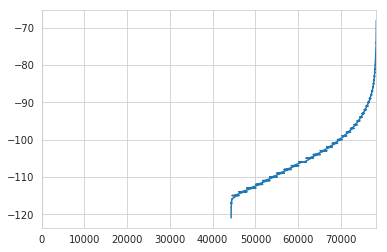

In [0]:
train_df["'BS 14'"].plot()

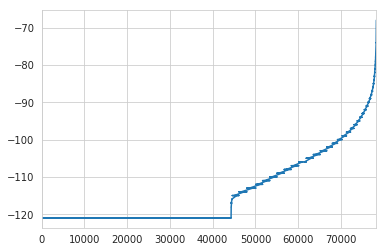

In [0]:
df_linear = train_df14["'BS 14'"].plot()

### Linear, Cubic, Quadratic *Interpolation*

In [0]:
from scipy.interpolate.rbf import Rbf  # radial basis functions
from urllib.request import urlopen
 
import matplotlib.pyplot as plt
import numpy as np

In [0]:
random_subset14 = train_df14.sample(n=100, replace=True)
random_test_subset14 = test_df.sample(n=100, replace=True)

In [0]:
random_subset14.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
16430,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-84,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-104,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.10,51.209946,4.335112,4.810087
52774,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-111.0,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-116,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,1.13,51.219124,4.404472,0.140724
51279,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-112.0,-125.0,-200,-200,-120.0,-112.0,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.80,51.213234,4.410313,0.875348
12378,-119.0,-104.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-111,-200,-200,-101,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.65,51.194408,4.407018,2.796706
23327,-119.0,-125.0,-200,-200,-200,-200,-113.0,-100,-119.0,-125.0,-116,-200,-120.0,-121.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.99,51.211700,4.455348,3.779238


In [0]:
# Linear Interpolation

In [0]:
df0 = random_subset14.interpolate(method ='linear', limit_direction ='backward')

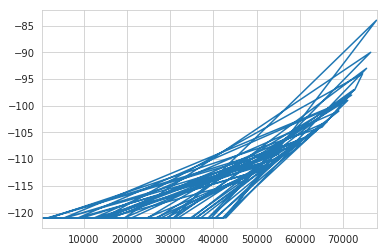

In [0]:
df_linear = df0["'BS 14'"].sample(100).plot()

In [0]:
# Cubic Interpolation

In [0]:
df1 = random_subset14.interpolate(method ='cubic', limit_direction ='backward')

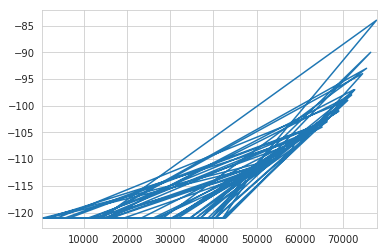

In [0]:
df_cubic = df1["'BS 14'"].plot()

In [0]:
# Quadratic Interpolation

In [0]:
df2 = random_subset14.interpolate(method ='quadratic', limit_direction ='backward')

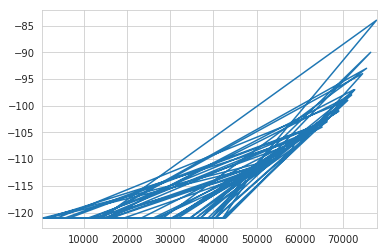

In [0]:
df_quadratic = df2
df2["'BS 14'"].plot()

In [0]:
import numpy as np; np.random.seed(0)
import seaborn as sns

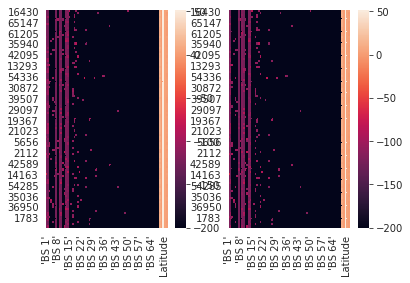

In [0]:
fig, ax =plt.subplots(1,2)

sns.heatmap(df0, ax=ax[0])
sns.heatmap(df1, ax=ax[1])

plt.show()

In [0]:
#Creating some data, with each coordinate and the values stored in separated lists
x = random_subset14.distance
y = random_subset14.distance
values = random_subset14["'BS 14'"]

In [0]:
random_subset14.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
hm = random_subset14.pivot("Latitude", "Longitude", "'BS 14'")
hm.head()

Longitude,4.335111618,4.372506619,4.381879807,4.383015156,4.388899803,4.389156818,4.390221596,4.396458149,4.396643162,4.400958538,4.401406765,4.401549816,4.40155983,4.401843548,4.40206337,4.402266502,4.403015137,4.404223442,4.40435648,4.404369831,4.404378414,4.404428482,4.4044718739999995,4.404648304,4.4049215319999995,4.405136585,4.405233383000001,4.405234814,4.405258179,4.407018185,4.407784939,4.407906532,4.408313274,4.408411503,4.409184933,4.409216881,4.409388542,4.409826756,4.410058498,4.410078526,...,4.418610096,4.418653488,4.418683529,4.4187035560000005,4.418755055,4.418858528,4.418885231,4.419396877,4.419528484,4.419994831,4.42027998,4.421163559,4.422231674,4.422381878,4.4225349430000005,4.422605038,4.423526764,4.423703194,4.423708438999999,4.424288273,4.425521851,4.4256300930000005,4.426121712,4.4261884689999995,4.426646709,4.427138329,4.427208424,4.428064823,4.428410053,4.428891659,4.436601639,4.4375448230000005,4.4394083019999995,4.439501762,4.439518452,4.4403715130000005,4.448466778,4.450881481000001,4.45141983,4.455348492
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.188728,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-121.0,NaN,NaN
51.194103,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,-121.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194222,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194256,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
hm_df = hm.interpolate(method ='linear', limit_direction ='both')

In [0]:
hm_df.head()

Longitude,4.335111618,4.372506619,4.381879807,4.383015156,4.388899803,4.389156818,4.390221596,4.396458149,4.396643162,4.400958538,4.401406765,4.401549816,4.40155983,4.401843548,4.40206337,4.402266502,4.403015137,4.404223442,4.40435648,4.404369831,4.404378414,4.404428482,4.4044718739999995,4.404648304,4.4049215319999995,4.405136585,4.405233383000001,4.405234814,4.405258179,4.407018185,4.407784939,4.407906532,4.408313274,4.408411503,4.409184933,4.409216881,4.409388542,4.409826756,4.410058498,4.410078526,...,4.418610096,4.418653488,4.418683529,4.4187035560000005,4.418755055,4.418858528,4.418885231,4.419396877,4.419528484,4.419994831,4.42027998,4.421163559,4.422231674,4.422381878,4.4225349430000005,4.422605038,4.423526764,4.423703194,4.423708438999999,4.424288273,4.425521851,4.4256300930000005,4.426121712,4.4261884689999995,4.426646709,4.427138329,4.427208424,4.428064823,4.428410053,4.428891659,4.436601639,4.4375448230000005,4.4394083019999995,4.439501762,4.439518452,4.4403715130000005,4.448466778,4.450881481000001,4.45141983,4.455348492
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.188728,-121.0,-121.0,-121.0,-121.0,-93.0,-121.0,-121.0,-121.0,-107.0,-121.0,-121.0,-121.0,-121.0,-109.0,-114.0,-121.0,-121.0,-121.0,-110.0,-108.0,-94.0,-108.0,-111.0,-110.0,-121.0,-107.0,-121.0,-90.0,-99.0,-121.0,-112.0,-103.0,-113.0,-111.0,-104.0,-98.0,-121.0,-121.0,-121.0,-110.0,...,-121.0,-106.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-84.0,-121.0,-97.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-101.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0
51.194103,-121.0,-121.0,-121.0,-121.0,-93.0,-121.0,-121.0,-121.0,-107.0,-121.0,-121.0,-121.0,-121.0,-109.0,-114.0,-121.0,-121.0,-121.0,-110.0,-108.0,-94.0,-108.0,-111.0,-110.0,-121.0,-107.0,-121.0,-90.0,-99.0,-121.0,-112.0,-103.0,-113.0,-111.0,-104.0,-98.0,-121.0,-121.0,-121.0,-110.0,...,-121.0,-106.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-84.0,-121.0,-97.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-101.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0
51.194157,-121.0,-121.0,-121.0,-121.0,-93.0,-121.0,-121.0,-121.0,-107.0,-121.0,-121.0,-121.0,-121.0,-109.0,-114.0,-121.0,-121.0,-121.0,-110.0,-108.0,-94.0,-108.0,-111.0,-110.0,-121.0,-107.0,-121.0,-90.0,-99.0,-121.0,-112.0,-103.0,-113.0,-111.0,-104.0,-98.0,-121.0,-121.0,-121.0,-110.0,...,-121.0,-106.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-84.0,-121.0,-97.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-101.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0
51.194222,-121.0,-121.0,-121.0,-121.0,-93.0,-121.0,-121.0,-121.0,-107.0,-121.0,-121.0,-121.0,-121.0,-109.0,-114.0,-121.0,-121.0,-121.0,-110.0,-108.0,-94.0,-108.0,-111.0,-110.0,-121.0,-107.0,-121.0,-90.0,-99.0,-121.0,-112.0,-103.0,-113.0,-111.0,-104.0,-98.0,-121.0,-121.0,-121.0,-110.0,...,-121.0,-106.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-84.0,-121.0,-97.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-101.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0
51.194256,-121.0,-121.0,-121.0,-121.0,-93.0,-121.0,-121.0,-121.0,-107.0,-121.0,-121.0,-121.0,-121.0,-109.0,-114.0,-121.0,-121.0,-121.0,-110.0,-108.0,-94.0,-108.0,-111.0,-110.0,-121.0,-107.0,-121.0,-90.0,-99.0,-121.0,-112.0,-103.0,-113.0,-111.0,-104.0,-98.0,-121.0,-121.0,-121.0,-110.0,...,-121.0,-106.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-84.0,-121.0,-97.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-101.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0


In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

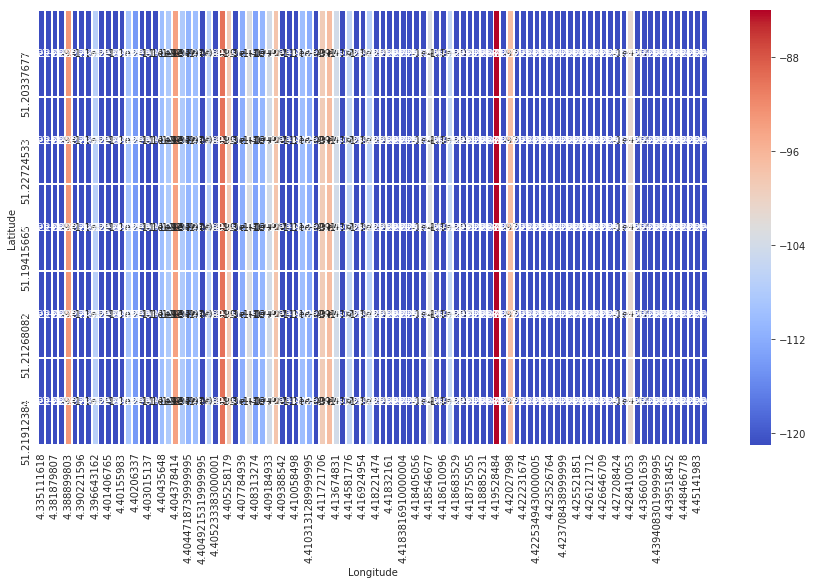

In [0]:
plt.figure(figsize=(15,8))
sns.heatmap(hm_df.sample(5), annot=True, linewidth = 0.9, cmap='coolwarm')

### AutoEncoder Imputation

In [0]:
from numpy import nan
from sklearn.preprocessing import Imputer

In [0]:
traincols = train_df.columns.tolist() 
traincols.remove('Latitude')
traincols.remove('Longitude')
traincols.remove('distance')
len(traincols)

70

In [0]:
columns_X = traincols
x = train_df[columns_X]

In [0]:
columns_y = ['Latitude','Longitude']
y = train_df[columns_y]

In [0]:
imp = Imputer(strategy='mean')
X2 = imp.fit_transform(train_df)
X2

array([[-119.        , -125.        , -200.        , ...,   51.21883774,
           4.41028833,    0.54601939],
       [-119.        , -125.        , -200.        , ...,   51.219841  ,
           4.41506815,    0.8766874 ],
       [-119.        , -125.        , -200.        , ...,   51.22086716,
           4.41389656,    0.81030287],
       ...,
       [-119.        , -125.        , -200.        , ...,   51.22932816,
           4.41313839,    1.32950106],
       [-119.        , -125.        , -200.        , ...,   51.22358322,
           4.40299845,    0.46644632],
       [-119.        , -125.        , -200.        , ...,   51.22117615,
           4.40696144,    0.36817039]])

In [0]:
model = LinearRegression().fit(X2, y)
model.predict(X2)

array([[51.21883774,  4.41028833],
       [51.219841  ,  4.41506815],
       [51.22086716,  4.41389656],
       ...,
       [51.22932816,  4.41313839],
       [51.22358322,  4.40299845],
       [51.22117615,  4.40696144]])

In [0]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures

model = make_pipeline(Imputer(strategy='mean'),
                      PolynomialFeatures(degree=2),
                      LinearRegression())

In [0]:
def make_reconstruction_loss(n_features):

    def reconstruction_loss(input_and_mask, y_pred):
        X_values = input_and_mask[:, :n_features]
        X_values.name = "$X_values"

        missing_mask = input_and_mask[:, n_features:]
        missing_mask.name = "$missing_mask"
        observed_mask = 1 - missing_mask
        observed_mask.name = "$observed_mask"

        X_values_observed = X_values * observed_mask
        X_values_observed.name = "$X_values_observed"

        pred_observed = y_pred * observed_mask
        pred_observed.name = "$y_pred_observed"

        return mse(y_true=X_values_observed, y_pred=pred_observed)
    return reconstruction_loss
  
def masked_mae(X_true, X_pred, mask):
    masked_diff = X_true[mask] - X_pred[mask]
    return np.mean(np.abs(masked_diff))

In [0]:
import random
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
from keras.utils import np_utils
from sklearn.preprocessing import LabelEncoder

from keras.objectives import mse
from keras.models import Sequential
from keras.layers.core import Dropout, Dense

from keras.regularizers import L1L2

from collections import defaultdict

%matplotlib inline

In [0]:
class Autoencoder:

    def __init__(self, data,
                 recurrent_weight=0.5,
                 optimizer="adam",
                 dropout_probability=0.5,
                 hidden_activation="relu",
                 output_activation="sigmoid",
                 init="glorot_normal",
                 L1_penalty=0,
                 L2_penalty=0):
        self.data = data.copy()
        self.recurrent_weight = recurrent_weight
        self.optimizer = optimizer
        self.dropout_probability = dropout_probability
        self.hidden_activation = hidden_activation
        self.output_activation = output_activation
        self.init = init
        self.L1_penalty = L1_penalty
        self.L2_penalty = L2_penalty

    def _get_hidden_layer_sizes(self):
        n_dims = self.data.shape[1]
        return [
            min(2000, 8 * n_dims),
            min(500, 2 * n_dims),
            int(np.ceil(0.5 * n_dims)),
        ]

    def _create_model(self):

        hidden_layer_sizes = self._get_hidden_layer_sizes()
        first_layer_size = hidden_layer_sizes[0]
        n_dims = self.data.shape[1]

        model = Sequential()

        model.add(Dense(
            first_layer_size,
            input_dim= 2 * n_dims,
            activation=self.hidden_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))
        model.add(Dropout(self.dropout_probability))

        for layer_size in hidden_layer_sizes[1:]:
            model.add(Dense(
                layer_size,
                activation=self.hidden_activation,
                W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
                init=self.init))
            model.add(Dropout(self.dropout_probability))

        model.add(Dense(
            n_dims,
            activation=self.output_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))

        loss_function = make_reconstruction_loss(n_dims)

        model.compile(optimizer=self.optimizer, loss=loss_function)
        return model

    def fill(self, missing_mask):
        self.data[missing_mask] = -1

    def _create_missing_mask(self):
        if self.data.dtype != "f" and self.data.dtype != "d":
            self.data = self.data.astype(float)

        return np.isnan(self.data)

    def _train_epoch(self, model, missing_mask, batch_size):
        input_with_mask = np.hstack([self.data, missing_mask])
        n_samples = len(input_with_mask)
        n_batches = int(np.ceil(n_samples / batch_size))
        indices = np.arange(n_samples)
        np.random.shuffle(indices)
        X_shuffled = input_with_mask[indices]

        for batch_idx in range(n_batches):
            batch_start = batch_idx * batch_size
            batch_end = (batch_idx + 1) * batch_size
            batch_data = X_shuffled[batch_start:batch_end, :]
            model.train_on_batch(batch_data, batch_data)
        return model.predict(input_with_mask)

    def train(self, batch_size=256, train_epochs=100):
        missing_mask = self._create_missing_mask()
        self.fill(missing_mask)
        self.model = self._create_model()

        observed_mask = ~missing_mask

        for epoch in range(train_epochs):
            X_pred = self._train_epoch(self.model, missing_mask, batch_size)
            observed_mae = masked_mae(X_true=self.data,
                                    X_pred=X_pred,
                                    mask=observed_mask)
            if epoch % 50 == 0:
                print("observed mae:", observed_mae)

            old_weight = (1.0 - self.recurrent_weight)
            self.data[missing_mask] *= old_weight
            pred_missing = X_pred[missing_mask]
            self.data[missing_mask] += self.recurrent_weight * pred_missing
        return self.data.copy()

In [0]:
train_df["'BS 14'"] = pd.to_numeric(train_df["'BS 14'"], errors='coerce')

In [0]:
train_df3 = train_df.dropna(subset=["'BS 14'"])


In [0]:
train_df3["'BS 14'"] = train_df3["'BS 14'"].astype(int)

In [0]:
missing_encoded = pd.get_dummies(train_df)

for col in train_df.columns:
    missing_cols = missing_encoded.columns.str.startswith(str(col) + "_")
    missing_encoded.loc[train_df[col].isnull(), missing_cols] = np.nan

In [0]:
missing_encoded.values

array([[-119.        , -125.        , -200.        , ...,   51.21883774,
           4.41028833,    0.54601939],
       [-119.        , -125.        , -200.        , ...,   51.219841  ,
           4.41506815,    0.8766874 ],
       [-119.        , -125.        , -200.        , ...,   51.22086716,
           4.41389656,    0.81030287],
       ...,
       [-119.        , -125.        , -200.        , ...,   51.22932816,
           4.41313839,    1.32950106],
       [-119.        , -125.        , -200.        , ...,   51.22358322,
           4.40299845,    0.46644632],
       [-119.        , -125.        , -200.        , ...,   51.22117615,
           4.40696144,    0.36817039]])

In [0]:
#pip install autoencoder-impute

In [0]:
def mle(row):
    res = np.zeros(row.shape[0])
    res[np.argmax(row)] = 1
    return res

col_classes = [len(train_df[c].unique()) for c in train_df.columns]

dummy_df = pd.get_dummies(train_df)

mle_complete = None

for i, cnt in enumerate(col_classes):
    start_idx = int(sum(col_classes[0:i]))
    col_true = dummy_df.values[:, start_idx:start_idx+cnt]
    col_completed = complete_encoded[:, start_idx:start_idx+cnt]
    mle_completed = np.apply_along_axis(mle, axis=1, arr=col_completed)
    if mle_complete is None:
        mle_complete = mle_completed
    else:
        mle_complete = np.hstack([mle_complete, mle_completed])

In [0]:
model.fit(x, y)  # X with missing values, from above
print(model.predict(x))

[[51.22153234  4.41125393]
 [51.22045803  4.40853405]
 [51.2217927   4.41143703]
 ...
 [51.22637272  4.41624355]
 [51.2249732   4.40528774]
 [51.22167492  4.40663052]]


In [0]:
random_subset14.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
1783,-97.0,-125.0,-105,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.73,51.201485,4.423708,2.480130
52375,-119.0,-104.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-111.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-116,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.86,51.208958,4.408412,1.231981
31007,-119.0,-125.0,-200,-200,-114,-200,-125.0,-200,-119.0,-125.0,-200,-200,-109.0,-121.0,-200,-200,-200,-200,-200,-112,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.91,51.227364,4.409389,1.007103
60925,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-106.0,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.01,51.210121,4.414582,1.331429
1566,-119.0,-96.0,-200,-200,-200,-200,-125.0,-200,-106.0,-125.0,-200,-94,-120.0,-121.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.72,51.213459,4.424288,1.655111


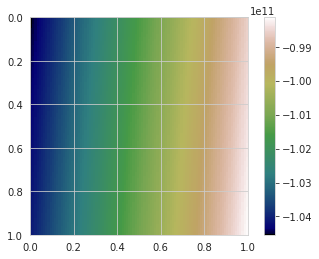

In [0]:
# Radial Basis Function(Normalizing it)
import numpy as np
import scipy.interpolate
import matplotlib.pyplot as plt
np.random.seed(2000)

x = random_subset1.Latitude
y = random_subset1.Longitude
z = random_subset14["'BS 14'"]

interp = scipy.interpolate.Rbf(x, y, z, function='cubic')

yi, xi = np.mgrid[0:1:100j, 0:1:100j]

zi = interp(xi, yi)

plt.plot(x, y, 'ko')
plt.imshow(zi, extent=[0, 1, 1, 0], cmap='gist_earth')
plt.colorbar()

plt.show()

In [0]:
import pandas as pd 
import folium
from folium.plugins import HeatMap

# Fingerprinting linear
max_amount = float(random_subset14["'BS 14'"].max())

hmap = folium.Map(location=[51.2, 4.42], zoom_start=12, width=500,height=500)

hm_wide = HeatMap( list(zip(random_subset14.Latitude.values, random_subset14.Longitude.values, random_subset14["'BS 14'"].values)),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=20, blur=15, 
                   max_zoom=1, 
                 )

hmap.add_child(hm_wide)

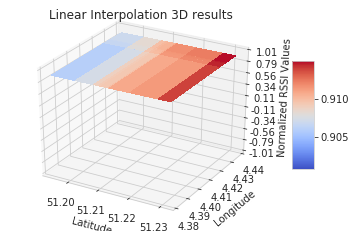

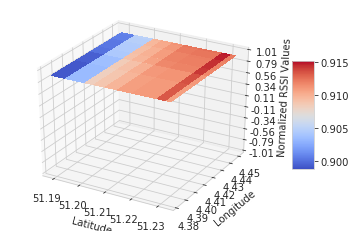

In [0]:
# This import registers the 3D projection, but is otherwise unused.
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt


fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df0.sample(20).Latitude
y = df0.sample(20).Longitude
z = random_subset14["'BS 1'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Linear Interpolation 3D results')

ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df1.sample(20).Latitude
y = df1.sample(20).Longitude
z = random_subset14["'BS 14'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

In [0]:
random_subset14.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
1783,-97.0,-125.0,-105,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.73,51.201485,4.423708,2.480130
52375,-119.0,-104.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-111.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-116,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.86,51.208958,4.408412,1.231981
31007,-119.0,-125.0,-200,-200,-114,-200,-125.0,-200,-119.0,-125.0,-200,-200,-109.0,-121.0,-200,-200,-200,-200,-200,-112,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.91,51.227364,4.409389,1.007103
60925,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-106.0,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.01,51.210121,4.414582,1.331429
1566,-119.0,-96.0,-200,-200,-200,-200,-125.0,-200,-106.0,-125.0,-200,-94,-120.0,-121.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.72,51.213459,4.424288,1.655111


## Fingerprinting Maps for Base Station-17

In [0]:
train_df14.isnull().sum().sum()

0

In [0]:
test_data.isnull().sum().sum()

0

In [0]:
len(train_df14.Latitude.unique())

10753

In [0]:
len(test_data.Latitude.unique())

9112

In [0]:
len(train_df14.Longitude.unique())

26882

In [0]:
len(test_data.Longitude.unique())

16627

In [0]:
train_sort_data = train_df14.sort_values("'BS 17'")

In [0]:
test_sort_data = test_data.sort_values("'BS 17'")

In [0]:
train_sort_data.loc[train_sort_data["'BS 17'"] == -200].shape

(65867, 73)

In [0]:
#train_sort_data1 = train_sort_data.iloc[69000:, :]

In [0]:
train_sort_data.shape

(78297, 73)

In [0]:
test_sort_data.shape

(33013, 72)

In [0]:
train_sort_data2 = train_sort_data.reset_index(drop=True)

In [0]:
test_sort_data2 = test_sort_data.reset_index(drop=True)

In [0]:
train_sort_data2.shape

(78297, 73)

In [0]:
test_sort_data2.shape

(33013, 72)

In [0]:
train_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
test_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
train_filtered_data = train_sort_data2.reset_index(drop=True)

In [0]:
test_filtered_data = test_sort_data2.reset_index(drop=True)

In [0]:
#train_filtered_data = train_sort_data2.iloc[970:1000,:]

In [0]:
train_filtered_data.groupby("'BS 17'").size()

'BS 17'
-200    65867
-121        8
-119       63
-117      568
-116      740
-115      870
-114     1424
-113     1274
-112      841
-111     1046
-110      902
-109      809
-108      585
-107      579
-106      337
-105      356
-104      319
-103      265
-102      192
-101      231
-100      129
-99       151
-98       124
-97        93
-96        80
-95        62
-94        41
-93        59
-92        27
-91        30
-90        24
-89        26
-88        16
-87        22
-86        14
-85        16
-84        10
-83        12
-82        11
-81        10
-80        16
-79        10
-78         6
-77         4
-76         4
-75         6
-74         5
-73         4
-71         2
-70         1
-69         1
-68         3
-67         1
-65         1
dtype: int64

In [0]:
# Replacing values with Nan outside range of (-150,150)
train_filtered_data["'BS 17'"]=train_filtered_data["'BS 17'"].where(train_filtered_data["'BS 17'"].between(-150,150))

In [0]:
#train_data["'BS 2'"]=train_data["'BS 2'"].where(train_data["'BS 2'"].between(-150,150))

In [0]:
train_filtered_data.shape

(78297, 73)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_filtered_data['distance'] = train_filtered_data.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_sort_data2['distance'] = train_sort_data2.apply(lambda row: haversine(row), axis=1)

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-105.0,-68.0,-200,-200,NaN,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.84,51.218838,4.410288,0.546019
1,-119.0,-125.0,-200,-107,-200,-200,-89.0,-200,-119.0,-125.0,-102,-200,-120.0,-121.0,-200,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.08,51.224159,4.458848,3.959755
2,-119.0,-97.0,-200,-200,-200,-200,-108.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.74,51.205502,4.425737,2.237908
3,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-96,-200,NaN,-106,-200,-200,-200,-200,-200,-200,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.65,51.225227,4.378290,1.806235
4,-119.0,-111.0,-200,-200,-200,-200,-101.0,-103,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.64,51.211777,4.449743,3.397997


In [0]:
train_filtered_data.isnull().sum().sum()

65867

In [0]:
len(train_filtered_data.Latitude.unique())

10753

In [0]:
len(train_filtered_data.Longitude.unique())

26882

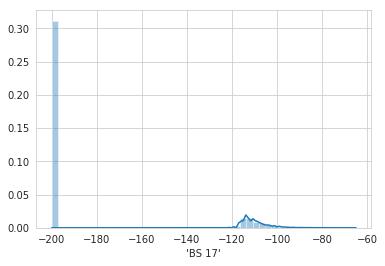

In [0]:
sns.distplot(train_sort_data2["'BS 17'"])

70% values from BS-1 have been made NaN as it is out of range. We will try to predict it using interpolation.

### Plotting Fingerprinting Heatmap for BS-17 training data

In [0]:
# Line 2.
extent = x_extent = x_min, x_max, y_min, y_max = [train_sort_data2.Latitude.min()-50, train_sort_data2.Latitude.max()+50,
                                                  train_sort_data2.Longitude.min()-10, train_sort_data2.Longitude.max()+10]

In [0]:
extent

[1.1861686700000007, 101.23601913, -5.674818516, 14.45976162]

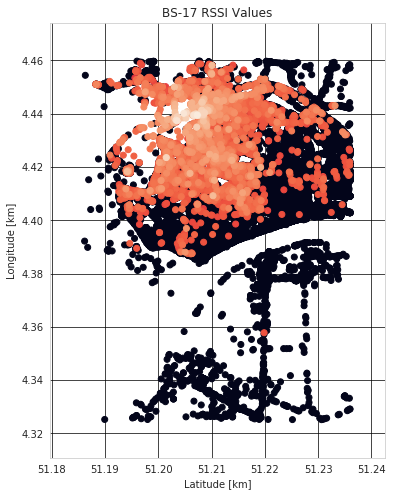

In [0]:
fig, ax = plt.subplots(figsize=(15,8))

ax.scatter(train_sort_data2.Latitude, train_sort_data2.Longitude, c=train_sort_data2["'BS 17'"])
ax.set_aspect(.5)
#ax.set_xlim(*extent[:])
#ax.set_ylim(*extent[:])
ax.set_xlabel('Latitude [km]')
ax.set_ylabel('Longitude [km]')
ax.set_title('BS-17 RSSI Values')
ax.grid(c='k', alpha=0.9)

plt.show()

### Interpolation Techniques

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-105.0,-68.0,-200,-200,NaN,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.84,51.218838,4.410288,0.546019
1,-119.0,-125.0,-200,-107,-200,-200,-89.0,-200,-119.0,-125.0,-102,-200,-120.0,-121.0,-200,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,1.08,51.224159,4.458848,3.959755
2,-119.0,-97.0,-200,-200,-200,-200,-108.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.74,51.205502,4.425737,2.237908
3,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-96,-200,NaN,-106,-200,-200,-200,-200,-200,-200,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.65,51.225227,4.378290,1.806235
4,-119.0,-111.0,-200,-200,-200,-200,-101.0,-103,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.64,51.211777,4.449743,3.397997


In [0]:
train_filtered_data = train_filtered_data.reset_index(drop=True)

In [0]:
test_filtered_data = test_filtered_data.reset_index(drop=True)

In [0]:
train_df = train_filtered_data.sort_values(by="'BS 17'", ascending=False)

In [0]:
test_df = test_filtered_data.sort_values(by="'BS 17'", ascending=False)

### Linear *Interpolation*

In [0]:
train_df.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
65862,-119.0,-98.0,-200,-200,-200,-200,-125.0,-200,-119.0,-97.0,-200,-200,-120.0,-110.0,-200,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.62,51.194321,4.418217,2.995933
65863,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-98.0,-125.0,-200,-200,-115.0,-114.0,-200,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.76,51.220673,4.419852,1.216719
65864,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-115.0,-125.0,-200,-200,-96.0,-109.0,-200,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.63,51.225689,4.409387,0.847954
65865,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-115.0,-115.0,-200,-200,NaN,-200,-200,-114,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.81,51.222733,4.402174,0.371258
65866,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-113,-200,-120.0,-110.0,-200,-200,NaN,-200,-200,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.86,51.222839,4.405070,0.422245


In [0]:
test_df.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude
10325,-200,-102,-200,-200,-200,-200,-200,-200,-200,-87,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.78,51.194527,4.418533
10324,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-101,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.88,51.215313,4.406378
10323,-108,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.82,51.200695,4.411787
10322,-200,-200,-200,-200,-112,-200,-200,-200,-200,-200,-200,-200,-108,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.65,51.226562,4.405282
15495,-200,-200,-200,-105,-200,-200,-200,-200,-200,-200,-200,-200,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-104,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,1.28,51.235603,4.418245


In [0]:
train_df17 = train_df.interpolate(method ='linear', limit_direction ='forward')

In [0]:
train_df17.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
65862,-119.0,-98.0,-200,-200,-200,-200,-125.0,-200,-119.0,-97.0,-200,-200,-120.0,-110.0,-200,-200,-121.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.62,51.194321,4.418217,2.995933
65863,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-98.0,-125.0,-200,-200,-115.0,-114.0,-200,-200,-121.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.76,51.220673,4.419852,1.216719
65864,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-115.0,-125.0,-200,-200,-96.0,-109.0,-200,-200,-121.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.63,51.225689,4.409387,0.847954
65865,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-115.0,-115.0,-200,-200,-121.0,-200,-200,-114,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.81,51.222733,4.402174,0.371258
65866,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-113,-200,-120.0,-110.0,-200,-200,-121.0,-200,-200,-107,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.86,51.222839,4.405070,0.422245


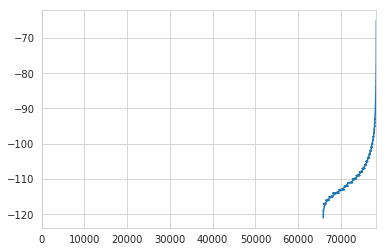

In [0]:
train_df["'BS 17'"].plot()

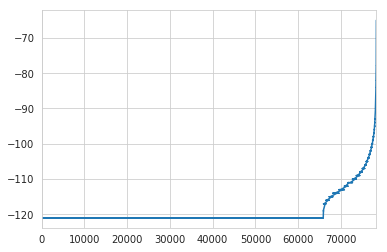

In [0]:
df_linear = train_df17["'BS 17'"].plot()

### Linear, Cubic, Quadratic *Interpolation*

In [0]:
from scipy.interpolate.rbf import Rbf  # radial basis functions
from urllib.request import urlopen
 
import matplotlib.pyplot as plt
import numpy as np

In [0]:
random_subset17 = train_df17.sample(n=100, replace=True)
random_test_subset1 = test_df.sample(n=100, replace=True)

In [0]:
random_subset17.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
37980,-119.0,-125.0,-200,-200,-103,-200,-125.0,-200,-119.0,-125.0,-200,-200,-99.0,-103.0,-200,-200,-121.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,1.04,51.234791,4.417180,1.993434
14097,-119.0,-107.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-114,-120.0,-121.0,-200,-200,-121.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.81,51.207218,4.424715,2.056512
15640,-119.0,-125.0,-200,-200,-200,-200,-100.0,-200,-109.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.66,51.227295,4.439518,2.723332
33928,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-109.0,-121.0,-200,-200,-121.0,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.73,51.224350,4.404150,0.562280
44877,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-119,-113.0,-93.0,-200,-200,-121.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.66,51.219021,4.408288,0.405344


In [0]:
# Linear Interpolation

In [0]:
df0 = random_subset17.interpolate(method ='linear', limit_direction ='backward')

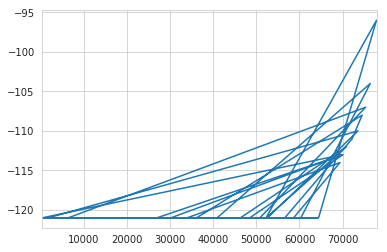

In [0]:
df_linear = df0["'BS 17'"].sample(100).plot()

In [0]:
# Cubic Interpolation

In [0]:
df1 = random_subset17.interpolate(method ='cubic', limit_direction ='backward')

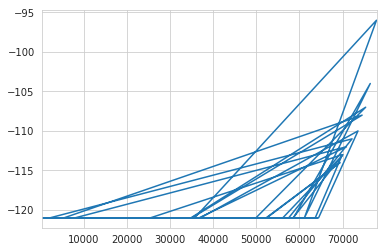

In [0]:
df_cubic = df1["'BS 17'"].plot()

In [0]:
# Quadratic Interpolation

In [0]:
df2 = random_subset17.interpolate(method ='quadratic', limit_direction ='backward')

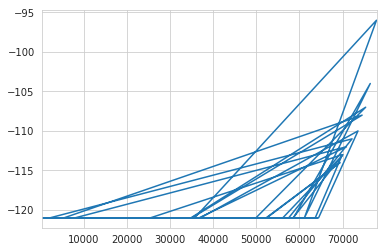

In [0]:
df_quadratic = df2
df2["'BS 17'"].plot()

In [0]:
import numpy as np; np.random.seed(0)
import seaborn as sns

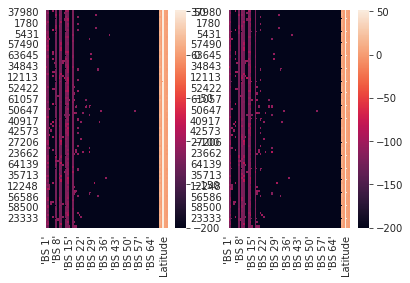

In [0]:
fig, ax =plt.subplots(1,2)

sns.heatmap(df0, ax=ax[0])
sns.heatmap(df1, ax=ax[1])

plt.show()

In [0]:
#Creating some data, with each coordinate and the values stored in separated lists
x = random_subset17.distance
y = random_subset17.distance
values = random_subset1["'BS 17'"]

In [0]:
random_subset17.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
hm = random_subset17.pivot("Latitude", "Longitude", "'BS 17'")
hm.head()

Longitude,4.325745106,4.389193535,4.391306877,4.391356468,4.391674995,4.392139912,4.396860123,4.396921635,4.400434971,4.400501728,4.400846481,4.401565075,4.402050018,4.402153492,4.402935028,4.4029831889999995,4.403221607,4.40370512,4.404150008999999,4.404246807,4.4042849539999995,4.404335022,4.404573441,4.404631615,4.4050316810000005,4.4051084519999995,4.40531683,4.405461788,4.405518532,4.405733109,4.405741692,4.405894756,4.407579899,4.407763481,4.407885075,4.408150196,4.40817833,4.408288478999999,4.409073353,4.409863472,...,4.416965008,4.417180061,4.417243481,4.417918205,4.418011665,4.418019772,4.418115139,4.418181896,4.418248177,4.418468475,4.418485165,4.41849184,4.418499947,4.418533325,4.418594837,4.418596745,4.418598175,4.418663502,4.420159817,4.420961857,4.421128273,4.421596527,4.421676636,4.422298431000001,4.422401428,4.423756599,4.424715042,4.425528526,4.425933361,4.42805481,4.428323269,4.430636883,4.439518452,4.439971447,4.4401583669999996,4.441063403999999,4.443111897,4.446746826,4.448148251,4.449716568
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.194145,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-121.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194218,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-121.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194252,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-121.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194260,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-121.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194263,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-121.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
hm_df = hm.interpolate(method ='linear', limit_direction ='both')

In [0]:
hm_df.head()

Longitude,4.325745106,4.389193535,4.391306877,4.391356468,4.391674995,4.392139912,4.396860123,4.396921635,4.400434971,4.400501728,4.400846481,4.401565075,4.402050018,4.402153492,4.402935028,4.4029831889999995,4.403221607,4.40370512,4.404150008999999,4.404246807,4.4042849539999995,4.404335022,4.404573441,4.404631615,4.4050316810000005,4.4051084519999995,4.40531683,4.405461788,4.405518532,4.405733109,4.405741692,4.405894756,4.407579899,4.407763481,4.407885075,4.408150196,4.40817833,4.408288478999999,4.409073353,4.409863472,...,4.416965008,4.417180061,4.417243481,4.417918205,4.418011665,4.418019772,4.418115139,4.418181896,4.418248177,4.418468475,4.418485165,4.41849184,4.418499947,4.418533325,4.418594837,4.418596745,4.418598175,4.418663502,4.420159817,4.420961857,4.421128273,4.421596527,4.421676636,4.422298431000001,4.422401428,4.423756599,4.424715042,4.425528526,4.425933361,4.42805481,4.428323269,4.430636883,4.439518452,4.439971447,4.4401583669999996,4.441063403999999,4.443111897,4.446746826,4.448148251,4.449716568
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.194145,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-114.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-111.0,...,-121.0,-121.0,-121.0,-107.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-96.0,-121.0,-121.0,-121.0,-108.0,-121.0,-121.0,-110.0,-121.0,-113.0,-121.0,-104.0,-121.0,-121.0,-121.0,-121.0
51.194218,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-114.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-111.0,...,-121.0,-121.0,-121.0,-107.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-96.0,-121.0,-121.0,-121.0,-108.0,-121.0,-121.0,-110.0,-121.0,-113.0,-121.0,-104.0,-121.0,-121.0,-121.0,-121.0
51.194252,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-114.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-111.0,...,-121.0,-121.0,-121.0,-107.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-96.0,-121.0,-121.0,-121.0,-108.0,-121.0,-121.0,-110.0,-121.0,-113.0,-121.0,-104.0,-121.0,-121.0,-121.0,-121.0
51.194260,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-114.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-111.0,...,-121.0,-121.0,-121.0,-107.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-96.0,-121.0,-121.0,-121.0,-108.0,-121.0,-121.0,-110.0,-121.0,-113.0,-121.0,-104.0,-121.0,-121.0,-121.0,-121.0
51.194263,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-114.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-111.0,...,-121.0,-121.0,-121.0,-107.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-121.0,-96.0,-121.0,-121.0,-121.0,-108.0,-121.0,-121.0,-110.0,-121.0,-113.0,-121.0,-104.0,-121.0,-121.0,-121.0,-121.0


In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

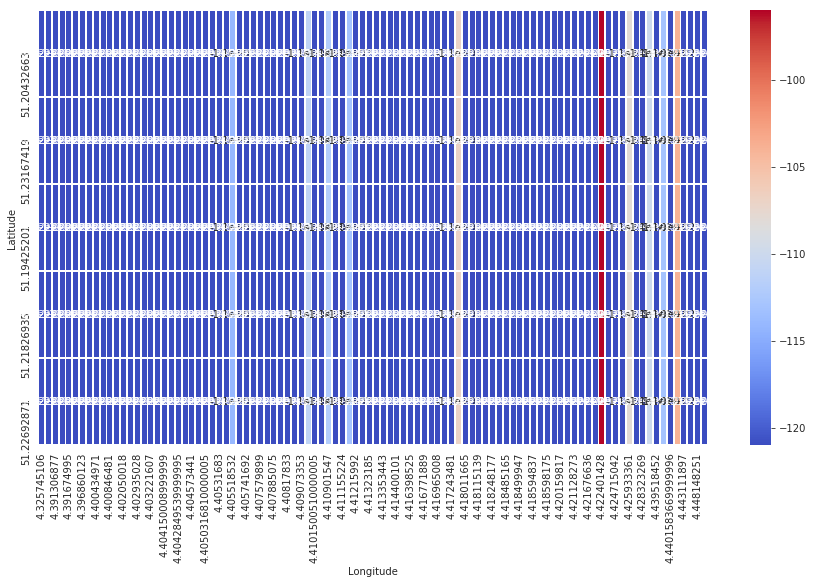

In [0]:
plt.figure(figsize=(15,8))
sns.heatmap(hm_df.sample(5), annot=True, linewidth = 0.9, cmap='coolwarm')

### AutoEncoder Imputation

In [0]:
from numpy import nan
from sklearn.preprocessing import Imputer

In [0]:
traincols = train_df.columns.tolist() 
traincols.remove('Latitude')
traincols.remove('Longitude')
traincols.remove('distance')
len(traincols)

70

In [0]:
columns_X = traincols
x = train_df[columns_X]

In [0]:
columns_y = ['Latitude','Longitude']
y = train_df[columns_y]

In [0]:
imp = Imputer(strategy='mean')
X2 = imp.fit_transform(train_df)
X2

array([[-102.        , -125.        , -200.        , ...,   51.20729828,
           4.43949652,    2.90717352],
       [-119.        , -125.        , -200.        , ...,   51.20476151,
           4.4401269 ,    3.08528579],
       [-119.        ,  -94.        , -200.        , ...,   51.20353317,
           4.43734837,    3.00089336],
       ...,
       [-119.        , -125.        , -200.        , ...,   51.22568893,
           4.40938663,    0.8479537 ],
       [-119.        , -125.        , -200.        , ...,   51.22273254,
           4.40217352,    0.37125845],
       [-119.        , -125.        , -200.        , ...,   51.22283936,
           4.40506983,    0.42224464]])

In [0]:
model = LinearRegression().fit(X2, y)
model.predict(X2)

array([[51.20729828,  4.43949652],
       [51.20476151,  4.4401269 ],
       [51.20353317,  4.43734837],
       ...,
       [51.22568893,  4.40938663],
       [51.22273254,  4.40217352],
       [51.22283936,  4.40506983]])

In [0]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures

model = make_pipeline(Imputer(strategy='mean'),
                      PolynomialFeatures(degree=2),
                      LinearRegression())

In [0]:
def make_reconstruction_loss(n_features):

    def reconstruction_loss(input_and_mask, y_pred):
        X_values = input_and_mask[:, :n_features]
        X_values.name = "$X_values"

        missing_mask = input_and_mask[:, n_features:]
        missing_mask.name = "$missing_mask"
        observed_mask = 1 - missing_mask
        observed_mask.name = "$observed_mask"

        X_values_observed = X_values * observed_mask
        X_values_observed.name = "$X_values_observed"

        pred_observed = y_pred * observed_mask
        pred_observed.name = "$y_pred_observed"

        return mse(y_true=X_values_observed, y_pred=pred_observed)
    return reconstruction_loss
  
def masked_mae(X_true, X_pred, mask):
    masked_diff = X_true[mask] - X_pred[mask]
    return np.mean(np.abs(masked_diff))

In [0]:
import random
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
from keras.utils import np_utils
from sklearn.preprocessing import LabelEncoder

from keras.objectives import mse
from keras.models import Sequential
from keras.layers.core import Dropout, Dense

from keras.regularizers import L1L2

from collections import defaultdict

%matplotlib inline

In [0]:
class Autoencoder:

    def __init__(self, data,
                 recurrent_weight=0.5,
                 optimizer="adam",
                 dropout_probability=0.5,
                 hidden_activation="relu",
                 output_activation="sigmoid",
                 init="glorot_normal",
                 L1_penalty=0,
                 L2_penalty=0):
        self.data = data.copy()
        self.recurrent_weight = recurrent_weight
        self.optimizer = optimizer
        self.dropout_probability = dropout_probability
        self.hidden_activation = hidden_activation
        self.output_activation = output_activation
        self.init = init
        self.L1_penalty = L1_penalty
        self.L2_penalty = L2_penalty

    def _get_hidden_layer_sizes(self):
        n_dims = self.data.shape[1]
        return [
            min(2000, 8 * n_dims),
            min(500, 2 * n_dims),
            int(np.ceil(0.5 * n_dims)),
        ]

    def _create_model(self):

        hidden_layer_sizes = self._get_hidden_layer_sizes()
        first_layer_size = hidden_layer_sizes[0]
        n_dims = self.data.shape[1]

        model = Sequential()

        model.add(Dense(
            first_layer_size,
            input_dim= 2 * n_dims,
            activation=self.hidden_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))
        model.add(Dropout(self.dropout_probability))

        for layer_size in hidden_layer_sizes[1:]:
            model.add(Dense(
                layer_size,
                activation=self.hidden_activation,
                W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
                init=self.init))
            model.add(Dropout(self.dropout_probability))

        model.add(Dense(
            n_dims,
            activation=self.output_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))

        loss_function = make_reconstruction_loss(n_dims)

        model.compile(optimizer=self.optimizer, loss=loss_function)
        return model

    def fill(self, missing_mask):
        self.data[missing_mask] = -1

    def _create_missing_mask(self):
        if self.data.dtype != "f" and self.data.dtype != "d":
            self.data = self.data.astype(float)

        return np.isnan(self.data)

    def _train_epoch(self, model, missing_mask, batch_size):
        input_with_mask = np.hstack([self.data, missing_mask])
        n_samples = len(input_with_mask)
        n_batches = int(np.ceil(n_samples / batch_size))
        indices = np.arange(n_samples)
        np.random.shuffle(indices)
        X_shuffled = input_with_mask[indices]

        for batch_idx in range(n_batches):
            batch_start = batch_idx * batch_size
            batch_end = (batch_idx + 1) * batch_size
            batch_data = X_shuffled[batch_start:batch_end, :]
            model.train_on_batch(batch_data, batch_data)
        return model.predict(input_with_mask)

    def train(self, batch_size=256, train_epochs=100):
        missing_mask = self._create_missing_mask()
        self.fill(missing_mask)
        self.model = self._create_model()

        observed_mask = ~missing_mask

        for epoch in range(train_epochs):
            X_pred = self._train_epoch(self.model, missing_mask, batch_size)
            observed_mae = masked_mae(X_true=self.data,
                                    X_pred=X_pred,
                                    mask=observed_mask)
            if epoch % 50 == 0:
                print("observed mae:", observed_mae)

            old_weight = (1.0 - self.recurrent_weight)
            self.data[missing_mask] *= old_weight
            pred_missing = X_pred[missing_mask]
            self.data[missing_mask] += self.recurrent_weight * pred_missing
        return self.data.copy()

In [0]:
train_df["'BS 17'"] = pd.to_numeric(train_df["'BS 17'"], errors='coerce')

In [0]:
train_df3 = train_df.dropna(subset=["'BS 17'"])


In [0]:
train_df3["'BS 17'"] = train_df3["'BS 17'"].astype(int)

In [0]:
missing_encoded = pd.get_dummies(train_df)

for col in train_df.columns:
    missing_cols = missing_encoded.columns.str.startswith(str(col) + "_")
    missing_encoded.loc[train_df[col].isnull(), missing_cols] = np.nan

In [0]:
missing_encoded.values

array([[-102.        , -125.        , -200.        , ...,   51.20729828,
           4.43949652,    2.90717352],
       [-119.        , -125.        , -200.        , ...,   51.20476151,
           4.4401269 ,    3.08528579],
       [-119.        ,  -94.        , -200.        , ...,   51.20353317,
           4.43734837,    3.00089336],
       ...,
       [-119.        , -125.        , -200.        , ...,   51.22568893,
           4.40938663,    0.8479537 ],
       [-119.        , -125.        , -200.        , ...,   51.22273254,
           4.40217352,    0.37125845],
       [-119.        , -125.        , -200.        , ...,   51.22283936,
           4.40506983,    0.42224464]])

In [0]:
#pip install autoencoder-impute

In [0]:
model.fit(x, y)  # X with missing values, from above
print(model.predict(x))

[[51.20287418  4.44999123]
 [51.2084856   4.44750404]
 [51.20460606  4.4543705 ]
 ...
 [51.22898197  4.41217995]
 [51.21987152  4.40786171]
 [51.22311497  4.40715981]]


In [0]:
random_subset1.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
5318,-119.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-99,-200,-96,-200,-200,-200,-200,-200,-102,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.94,51.221203,4.406768,0.358544
24217,-119.0,-200,-200,-99,-200,-200,-200,-200,-200,-200,-200,-200,-93,-100,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.69,51.230610,4.412425,1.425276
74645,-106.0,-106,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.82,51.206573,4.419005,1.831907
1044,-119.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-117,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.58,51.225979,4.400267,0.747886
39684,-119.0,-112,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-108,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.65,51.194927,4.400728,2.724047


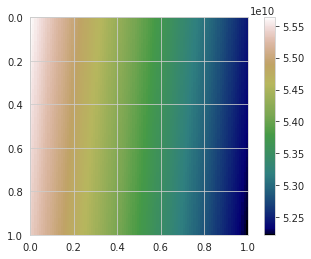

In [0]:
# Radial Basis Function(Normalizing it)
import numpy as np
import scipy.interpolate
import matplotlib.pyplot as plt
np.random.seed(2000)

x = random_subset17.Latitude
y = random_subset17.Longitude
z = random_subset17["'BS 17'"]

interp = scipy.interpolate.Rbf(x, y, z, function='cubic')

yi, xi = np.mgrid[0:1:100j, 0:1:100j]

zi = interp(xi, yi)

plt.plot(x, y, 'ko')
plt.imshow(zi, extent=[0, 1, 1, 0], cmap='gist_earth')
plt.colorbar()

plt.show()

In [0]:
import pandas as pd 
import folium
from folium.plugins import HeatMap

# Fingerprinting linear
max_amount = float(random_subset17["'BS 17'"].max())

hmap = folium.Map(location=[51.2, 4.42], zoom_start=12, width=500,height=500)

hm_wide = HeatMap( list(zip(random_subset17.Latitude.values, random_subset17.Longitude.values, random_subset17["'BS 17'"].values)),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=20, blur=15, 
                   max_zoom=1, 
                 )

hmap.add_child(hm_wide)

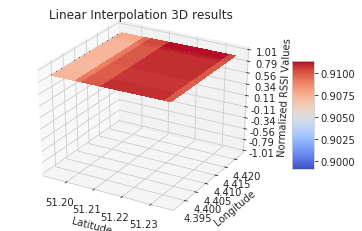

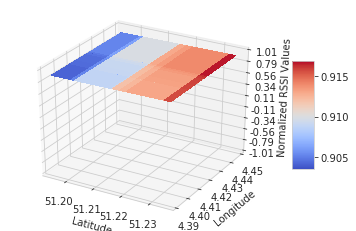

In [0]:
# This import registers the 3D projection, but is otherwise unused.
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt


fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df0.sample(20).Latitude
y = df0.sample(20).Longitude
z = random_subset17["'BS 1'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Linear Interpolation 3D results')

ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df1.sample(20).Latitude
y = df1.sample(20).Longitude
z = random_subset17["'BS 17'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

In [0]:
random_subset17.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
23333,-119.0,-125.0,-200,-200,-104,-200,-125.0,-200,-119.0,-125.0,-113,-200,-120.0,-121.0,-200,-200,-121.0,-200,-200,-200,-200,-112,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.61,51.234066,4.403222,1.631560
12912,-98.0,-125.0,-200,-200,-200,-200,-115.0,-109,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.74,51.206482,4.449717,3.588894
52557,-119.0,-108.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-99.0,-200,-200,-121.0,-110,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.95,51.205059,4.416965,1.886294
5714,-113.0,-102.0,-200,-200,-200,-200,-125.0,-200,-119.0,-90.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.57,51.194447,4.418485,2.989824
23116,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-112,-200,-121.0,-110,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.76,51.209435,4.391307,1.354898


## Fingerprinting Maps for Base Station-18

In [0]:
train_df17.isnull().sum().sum()

0

In [0]:
test_data.isnull().sum().sum()

0

In [0]:
len(train_df17.Latitude.unique())

10753

In [0]:
len(test_data.Latitude.unique())

9112

In [0]:
len(train_df17.Longitude.unique())

26882

In [0]:
len(test_data.Longitude.unique())

16627

In [0]:
train_sort_data = train_df17.sort_values("'BS 18'")

In [0]:
test_sort_data = test_data.sort_values("'BS 18'")

In [0]:
train_sort_data.loc[train_sort_data["'BS 18'"] == -200].shape

(67389, 73)

In [0]:
#train_sort_data1 = train_sort_data.iloc[69000:, :]

In [0]:
train_sort_data.shape

(78297, 73)

In [0]:
test_sort_data.shape

(33013, 72)

In [0]:
train_sort_data2 = train_sort_data.reset_index(drop=True)

In [0]:
test_sort_data2 = test_sort_data.reset_index(drop=True)

In [0]:
train_sort_data2.shape

(78297, 73)

In [0]:
test_sort_data2.shape

(33013, 72)

In [0]:
train_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
test_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
train_filtered_data = train_sort_data2.reset_index(drop=True)

In [0]:
test_filtered_data = test_sort_data2.reset_index(drop=True)

In [0]:
#train_filtered_data = train_sort_data2.iloc[970:1000,:]

In [0]:
train_filtered_data.groupby("'BS 18'").size()

'BS 18'
-200    67389
-120        8
-118       59
-117       79
-116      314
-115     1225
-114      915
-113      641
-112      528
-111      446
-110      438
-109      407
-108      396
-107      424
-106      413
-105      440
-104      396
-103      369
-102      315
-101      300
-100      265
-99       218
-98       226
-97       188
-96       208
-95       163
-94       195
-93       171
-92       127
-91       142
-90       123
-89        94
-88       102
-87        63
-86        86
-85        53
-84        57
-83        63
-82        28
-81        40
-80        28
-79        19
-78        33
-77        12
-76        21
-75        14
-74        12
-73         7
-72         6
-71         3
-70         8
-69         3
-68         5
-67         1
-64         6
-63         2
-62         1
-61         1
-58         1
dtype: int64

In [0]:
# Replacing values with Nan outside range of (-150,150)
train_filtered_data["'BS 18'"]=train_filtered_data["'BS 18'"].where(train_filtered_data["'BS 18'"].between(-150,150))

In [0]:
#train_data["'BS 2'"]=train_data["'BS 2'"].where(train_data["'BS 2'"].between(-150,150))

In [0]:
train_filtered_data.shape

(78297, 73)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_filtered_data['distance'] = train_filtered_data.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_sort_data2['distance'] = train_sort_data2.apply(lambda row: haversine(row), axis=1)

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-102.0,-125.0,-200,-200,-200,-200,-106.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-65.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.78,51.207298,4.439497,2.907174
1,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-114.0,-125.0,-200,-200,-120.0,-102.0,-200,-200,-121.0,NaN,-116,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.75,51.218586,4.408154,0.404019
2,-119.0,-125.0,-200,-200,-92,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-102.0,-200,-200,-121.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-102,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.64,51.229671,4.401857,1.143014
3,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-112.0,-125.0,-200,-200,-95.0,-102.0,-200,-200,-121.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.76,51.227058,4.405955,0.884911
4,-119.0,-125.0,-200,-200,-102,-200,-125.0,-200,-119.0,-125.0,-200,-200,-95.0,-102.0,-200,-200,-121.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,2.97,51.231243,4.405149,1.329748


In [0]:
train_filtered_data.isnull().sum().sum()

67389

In [0]:
len(train_filtered_data.Latitude.unique())

10753

In [0]:
len(train_filtered_data.Longitude.unique())

26882

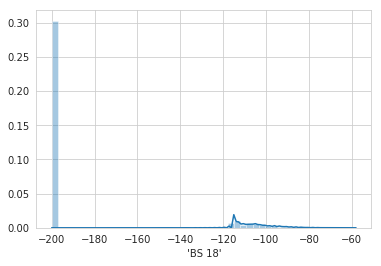

In [0]:
sns.distplot(train_sort_data2["'BS 18'"])

70% values from BS-1 have been made NaN as it is out of range. We will try to predict it using interpolation.

### Plotting Fingerprinting Heatmap for BS-1 training data

In [0]:
# Line 2.
extent = x_extent = x_min, x_max, y_min, y_max = [train_sort_data2.Latitude.min()-50, train_sort_data2.Latitude.max()+50,
                                                  train_sort_data2.Longitude.min()-10, train_sort_data2.Longitude.max()+10]

In [0]:
extent

[1.1861686700000007, 101.23601913, -5.674818516, 14.45976162]

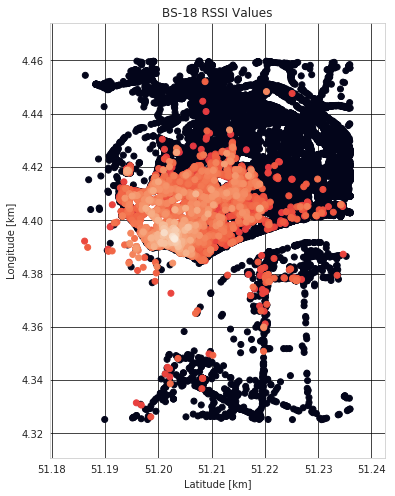

In [0]:
fig, ax = plt.subplots(figsize=(15,8))

ax.scatter(train_sort_data2.Latitude, train_sort_data2.Longitude, c=train_sort_data2["'BS 18'"])
ax.set_aspect(.5)
#ax.set_xlim(*extent[:])
#ax.set_ylim(*extent[:])
ax.set_xlabel('Latitude [km]')
ax.set_ylabel('Longitude [km]')
ax.set_title('BS-18 RSSI Values')
ax.grid(c='k', alpha=0.9)

plt.show()

### Interpolation Techniques

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-102.0,-125.0,-200,-200,-200,-200,-106.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-65.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.78,51.207298,4.439497,2.907174
1,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-114.0,-125.0,-200,-200,-120.0,-102.0,-200,-200,-121.0,NaN,-116,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.75,51.218586,4.408154,0.404019
2,-119.0,-125.0,-200,-200,-92,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-102.0,-200,-200,-121.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-102,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.64,51.229671,4.401857,1.143014
3,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-112.0,-125.0,-200,-200,-95.0,-102.0,-200,-200,-121.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.76,51.227058,4.405955,0.884911
4,-119.0,-125.0,-200,-200,-102,-200,-125.0,-200,-119.0,-125.0,-200,-200,-95.0,-102.0,-200,-200,-121.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,2.97,51.231243,4.405149,1.329748


In [0]:
train_filtered_data = train_filtered_data.reset_index(drop=True)

In [0]:
train_df = train_filtered_data.sort_values(by="'BS 18'", ascending=False)

### Linear *Interpolation*

In [0]:
train_df.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
67384,-119.0,-103.0,-200,-200,-200,-200,-125.0,-200,-93.0,-125.0,-200,-109,-120.0,-121.0,-200,-200,-121.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.73,51.218834,4.431674,2.032801
67385,-119.0,-125.0,-200,-200,-96,-113,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-112,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.70,51.230755,4.402966,1.263020
67386,-119.0,-125.0,-200,-200,-200,-200,-119.0,-100,-95.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.64,51.213570,4.457487,3.884316
67387,-119.0,-125.0,-200,-102,-103,-200,-125.0,-200,-119.0,-125.0,-106,-200,-120.0,-121.0,-200,-200,-121.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.66,51.235489,4.421097,2.208497
67388,-107.0,-104.0,-107,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.70,51.203403,4.425567,2.397003


In [0]:
train_df18 = train_df.interpolate(method ='linear', limit_direction ='forward')

In [0]:
train_df18.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
67384,-119.0,-103.0,-200,-200,-200,-200,-125.0,-200,-93.0,-125.0,-200,-109,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.73,51.218834,4.431674,2.032801
67385,-119.0,-125.0,-200,-200,-96,-113,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-112,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.70,51.230755,4.402966,1.263020
67386,-119.0,-125.0,-200,-200,-200,-200,-119.0,-100,-95.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.64,51.213570,4.457487,3.884316
67387,-119.0,-125.0,-200,-102,-103,-200,-125.0,-200,-119.0,-125.0,-106,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.66,51.235489,4.421097,2.208497
67388,-107.0,-104.0,-107,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.70,51.203403,4.425567,2.397003


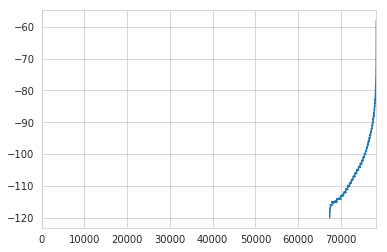

In [0]:
train_df["'BS 18'"].plot()

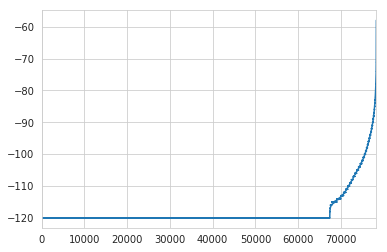

In [0]:
df_linear = train_df18["'BS 18'"].plot()

### Linear, Cubic, Quadratic *Interpolation*

In [0]:
from scipy.interpolate.rbf import Rbf  # radial basis functions
from urllib.request import urlopen
 
import matplotlib.pyplot as plt
import numpy as np

In [0]:
random_subset18 = train_df18.sample(n=100, replace=True)

In [0]:
random_subset18.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
39502,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-114.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-114.0,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.70,51.214798,4.415682,1.051084
15619,-119.0,-109.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-111,-200,-121.0,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.86,51.225849,4.377573,1.878196
17162,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-95,-200,-109.0,-121.0,-200,-200,-121.0,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.86,51.235077,4.425948,2.388454
35450,-119.0,-125.0,-200,-200,-102,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-97.0,-200,-200,-121.0,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-105,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.67,51.227764,4.401888,0.931024
46399,-103.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-105.0,-200,-200,-109.0,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.72,51.207314,4.419328,1.783308


In [0]:
# Linear Interpolation

In [0]:
df0 = random_subset18.interpolate(method ='linear', limit_direction ='backward')

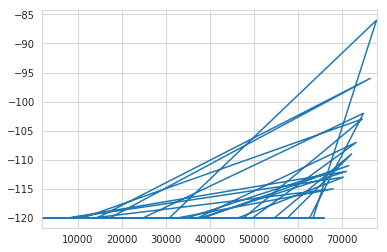

In [0]:
df_linear = df0["'BS 18'"].sample(100).plot()

In [0]:
# Cubic Interpolation

In [0]:
df1 = random_subset18.interpolate(method ='cubic', limit_direction ='backward')

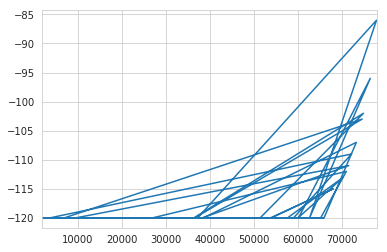

In [0]:
df_cubic = df1["'BS 18'"].plot()

In [0]:
# Quadratic Interpolation

In [0]:
df2 = random_subset18.interpolate(method ='quadratic', limit_direction ='backward')

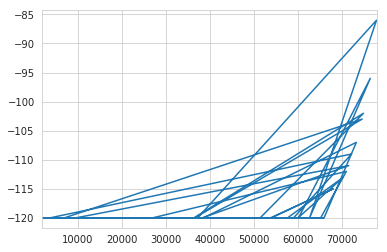

In [0]:
df_quadratic = df2
df2["'BS 18'"].plot()

In [0]:
import numpy as np; np.random.seed(0)
import seaborn as sns

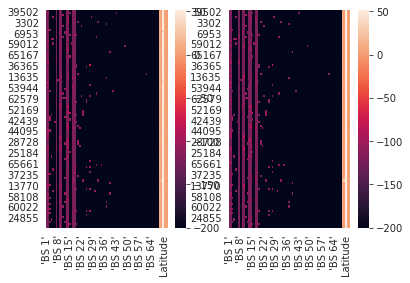

In [0]:
fig, ax =plt.subplots(1,2)

sns.heatmap(df0, ax=ax[0])
sns.heatmap(df1, ax=ax[1])

plt.show()

In [0]:
#Creating some data, with each coordinate and the values stored in separated lists
x = random_subset18.distance
y = random_subset18.distance
values = random_subset18["'BS 18'"]

In [0]:
random_subset18.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
hm = random_subset18.pivot("Latitude", "Longitude", "'BS 18'")
hm.head()

Longitude,4.3383364680000005,4.346188545,4.37757349,4.3815851210000005,4.387988567,4.389173508,4.390383244,4.390543461,4.3912134169999995,4.393599987,4.393773556,4.396005154,4.397061825,4.397395134,4.400196552,4.401888371,4.403550148,4.404349804,4.404391766,4.404573441,4.405115128,4.405214787,4.405226708,4.405263424,4.405956745,4.406601429,4.40702486,4.4081583019999995,4.4084234239999995,4.409171581,4.409220219,4.410399914,4.411053181000001,4.411751747,4.412004948,4.41231823,4.412978172,4.413173199,4.413448334,4.413963318,...,4.418545246,4.418546677,4.418548584,4.418633461000001,4.418651581000001,4.41877985,4.418885231,4.419033527,4.419198513,4.419328213,4.419638157,4.419908523999999,4.420061588,4.420479775,4.421175003,4.421188355,4.422661781,4.423276901,4.423541546,4.4236416819999995,4.423709869,4.423715115,4.42373991,4.424520016000001,4.425310135,4.425409794,4.425433159,4.425461769,4.4257817269999995,4.4257998469999995,4.425948143,4.426281452,4.427366734,4.4286265369999995,4.4295101169999995,4.430248261,4.439611435,4.444583416,4.451331616,4.455550194
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.194225,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194233,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194237,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,-120.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194244,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-120.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194275,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
hm_df = hm.interpolate(method ='linear', limit_direction ='both')

In [0]:
hm_df.head()

Longitude,4.3383364680000005,4.346188545,4.37757349,4.3815851210000005,4.387988567,4.389173508,4.390383244,4.390543461,4.3912134169999995,4.393599987,4.393773556,4.396005154,4.397061825,4.397395134,4.400196552,4.401888371,4.403550148,4.404349804,4.404391766,4.404573441,4.405115128,4.405214787,4.405226708,4.405263424,4.405956745,4.406601429,4.40702486,4.4081583019999995,4.4084234239999995,4.409171581,4.409220219,4.410399914,4.411053181000001,4.411751747,4.412004948,4.41231823,4.412978172,4.413173199,4.413448334,4.413963318,...,4.418545246,4.418546677,4.418548584,4.418633461000001,4.418651581000001,4.41877985,4.418885231,4.419033527,4.419198513,4.419328213,4.419638157,4.419908523999999,4.420061588,4.420479775,4.421175003,4.421188355,4.422661781,4.423276901,4.423541546,4.4236416819999995,4.423709869,4.423715115,4.42373991,4.424520016000001,4.425310135,4.425409794,4.425433159,4.425461769,4.4257817269999995,4.4257998469999995,4.425948143,4.426281452,4.427366734,4.4286265369999995,4.4295101169999995,4.430248261,4.439611435,4.444583416,4.451331616,4.455550194
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.194225,-120.0,-120.0,-120.0,-120.0,-103.0,-111.0,-102.0,-120.0,-120.0,-86.0,-120.0,-120.0,-96.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-113.0,-120.0,-120.0,-109.0,-120.0,-107.0,-112.0,-115.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,...,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0
51.194233,-120.0,-120.0,-120.0,-120.0,-103.0,-111.0,-102.0,-120.0,-120.0,-86.0,-120.0,-120.0,-96.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-113.0,-120.0,-120.0,-109.0,-120.0,-107.0,-112.0,-115.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,...,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0
51.194237,-120.0,-120.0,-120.0,-120.0,-103.0,-111.0,-102.0,-120.0,-120.0,-86.0,-120.0,-120.0,-96.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-113.0,-120.0,-120.0,-109.0,-120.0,-107.0,-112.0,-115.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,...,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0
51.194244,-120.0,-120.0,-120.0,-120.0,-103.0,-111.0,-102.0,-120.0,-120.0,-86.0,-120.0,-120.0,-96.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-113.0,-120.0,-120.0,-109.0,-120.0,-107.0,-112.0,-115.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,...,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0
51.194275,-120.0,-120.0,-120.0,-120.0,-103.0,-111.0,-102.0,-120.0,-120.0,-86.0,-120.0,-120.0,-96.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-113.0,-120.0,-120.0,-109.0,-120.0,-107.0,-112.0,-115.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,...,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-1

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

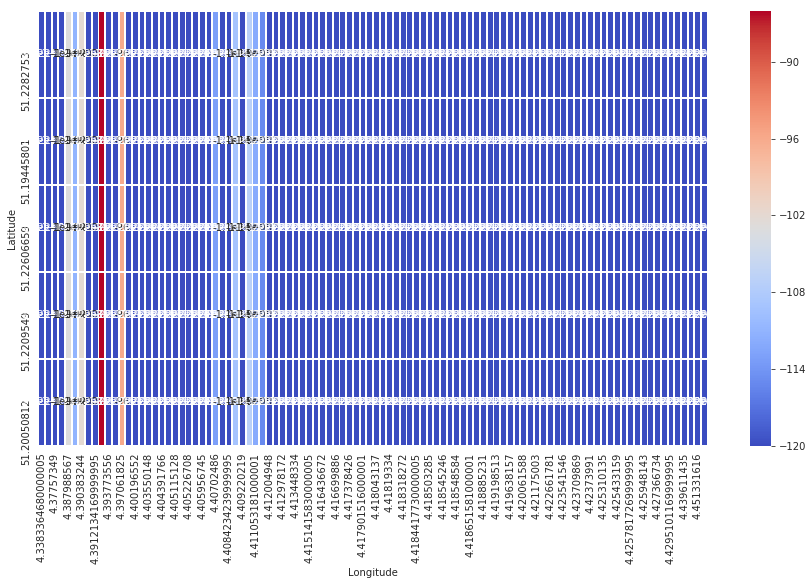

In [0]:
plt.figure(figsize=(15,8))
sns.heatmap(hm_df.sample(5), annot=True, linewidth = 0.9, cmap='coolwarm')

### AutoEncoder Imputation

In [0]:
from numpy import nan
from sklearn.preprocessing import Imputer

In [0]:
traincols = train_df.columns.tolist() 
traincols.remove('Latitude')
traincols.remove('Longitude')
traincols.remove('distance')
len(traincols)

70

In [0]:
columns_X = traincols
x = train_df[columns_X]

In [0]:
columns_y = ['Latitude','Longitude']
y = train_df[columns_y]

In [0]:
imp = Imputer(strategy='mean')
X2 = imp.fit_transform(train_df)
X2

array([[-119.        , -125.        , -200.        , ...,   51.20305634,
           4.39309168,    1.93189056],
       [-119.        , -119.        , -200.        , ...,   51.20285416,
           4.39348316,    1.94407319],
       [-119.        , -125.        , -200.        , ...,   51.20299149,
           4.3932066 ,    1.93598426],
       ...,
       [-119.        , -125.        , -200.        , ...,   51.21356964,
           4.45748663,    3.88431575],
       [-119.        , -125.        , -200.        , ...,   51.23548889,
           4.4210968 ,    2.20849746],
       [-107.        , -104.        , -107.        , ...,   51.20340347,
           4.42556667,    2.39700259]])

In [0]:
model = LinearRegression().fit(X2, y)
model.predict(X2)

array([[51.20305634,  4.39309168],
       [51.20285416,  4.39348316],
       [51.20299149,  4.3932066 ],
       ...,
       [51.21356964,  4.45748663],
       [51.23548889,  4.4210968 ],
       [51.20340347,  4.42556667]])

In [0]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures

model = make_pipeline(Imputer(strategy='mean'),
                      PolynomialFeatures(degree=2),
                      LinearRegression())

In [0]:
def make_reconstruction_loss(n_features):

    def reconstruction_loss(input_and_mask, y_pred):
        X_values = input_and_mask[:, :n_features]
        X_values.name = "$X_values"

        missing_mask = input_and_mask[:, n_features:]
        missing_mask.name = "$missing_mask"
        observed_mask = 1 - missing_mask
        observed_mask.name = "$observed_mask"

        X_values_observed = X_values * observed_mask
        X_values_observed.name = "$X_values_observed"

        pred_observed = y_pred * observed_mask
        pred_observed.name = "$y_pred_observed"

        return mse(y_true=X_values_observed, y_pred=pred_observed)
    return reconstruction_loss
  
def masked_mae(X_true, X_pred, mask):
    masked_diff = X_true[mask] - X_pred[mask]
    return np.mean(np.abs(masked_diff))

In [0]:
import random
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
from keras.utils import np_utils
from sklearn.preprocessing import LabelEncoder

from keras.objectives import mse
from keras.models import Sequential
from keras.layers.core import Dropout, Dense

from keras.regularizers import L1L2

from collections import defaultdict

%matplotlib inline

In [0]:
class Autoencoder:

    def __init__(self, data,
                 recurrent_weight=0.5,
                 optimizer="adam",
                 dropout_probability=0.5,
                 hidden_activation="relu",
                 output_activation="sigmoid",
                 init="glorot_normal",
                 L1_penalty=0,
                 L2_penalty=0):
        self.data = data.copy()
        self.recurrent_weight = recurrent_weight
        self.optimizer = optimizer
        self.dropout_probability = dropout_probability
        self.hidden_activation = hidden_activation
        self.output_activation = output_activation
        self.init = init
        self.L1_penalty = L1_penalty
        self.L2_penalty = L2_penalty

    def _get_hidden_layer_sizes(self):
        n_dims = self.data.shape[1]
        return [
            min(2000, 8 * n_dims),
            min(500, 2 * n_dims),
            int(np.ceil(0.5 * n_dims)),
        ]

    def _create_model(self):

        hidden_layer_sizes = self._get_hidden_layer_sizes()
        first_layer_size = hidden_layer_sizes[0]
        n_dims = self.data.shape[1]

        model = Sequential()

        model.add(Dense(
            first_layer_size,
            input_dim= 2 * n_dims,
            activation=self.hidden_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))
        model.add(Dropout(self.dropout_probability))

        for layer_size in hidden_layer_sizes[1:]:
            model.add(Dense(
                layer_size,
                activation=self.hidden_activation,
                W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
                init=self.init))
            model.add(Dropout(self.dropout_probability))

        model.add(Dense(
            n_dims,
            activation=self.output_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))

        loss_function = make_reconstruction_loss(n_dims)

        model.compile(optimizer=self.optimizer, loss=loss_function)
        return model

    def fill(self, missing_mask):
        self.data[missing_mask] = -1

    def _create_missing_mask(self):
        if self.data.dtype != "f" and self.data.dtype != "d":
            self.data = self.data.astype(float)

        return np.isnan(self.data)

    def _train_epoch(self, model, missing_mask, batch_size):
        input_with_mask = np.hstack([self.data, missing_mask])
        n_samples = len(input_with_mask)
        n_batches = int(np.ceil(n_samples / batch_size))
        indices = np.arange(n_samples)
        np.random.shuffle(indices)
        X_shuffled = input_with_mask[indices]

        for batch_idx in range(n_batches):
            batch_start = batch_idx * batch_size
            batch_end = (batch_idx + 1) * batch_size
            batch_data = X_shuffled[batch_start:batch_end, :]
            model.train_on_batch(batch_data, batch_data)
        return model.predict(input_with_mask)

    def train(self, batch_size=256, train_epochs=100):
        missing_mask = self._create_missing_mask()
        self.fill(missing_mask)
        self.model = self._create_model()

        observed_mask = ~missing_mask

        for epoch in range(train_epochs):
            X_pred = self._train_epoch(self.model, missing_mask, batch_size)
            observed_mae = masked_mae(X_true=self.data,
                                    X_pred=X_pred,
                                    mask=observed_mask)
            if epoch % 50 == 0:
                print("observed mae:", observed_mae)

            old_weight = (1.0 - self.recurrent_weight)
            self.data[missing_mask] *= old_weight
            pred_missing = X_pred[missing_mask]
            self.data[missing_mask] += self.recurrent_weight * pred_missing
        return self.data.copy()

In [0]:
train_df["'BS 18'"] = pd.to_numeric(train_df["'BS 18'"], errors='coerce')

In [0]:
train_df3 = train_df.dropna(subset=["'BS 18'"])


In [0]:
train_df3["'BS 18'"] = train_df3["'BS 18'"].astype(int)

In [0]:
missing_encoded = pd.get_dummies(train_df)

for col in train_df.columns:
    missing_cols = missing_encoded.columns.str.startswith(str(col) + "_")
    missing_encoded.loc[train_df[col].isnull(), missing_cols] = np.nan

In [0]:
missing_encoded.values

array([[-119.        , -125.        , -200.        , ...,   51.20305634,
           4.39309168,    1.93189056],
       [-119.        , -119.        , -200.        , ...,   51.20285416,
           4.39348316,    1.94407319],
       [-119.        , -125.        , -200.        , ...,   51.20299149,
           4.3932066 ,    1.93598426],
       ...,
       [-119.        , -125.        , -200.        , ...,   51.21356964,
           4.45748663,    3.88431575],
       [-119.        , -125.        , -200.        , ...,   51.23548889,
           4.4210968 ,    2.20849746],
       [-107.        , -104.        , -107.        , ...,   51.20340347,
           4.42556667,    2.39700259]])

In [0]:
#pip install autoencoder-impute

In [0]:
model.fit(x, y)  # X with missing values, from above
print(model.predict(x))

[[51.19369507  4.37036133]
 [51.19675636  4.37689209]
 [51.20536232  4.39275455]
 ...
 [51.22091961  4.44455624]
 [51.23641109  4.41361046]
 [51.20094013  4.42151356]]


In [0]:
random_subset18.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
24855,-119.0,-125.0,-200,-200,-200,-200,-114.0,-200,-119.0,-125.0,-112,-200,-120.0,-110.0,-200,-200,-121.0,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.61,51.235893,4.426281,2.470973
14434,-119.0,-125.0,-200,-106,-200,-200,-125.0,-200,-109.0,-125.0,-200,-200,-101.0,-121.0,-200,-200,-121.0,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.89,51.233383,4.416700,1.842644
54079,-119.0,-125.0,-113,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-117,-120.0,-121.0,-200,-200,-111.0,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,1.21,51.213600,4.422662,1.545281
7236,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-108.0,-108,-200,-121.0,-120.0,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.65,51.209084,4.346189,4.086604
24638,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-106.0,-125.0,-200,-200,-106.0,-110.0,-200,-200,-121.0,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,1.05,51.233982,4.418545,1.969134


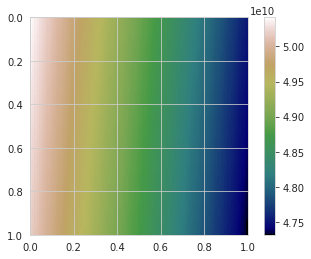

In [0]:
# Radial Basis Function(Normalizing it)
import numpy as np
import scipy.interpolate
import matplotlib.pyplot as plt
np.random.seed(2000)

x = random_subset18.Latitude
y = random_subset18.Longitude
z = random_subset18["'BS 18'"]

interp = scipy.interpolate.Rbf(x, y, z, function='cubic')

yi, xi = np.mgrid[0:1:100j, 0:1:100j]

zi = interp(xi, yi)

plt.plot(x, y, 'ko')
plt.imshow(zi, extent=[0, 1, 1, 0], cmap='gist_earth')
plt.colorbar()

plt.show()

In [0]:
import pandas as pd 
import folium
from folium.plugins import HeatMap

# Fingerprinting linear
max_amount = float(random_subset18["'BS 18'"].max())

hmap = folium.Map(location=[51.2, 4.42], zoom_start=12, width=500,height=500)

hm_wide = HeatMap( list(zip(random_subset18.Latitude.values, random_subset18.Longitude.values, random_subset18["'BS 18'"].values)),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=20, blur=15, 
                   max_zoom=1, 
                 )

hmap.add_child(hm_wide)

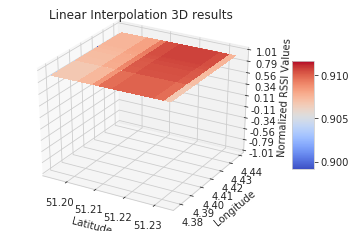

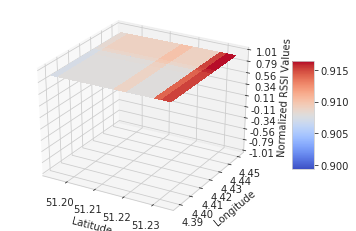

In [0]:
# This import registers the 3D projection, but is otherwise unused.
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt


fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df0.sample(20).Latitude
y = df0.sample(20).Longitude
z = random_subset18["'BS 1'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Linear Interpolation 3D results')

ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df1.sample(20).Latitude
y = df1.sample(20).Longitude
z = random_subset18["'BS 18'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

In [0]:
random_subset18.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
24855,-119.0,-125.0,-200,-200,-200,-200,-114.0,-200,-119.0,-125.0,-112,-200,-120.0,-110.0,-200,-200,-121.0,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.61,51.235893,4.426281,2.470973
14434,-119.0,-125.0,-200,-106,-200,-200,-125.0,-200,-109.0,-125.0,-200,-200,-101.0,-121.0,-200,-200,-121.0,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.89,51.233383,4.416700,1.842644
54079,-119.0,-125.0,-113,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-117,-120.0,-121.0,-200,-200,-111.0,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,1.21,51.213600,4.422662,1.545281
7236,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-108.0,-108,-200,-121.0,-120.0,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.65,51.209084,4.346189,4.086604
24638,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-106.0,-125.0,-200,-200,-106.0,-110.0,-200,-200,-121.0,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,1.05,51.233982,4.418545,1.969134


## Fingerprinting Maps for Base Station-20

In [0]:
train_df18.isnull().sum().sum()

0

In [0]:
test_data.isnull().sum().sum()

0

In [0]:
len(train_df18.Latitude.unique())

10753

In [0]:
len(test_data.Latitude.unique())

9112

In [0]:
len(train_df18.Longitude.unique())

26882

In [0]:
len(test_data.Longitude.unique())

16627

In [0]:
train_sort_data = train_df18.sort_values("'BS 20'")

In [0]:
test_sort_data = test_data.sort_values("'BS 20'")

In [0]:
train_sort_data.loc[train_sort_data["'BS 20'"] == -200].shape

(70870, 73)

In [0]:
#train_sort_data1 = train_sort_data.iloc[69000:, :]

In [0]:
train_sort_data.shape

(78297, 73)

In [0]:
test_sort_data.shape

(33013, 72)

In [0]:
train_sort_data2 = train_sort_data.reset_index(drop=True)

In [0]:
test_sort_data2 = test_sort_data.reset_index(drop=True)

In [0]:
train_sort_data2.shape

(78297, 73)

In [0]:
test_sort_data2.shape

(33013, 72)

In [0]:
train_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
test_sort_data2.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
train_filtered_data = train_sort_data2.reset_index(drop=True)

In [0]:
test_filtered_data = test_sort_data2.reset_index(drop=True)

In [0]:
#train_filtered_data = train_sort_data2.iloc[970:1000,:]

In [0]:
train_filtered_data.groupby("'BS 20'").size()

'BS 20'
-200    70870
-120        1
-118       13
-117       22
-116       59
-115      293
-114      587
-113      734
-112      788
-111      761
-110      718
-109      629
-108      557
-107      479
-106      352
-105      293
-104      222
-103      173
-102      159
-101      123
-100      103
-99        70
-98        64
-97        53
-96        50
-95        26
-94        21
-93        23
-92        17
-91        12
-90         8
-89         4
-88         3
-87         1
-84         4
-82         2
-81         1
-80         1
-79         1
dtype: int64

In [0]:
# Replacing values with Nan outside range of (-150,150)
train_filtered_data["'BS 20'"]=train_filtered_data["'BS 20'"].where(train_filtered_data["'BS 20'"].between(-150,150))

In [0]:
#train_data["'BS 2'"]=train_data["'BS 2'"].where(train_data["'BS 2'"].between(-150,150))

In [0]:
train_filtered_data.shape

(78297, 73)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_filtered_data['distance'] = train_filtered_data.apply(lambda row: haversine(row), axis=1)

In [0]:
from numpy import cos, sin, arcsin, sqrt
from math import radians

def haversine(row):
    lat1 = 51.2194
    lon1 = 4.4025
    lon2 = row['Longitude']
    lat2 = row['Latitude']
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * arcsin(sqrt(a)) 
    kms = 6371 * c
    return kms

train_sort_data2['distance'] = train_sort_data2.apply(lambda row: haversine(row), axis=1)

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-58.0,-112,NaN,-200,-200,-200,-200,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.54,51.203056,4.393092,1.931891
1,-105.0,-125.0,-200,-200,-200,-200,-103.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-104,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.72,51.218662,4.449273,3.258610
2,-119.0,-125.0,-110,-200,-200,-200,-99.0,-107,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.71,51.210537,4.452394,3.612249
3,-119.0,-125.0,-200,-200,-112,-200,-125.0,-200,-119.0,-125.0,-111,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.79,51.230099,4.430180,2.265128
4,-119.0,-125.0,-200,-108,-109,-200,-125.0,-200,-119.0,-125.0,-110,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,1.30,51.233448,4.417600,1.883008


In [0]:
train_filtered_data.isnull().sum().sum()

70870

In [0]:
len(train_filtered_data.Latitude.unique())

10753

In [0]:
len(train_filtered_data.Longitude.unique())

26882

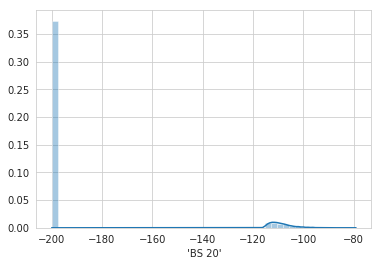

In [0]:
sns.distplot(train_sort_data2["'BS 20'"])

70% values from BS-1 have been made NaN as it is out of range. We will try to predict it using interpolation.

### Plotting Fingerprinting Heatmap for BS-1 training data

In [0]:
# Line 2.
extent = x_extent = x_min, x_max, y_min, y_max = [train_sort_data2.Latitude.min()-50, train_sort_data2.Latitude.max()+50,
                                                  train_sort_data2.Longitude.min()-10, train_sort_data2.Longitude.max()+10]

In [0]:
extent

[1.1861686700000007, 101.23601913, -5.674818516, 14.45976162]

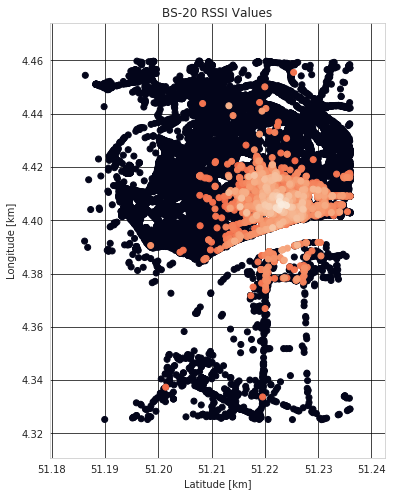

In [0]:
fig, ax = plt.subplots(figsize=(15,8))

ax.scatter(train_sort_data2.Latitude, train_sort_data2.Longitude, c=train_sort_data2["'BS 20'"])
ax.set_aspect(.5)
#ax.set_xlim(*extent[:])
#ax.set_ylim(*extent[:])
ax.set_xlabel('Latitude [km]')
ax.set_ylabel('Longitude [km]')
ax.set_title('BS-20 RSSI Values')
ax.grid(c='k', alpha=0.9)

plt.show()

### Interpolation Techniques

In [0]:
train_filtered_data.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
0,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-58.0,-112,NaN,-200,-200,-200,-200,-115,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.54,51.203056,4.393092,1.931891
1,-105.0,-125.0,-200,-200,-200,-200,-103.0,-200,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-104,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.72,51.218662,4.449273,3.258610
2,-119.0,-125.0,-110,-200,-200,-200,-99.0,-107,-119.0,-125.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.71,51.210537,4.452394,3.612249
3,-119.0,-125.0,-200,-200,-112,-200,-125.0,-200,-119.0,-125.0,-111,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.79,51.230099,4.430180,2.265128
4,-119.0,-125.0,-200,-108,-109,-200,-125.0,-200,-119.0,-125.0,-110,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,1.30,51.233448,4.417600,1.883008


In [0]:
train_filtered_data = train_filtered_data.reset_index(drop=True)

In [0]:
test_filtered_data = test_filtered_data.reset_index(drop=True)

In [0]:
train_df = train_filtered_data.sort_values(by="'BS 20'", ascending=False)

In [0]:
test_df = test_filtered_data.sort_values(by="'BS 20'", ascending=False)

### Linear *Interpolation*

In [0]:
train_df.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
70865,-119.0,-97.0,-107,-200,-200,-200,-125.0,-200,-119.0,-92.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.75,51.194359,4.418258,2.993044
70866,-114.0,-95.0,-200,-200,-200,-200,-125.0,-200,-119.0,-93.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.62,51.194359,4.418633,3.002731
70867,-110.0,-95.0,-200,-200,-200,-200,-125.0,-200,-119.0,-93.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.67,51.194275,4.418765,3.014822
70868,-119.0,-102.0,-200,-200,-200,-200,-125.0,-200,-119.0,-101.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.67,51.194237,4.418428,3.010028
70869,-113.0,-96.0,-200,-200,-200,-200,-125.0,-200,-119.0,-93.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,NaN,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.80,51.194176,4.418694,3.023182


In [0]:
test_df.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude
10325,-200,-200,-200,-200,-104,-200,-200,-200,-200,-200,-200,-200,-100,-104,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.63,51.231102,4.409197
10324,-200,-200,-200,-200,-200,-200,-200,-200,-109,-200,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.74,51.230076,4.412734
10323,-96,-200,-104,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-106,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.61,51.203415,4.425303
10322,-112,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-112,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.89,51.209763,4.425420
15495,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-101,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.67,51.212692,4.409593


In [0]:
train_df20 = train_df.interpolate(method ='linear', limit_direction ='forward')

In [0]:
train_df20.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
70865,-119.0,-97.0,-107,-200,-200,-200,-125.0,-200,-119.0,-92.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.75,51.194359,4.418258,2.993044
70866,-114.0,-95.0,-200,-200,-200,-200,-125.0,-200,-119.0,-93.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.62,51.194359,4.418633,3.002731
70867,-110.0,-95.0,-200,-200,-200,-200,-125.0,-200,-119.0,-93.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.67,51.194275,4.418765,3.014822
70868,-119.0,-102.0,-200,-200,-200,-200,-125.0,-200,-119.0,-101.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.67,51.194237,4.418428,3.010028
70869,-113.0,-96.0,-200,-200,-200,-200,-125.0,-200,-119.0,-93.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.80,51.194176,4.418694,3.023182


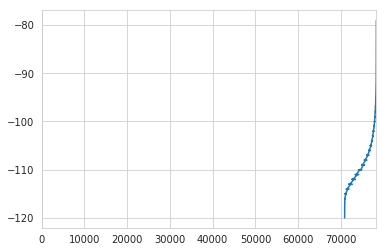

In [0]:
train_df["'BS 20'"].plot()

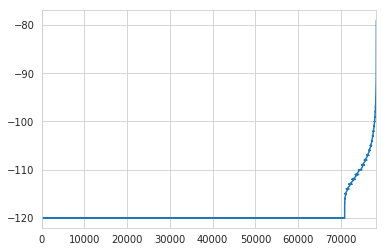

In [0]:
df_linear = train_df20["'BS 20'"].plot()

### Linear, Cubic, Quadratic *Interpolation*

In [0]:
from scipy.interpolate.rbf import Rbf  # radial basis functions
from urllib.request import urlopen
 
import matplotlib.pyplot as plt
import numpy as np

In [0]:
random_subset20 = train_df20.sample(n=100, replace=True)

In [0]:
random_subset20.head()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
13950,-119.0,-106.0,-200,-200,-200,-200,-125.0,-200,-103.0,-125.0,-200,-200,-120.0,-100.0,-200,-200,-121.0,-120.0,-200,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.85,51.214844,4.415877,1.060528
26334,-119.0,-125.0,-200,-200,-200,-200,-105.0,-200,-106.0,-125.0,-103,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.91,51.208832,4.434755,2.535444
34545,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-119.0,-125.0,-200,-200,-108.0,-121.0,-200,-200,-121.0,-120.0,-113,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-116,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,1.03,51.216572,4.402164,0.315352
13548,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-107.0,-125.0,-200,-200,-120.0,-82.0,-200,-200,-121.0,-120.0,-200,-120.0,-102,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.67,51.218121,4.414387,0.840009
55297,-119.0,-125.0,-200,-200,-200,-200,-125.0,-200,-100.0,-125.0,-200,-200,-120.0,-92.0,-200,-200,-121.0,-111.0,-200,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,1.20,51.217934,4.414175,0.829317


In [0]:
# Linear Interpolation

In [0]:
df0 = random_subset20.interpolate(method ='linear', limit_direction ='backward')

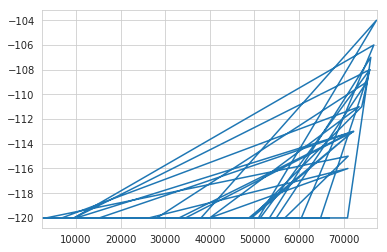

In [0]:
df_linear = df0["'BS 20'"].sample(100).plot()

In [0]:
# Cubic Interpolation

In [0]:
df1 = random_subset20.interpolate(method ='cubic', limit_direction ='backward')

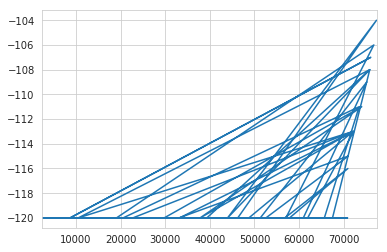

In [0]:
df_cubic = df1["'BS 20'"].plot()

In [0]:
# Quadratic Interpolation

In [0]:
df2 = random_subset20.interpolate(method ='quadratic', limit_direction ='backward')

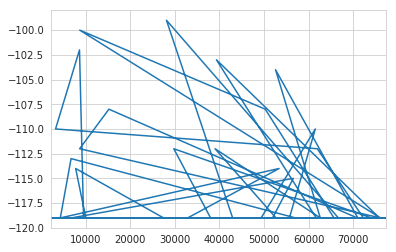

In [0]:
df_quadratic = df2
df2["'BS 1'"].plot()

In [0]:
import numpy as np; np.random.seed(0)
import seaborn as sns

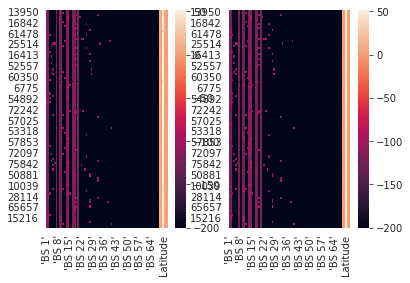

In [0]:
fig, ax =plt.subplots(1,2)

sns.heatmap(df0, ax=ax[0])
sns.heatmap(df1, ax=ax[1])

plt.show()

In [0]:
#Creating some data, with each coordinate and the values stored in separated lists
x = random_subset20.distance
y = random_subset20.distance
values = random_subset20["'BS 20'"]

In [0]:
random_subset20.drop_duplicates(['Latitude','Longitude'], inplace=True)

In [0]:
hm = random_subset20.pivot("Latitude", "Longitude", "'BS 20'")
hm.head()

Longitude,4.389378548,4.39030838,4.390675068,4.391520023,4.39152813,4.391841888,4.392610073,4.393479824,4.397446632,4.397633076,4.398099899,4.39989996,4.400360107,4.400963306,4.401810169,4.4018616680000004,4.401989937,4.402163506,4.402248383,4.40290165,4.403126717,4.403240203999999,4.4033932689999995,4.403626919,4.403696537,4.404033183999999,4.404221535,4.404290199,4.404313088,4.404421806,4.404448509,4.404699802,4.405226708,4.40531826,4.405378342,4.405771732,4.405783176,4.405808448999999,4.405826568999999,4.406213284,...,4.414175033999999,4.414243221,4.414278507,4.414386749,4.415173531000001,4.415876865,4.416066647,4.4171400069999995,4.417836666,4.417946816000001,4.4179534910000005,4.417991638,4.418123245,4.418148518,4.418234825,4.418343544,4.418548584,4.418584824,4.418610096,4.418640137,4.418726921,4.418858528,4.418923378,4.419008255,4.419713497,4.420460224,4.421470165,4.423178196,4.423301697,4.425173283,4.425438403999999,4.425511837,4.426843166,4.427571774,4.4303951260000005,4.434754849,4.436761856,4.441969872,4.442959786,4.443078518
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.194149,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-120.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194160,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-120.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194172,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-120.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194210,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-120.0,NaN,NaN,NaN,-120.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
51.194229,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-120.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
hm_df = hm.interpolate(method ='linear', limit_direction ='both')

In [0]:
hm_df.head()

Longitude,4.389378548,4.39030838,4.390675068,4.391520023,4.39152813,4.391841888,4.392610073,4.393479824,4.397446632,4.397633076,4.398099899,4.39989996,4.400360107,4.400963306,4.401810169,4.4018616680000004,4.401989937,4.402163506,4.402248383,4.40290165,4.403126717,4.403240203999999,4.4033932689999995,4.403626919,4.403696537,4.404033183999999,4.404221535,4.404290199,4.404313088,4.404421806,4.404448509,4.404699802,4.405226708,4.40531826,4.405378342,4.405771732,4.405783176,4.405808448999999,4.405826568999999,4.406213284,...,4.414175033999999,4.414243221,4.414278507,4.414386749,4.415173531000001,4.415876865,4.416066647,4.4171400069999995,4.417836666,4.417946816000001,4.4179534910000005,4.417991638,4.418123245,4.418148518,4.418234825,4.418343544,4.418548584,4.418584824,4.418610096,4.418640137,4.418726921,4.418858528,4.418923378,4.419008255,4.419713497,4.420460224,4.421470165,4.423178196,4.423301697,4.425173283,4.425438403999999,4.425511837,4.426843166,4.427571774,4.4303951260000005,4.434754849,4.436761856,4.441969872,4.442959786,4.443078518
Latitude,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
51.194149,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-113.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-108.0,-120.0,-120.0,-111.0,-113.0,-113.0,-120.0,-109.0,-106.0,-108.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,...,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0
51.194160,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-113.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-108.0,-120.0,-120.0,-111.0,-113.0,-113.0,-120.0,-109.0,-106.0,-108.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,...,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0
51.194172,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-113.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-108.0,-120.0,-120.0,-111.0,-113.0,-113.0,-120.0,-109.0,-106.0,-108.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,...,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0
51.194210,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-113.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-108.0,-120.0,-120.0,-111.0,-113.0,-113.0,-120.0,-109.0,-106.0,-108.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,...,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0
51.194229,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-113.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-108.0,-120.0,-120.0,-111.0,-113.0,-113.0,-120.0,-109.0,-106.0,-108.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,...,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-120.0,-1

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

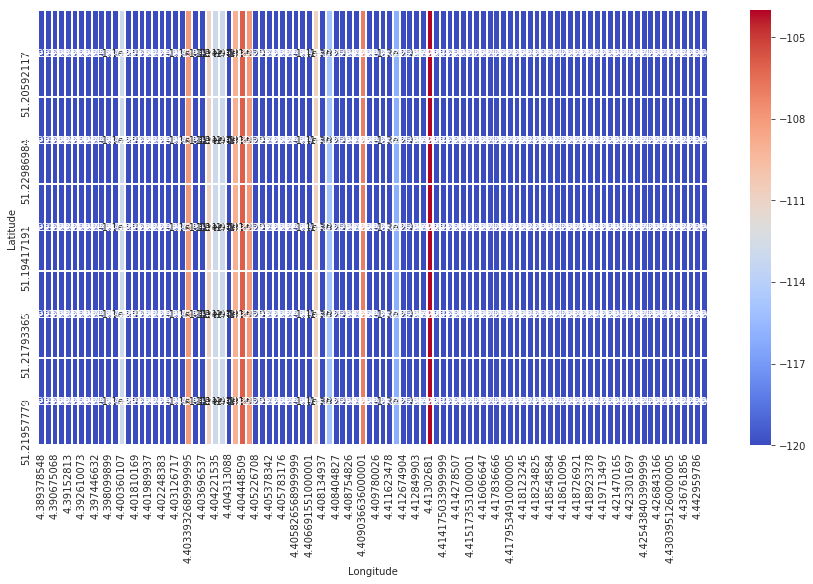

In [0]:
plt.figure(figsize=(15,8))
sns.heatmap(hm_df.sample(5), annot=True, linewidth = 0.9, cmap='coolwarm')

### AutoEncoder Imputation

In [0]:
from numpy import nan
from sklearn.preprocessing import Imputer

In [0]:
traincols = train_df.columns.tolist() 
traincols.remove('Latitude')
traincols.remove('Longitude')
traincols.remove('distance')
len(traincols)

70

In [0]:
columns_X = traincols
x = train_df[columns_X]

In [0]:
columns_y = ['Latitude','Longitude']
y = train_df[columns_y]

In [0]:
imp = Imputer(strategy='mean')
X2 = imp.fit_transform(train_df)
X2

array([[-119.        , -125.        , -200.        , ...,   51.22309875,
           4.40589333,    0.47434261],
       [-119.        , -125.        , -200.        , ...,   51.22405624,
           4.40556002,    0.55989264],
       [-119.        , -125.        , -200.        , ...,   51.22273254,
           4.40705347,    0.48772959],
       ...,
       [-110.        ,  -95.        , -200.        , ...,   51.1942749 ,
           4.41876507,    3.01482165],
       [-119.        , -102.        , -200.        , ...,   51.19423676,
           4.41842842,    3.01002778],
       [-113.        ,  -96.        , -200.        , ...,   51.19417572,
           4.41869354,    3.0231818 ]])

In [0]:
model = LinearRegression().fit(X2, y)
model.predict(X2)

array([[51.22309875,  4.40589333],
       [51.22405624,  4.40556002],
       [51.22273254,  4.40705347],
       ...,
       [51.1942749 ,  4.41876507],
       [51.19423676,  4.41842842],
       [51.19417572,  4.41869354]])

In [0]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures

model = make_pipeline(Imputer(strategy='mean'),
                      PolynomialFeatures(degree=2),
                      LinearRegression())

In [0]:
def make_reconstruction_loss(n_features):

    def reconstruction_loss(input_and_mask, y_pred):
        X_values = input_and_mask[:, :n_features]
        X_values.name = "$X_values"

        missing_mask = input_and_mask[:, n_features:]
        missing_mask.name = "$missing_mask"
        observed_mask = 1 - missing_mask
        observed_mask.name = "$observed_mask"

        X_values_observed = X_values * observed_mask
        X_values_observed.name = "$X_values_observed"

        pred_observed = y_pred * observed_mask
        pred_observed.name = "$y_pred_observed"

        return mse(y_true=X_values_observed, y_pred=pred_observed)
    return reconstruction_loss
  
def masked_mae(X_true, X_pred, mask):
    masked_diff = X_true[mask] - X_pred[mask]
    return np.mean(np.abs(masked_diff))

In [0]:
import random
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
from keras.utils import np_utils
from sklearn.preprocessing import LabelEncoder

from keras.objectives import mse
from keras.models import Sequential
from keras.layers.core import Dropout, Dense

from keras.regularizers import L1L2

from collections import defaultdict

%matplotlib inline

In [0]:
class Autoencoder:

    def __init__(self, data,
                 recurrent_weight=0.5,
                 optimizer="adam",
                 dropout_probability=0.5,
                 hidden_activation="relu",
                 output_activation="sigmoid",
                 init="glorot_normal",
                 L1_penalty=0,
                 L2_penalty=0):
        self.data = data.copy()
        self.recurrent_weight = recurrent_weight
        self.optimizer = optimizer
        self.dropout_probability = dropout_probability
        self.hidden_activation = hidden_activation
        self.output_activation = output_activation
        self.init = init
        self.L1_penalty = L1_penalty
        self.L2_penalty = L2_penalty

    def _get_hidden_layer_sizes(self):
        n_dims = self.data.shape[1]
        return [
            min(2000, 8 * n_dims),
            min(500, 2 * n_dims),
            int(np.ceil(0.5 * n_dims)),
        ]

    def _create_model(self):

        hidden_layer_sizes = self._get_hidden_layer_sizes()
        first_layer_size = hidden_layer_sizes[0]
        n_dims = self.data.shape[1]

        model = Sequential()

        model.add(Dense(
            first_layer_size,
            input_dim= 2 * n_dims,
            activation=self.hidden_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))
        model.add(Dropout(self.dropout_probability))

        for layer_size in hidden_layer_sizes[1:]:
            model.add(Dense(
                layer_size,
                activation=self.hidden_activation,
                W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
                init=self.init))
            model.add(Dropout(self.dropout_probability))

        model.add(Dense(
            n_dims,
            activation=self.output_activation,
            W_regularizer=L1L2(self.L1_penalty, self.L2_penalty),
            init=self.init))

        loss_function = make_reconstruction_loss(n_dims)

        model.compile(optimizer=self.optimizer, loss=loss_function)
        return model

    def fill(self, missing_mask):
        self.data[missing_mask] = -1

    def _create_missing_mask(self):
        if self.data.dtype != "f" and self.data.dtype != "d":
            self.data = self.data.astype(float)

        return np.isnan(self.data)

    def _train_epoch(self, model, missing_mask, batch_size):
        input_with_mask = np.hstack([self.data, missing_mask])
        n_samples = len(input_with_mask)
        n_batches = int(np.ceil(n_samples / batch_size))
        indices = np.arange(n_samples)
        np.random.shuffle(indices)
        X_shuffled = input_with_mask[indices]

        for batch_idx in range(n_batches):
            batch_start = batch_idx * batch_size
            batch_end = (batch_idx + 1) * batch_size
            batch_data = X_shuffled[batch_start:batch_end, :]
            model.train_on_batch(batch_data, batch_data)
        return model.predict(input_with_mask)

    def train(self, batch_size=256, train_epochs=100):
        missing_mask = self._create_missing_mask()
        self.fill(missing_mask)
        self.model = self._create_model()

        observed_mask = ~missing_mask

        for epoch in range(train_epochs):
            X_pred = self._train_epoch(self.model, missing_mask, batch_size)
            observed_mae = masked_mae(X_true=self.data,
                                    X_pred=X_pred,
                                    mask=observed_mask)
            if epoch % 50 == 0:
                print("observed mae:", observed_mae)

            old_weight = (1.0 - self.recurrent_weight)
            self.data[missing_mask] *= old_weight
            pred_missing = X_pred[missing_mask]
            self.data[missing_mask] += self.recurrent_weight * pred_missing
        return self.data.copy()

In [0]:
train_df["'BS 20'"] = pd.to_numeric(train_df["'BS 20'"], errors='coerce')

In [0]:
train_df3 = train_df.dropna(subset=["'BS 20'"])


In [0]:
train_df3["'BS 20'"] = train_df3["'BS 20'"].astype(int)

In [0]:
missing_encoded = pd.get_dummies(train_df)

for col in train_df.columns:
    missing_cols = missing_encoded.columns.str.startswith(str(col) + "_")
    missing_encoded.loc[train_df[col].isnull(), missing_cols] = np.nan

In [0]:
missing_encoded.values

array([[-119.        , -125.        , -200.        , ...,   51.22309875,
           4.40589333,    0.47434261],
       [-119.        , -125.        , -200.        , ...,   51.22405624,
           4.40556002,    0.55989264],
       [-119.        , -125.        , -200.        , ...,   51.22273254,
           4.40705347,    0.48772959],
       ...,
       [-110.        ,  -95.        , -200.        , ...,   51.1942749 ,
           4.41876507,    3.01482165],
       [-119.        , -102.        , -200.        , ...,   51.19423676,
           4.41842842,    3.01002778],
       [-113.        ,  -96.        , -200.        , ...,   51.19417572,
           4.41869354,    3.0231818 ]])

In [0]:
#pip install autoencoder-impute

In [0]:
model.fit(x, y)  # X with missing values, from above
print(model.predict(x))

[[51.21951294  4.39921951]
 [51.22713661  4.39234543]
 [51.21995926  4.40037155]
 ...
 [51.19357872  4.41900635]
 [51.19501305  4.41892242]
 [51.19377518  4.41897964]]


In [0]:
random_subset20.tail()

,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
6710,-119.0,-115,-200,-200,-200,-200,-118,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,9,0.60,51.208340,4.413572,1.451648
34085,-119.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-113,-200,-100,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-108,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.77,51.215759,4.414157,0.907220
37759,-119.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-102,-109,-200,-200,-200,-102,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,7,0.77,51.213684,4.422272,1.516700
11887,-119.0,-200,-200,-200,-112,-200,-200,-200,-200,-200,-109,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,8,0.65,51.235828,4.426202,2.461905
11505,-119.0,-102,-200,-200,-200,-200,-101,-200,-200,-85,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.64,51.194138,4.418667,3.026425


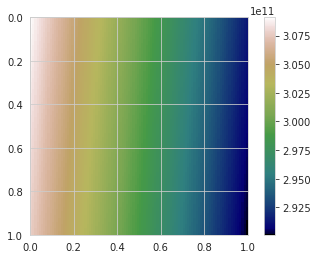

In [0]:
# Radial Basis Function(Normalizing it)
import numpy as np
import scipy.interpolate
import matplotlib.pyplot as plt
np.random.seed(2000)

x = random_subset20.Latitude
y = random_subset20.Longitude
z = random_subset20["'BS 20'"]

interp = scipy.interpolate.Rbf(x, y, z, function='cubic')

yi, xi = np.mgrid[0:1:100j, 0:1:100j]

zi = interp(xi, yi)

plt.plot(x, y, 'ko')
plt.imshow(zi, extent=[0, 1, 1, 0], cmap='gist_earth')
plt.colorbar()

plt.show()

In [0]:
import pandas as pd 
import folium
from folium.plugins import HeatMap

# Fingerprinting linear
max_amount = float(random_subset20["'BS 20'"].max())

hmap = folium.Map(location=[51.2, 4.42], zoom_start=12, width=500,height=500)

hm_wide = HeatMap( list(zip(random_subset20.Latitude.values, random_subset20.Longitude.values, random_subset20["'BS 20'"].values)),
                   min_opacity=0.2,
                   max_val=max_amount,
                   radius=20, blur=15, 
                   max_zoom=1, 
                 )

hmap.add_child(hm_wide)

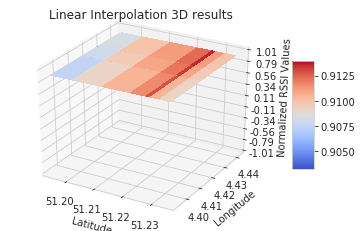

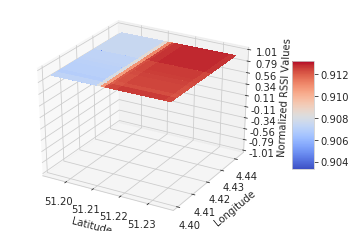

In [0]:
# This import registers the 3D projection, but is otherwise unused.
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt


fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df0.sample(20).Latitude
y = df0.sample(20).Longitude
z = random_subset20["'BS 1'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
plt.title('Linear Interpolation 3D results')

ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

fig = plt.figure()
ax = fig.gca(projection='3d')

# Make data.
x = df1.sample(20).Latitude
y = df1.sample(20).Longitude
z = random_subset20["'BS 20'"]
X, Y = np.meshgrid(x, y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)
ax.set_xlabel('Latitude')
ax.set_ylabel('Longitude')
ax.set_zlabel('Normalized RSSI Values')
plt.show()

In [0]:
train_df20.to_csv('/content/drive/My Drive/Colab Notebooks/masters_project/latest_df.csv')

# Deep Learning Algorithms to Estimate/Predict Location

In [0]:
prob_ori_df = pd.read_csv('/content/drive/My Drive/Colab Notebooks/masters_project/latest_df.csv')
test_df = pd.read_csv("/content/drive/My Drive/Colab Notebooks/masters_project/test.csv")

In [11]:
prob_ori_df.tail()

,Unnamed: 0,'BS 1','BS 2','BS 3','BS 4','BS 5','BS 6','BS 7','BS 8','BS 9','BS 10','BS 11','BS 12','BS 13','BS 14','BS 15','BS 16','BS 17','BS 18','BS 19','BS 20','BS 21','BS 22','BS 23','BS 24','BS 25','BS 26','BS 27','BS 28','BS 29','BS 30','BS 31','BS 32','BS 33','BS 34','BS 35','BS 36','BS 37','BS 38','BS 39','BS 40','BS 41','BS 42','BS 43','BS 44','BS 45','BS 46','BS 47','BS 48','BS 49','BS 50','BS 51','BS 52','BS 53','BS 54','BS 55','BS 56','BS 57','BS 58','BS 59','BS 60','BS 61','BS 62','BS 63','BS 64','BS 65','BS 66','BS 67','BS 68','SF','HDOP',Latitude,Longitude,distance
78292,70865,-119.0,-97.0,-107,-200,-200,-200,-125.0,-200,-119.0,-92.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.75,51.194359,4.418258,2.993044
78293,70866,-114.0,-95.0,-200,-200,-200,-200,-125.0,-200,-119.0,-93.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,12,0.62,51.194359,4.418633,3.002731
78294,70867,-110.0,-95.0,-200,-200,-200,-200,-125.0,-200,-119.0,-93.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.67,51.194275,4.418765,3.014822
78295,70868,-119.0,-102.0,-200,-200,-200,-200,-125.0,-200,-119.0,-101.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-111,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,11,0.67,51.194237,4.418428,3.010028
78296,70869,-113.0,-96.0,-200,-200,-200,-200,-125.0,-200,-119.0,-93.0,-200,-200,-120.0,-121.0,-200,-200,-121.0,-120.0,-200,-120.0,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,-200,10,0.80,51.194176,4.418694,3.023182


In [0]:
prob_df1 = prob_ori_df[["'BS 1'","'BS 2'","'BS 7'","'BS 9'","'BS 10'","'BS 13'","'BS 14'","'BS 17'","'BS 18'","'BS 20'","'SF'","'HDOP'",'Latitude','Longitude','distance']]

In [13]:
# 10 Base Stations Only
prob_df1.head()

,'BS 1','BS 2','BS 7','BS 9','BS 10','BS 13','BS 14','BS 17','BS 18','BS 20','SF','HDOP',Latitude,Longitude,distance
0,-119.0,-125.0,-125.0,-119.0,-125.0,-120.0,-107.0,-121.0,-120.0,-79.0,9,0.67,51.223099,4.405893,0.474343
1,-119.0,-125.0,-125.0,-119.0,-125.0,-105.0,-102.0,-121.0,-120.0,-80.0,9,0.75,51.224056,4.405560,0.559893
2,-119.0,-125.0,-125.0,-119.0,-125.0,-120.0,-107.0,-121.0,-120.0,-81.0,8,0.74,51.222733,4.407053,0.487730
3,-119.0,-125.0,-125.0,-119.0,-125.0,-103.0,-103.0,-121.0,-120.0,-82.0,10,0.72,51.223553,4.406034,0.523239
4,-119.0,-125.0,-125.0,-119.0,-125.0,-109.0,-104.0,-121.0,-120.0,-82.0,12,0.82,51.222908,4.405167,0.432026


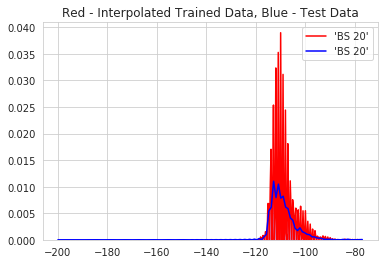

In [14]:
# library and dataset
import seaborn as sns
 
# plot of 2 variables
p1=sns.kdeplot(prob_df1["'BS 20'"], shade=True, color="r").set_title('Red - Interpolated Trained Data, Blue - Test Data')
p1=sns.kdeplot(test_df["'BS 20'"], shade=True, color="b")
#sns.plt.show()

In [0]:
df_bs20 = prob_ori_df[["'BS 1'","'BS 2'","'BS 7'","'BS 9'","'BS 10'","'BS 13'","'BS 14'","'BS 17'","'BS 18'","'BS 20'","'SF'","'HDOP'",'Latitude','Longitude','distance']]
cols = [0,1,2,3,4,5,6,7,8]
df_bs20.drop(df_bs20.columns[cols],axis=1,inplace=True)

In [16]:
df_bs20.head()

,'BS 20','SF','HDOP',Latitude,Longitude,distance
0,-79.0,9,0.67,51.223099,4.405893,0.474343
1,-80.0,9,0.75,51.224056,4.405560,0.559893
2,-81.0,8,0.74,51.222733,4.407053,0.487730
3,-82.0,10,0.72,51.223553,4.406034,0.523239
4,-82.0,12,0.82,51.222908,4.405167,0.432026


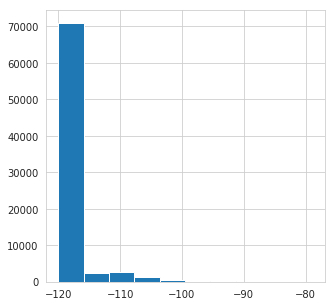

In [17]:
%matplotlib inline
import matplotlib.pyplot as plt 
df_bs20["'BS 20'"].hist(figsize=(5,5))# Plotting all the beacons values 
#x axis = RSSI value
#y axis = number of data points at a perticular RSSI value
plt.savefig('Leabeled_beacons_Histograms.png')
plt.show()

In [18]:
traincols = df_bs20.columns.tolist() 
traincols.remove('Latitude')
traincols.remove('Longitude')
traincols.remove('distance')
len(traincols)

3

In [0]:
columns_X = traincols
x = df_bs20[columns_X]
columns_y = ['Latitude','Longitude','distance']
y = df_bs20[columns_y]

In [20]:
x.head()

,'BS 20','SF','HDOP'
0,-79.0,9,0.67
1,-80.0,9,0.75
2,-81.0,8,0.74
3,-82.0,10,0.72
4,-82.0,12,0.82


In [21]:
y.head()

,Latitude,Longitude,distance
0,51.223099,4.405893,0.474343
1,51.224056,4.405560,0.559893
2,51.222733,4.407053,0.487730
3,51.223553,4.406034,0.523239
4,51.222908,4.405167,0.432026


In [0]:
def plot_confusion_matrix(cm, names, title='Confusion matrix', cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(names))
    plt.xticks(tick_marks, names, rotation=45)
    plt.yticks(tick_marks, names)
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [0]:
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import confusion_matrix
def print_report(y_pred,y_true):
    print("Accuracy: ", metrics.accuracy_score(y_true,y_pred))
    print("Precision: ", metrics.precision_score(y_true,y_pred, pos_label=1, average='weighted'))
    print("Recall: ", metrics.recall_score(y_true,y_pred, pos_label=1, average='weighted'))
    print("F1_Score: ", metrics.f1_score(y_true,y_pred, pos_label=1, average='weighted'))
    cm = confusion_matrix(y_true, y_pred)
    print(cm)
    outcome = encode_text_index(df_bs20,'Longitude','Latitude')
    print('Plotting confusion matrix')
    plt.figure()
    plot_confusion_matrix(cm, outcome)
    plt.show()
    print(classification_report(y_true, y_pred))

In [24]:
df_bs20.shape

(78297, 6)

In [25]:
df_bs20.head()

,'BS 20','SF','HDOP',Latitude,Longitude,distance
0,-79.0,9,0.67,51.223099,4.405893,0.474343
1,-80.0,9,0.75,51.224056,4.405560,0.559893
2,-81.0,8,0.74,51.222733,4.407053,0.487730
3,-82.0,10,0.72,51.223553,4.406034,0.523239
4,-82.0,12,0.82,51.222908,4.405167,0.432026


In [0]:
import seaborn as sns
%matplotlib inline

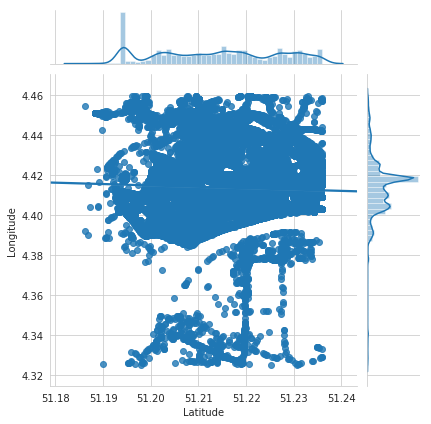

In [30]:
sns.jointplot(x='Latitude', y='Longitude', data = prob_df1, kind = 'reg')

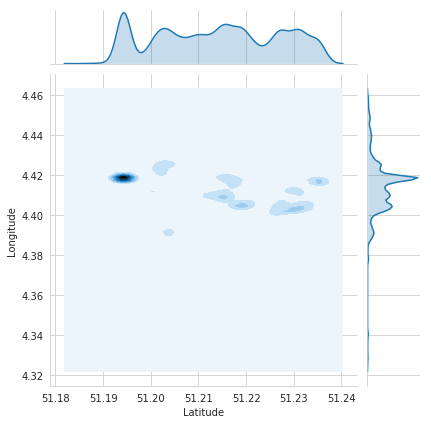

In [31]:
sns.jointplot(x='Latitude', y='Longitude', data = prob_df1, kind = 'kde')

In [0]:
x_train, x_test, y_train, y_test = train_test_split(df_bs20[traincols],df_bs20[columns_y], test_size=0.3, random_state=42)

In [0]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers.core import Dense, Activation
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
import os
import io
import requests
from sklearn import metrics

## Artificial Neural Network

In [0]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers.core import Dense, Activation
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
import os
import io
import requests
from sklearn import metrics


x_train_ann_class, x_test_ann_class, y_train_ann_class, y_test_ann_class = train_test_split(x,y, test_size=0.3, random_state=42)
checkpointer = ModelCheckpoint(filepath="/content/drive/My Drive/Colab Notebooks/masters_project/best_weights_fairclass.hdf5", verbose=0, save_best_only=True) # save best model

for i in range(5):
    model = Sequential()
    model.add(Dense(60, input_dim=x.shape[1], activation='softmax')) # Hidden 1
    model.add(Dense(30, activation='sigmoid')) # Hidden 2
    model.add(Dense(15, activation='sigmoid')) # Hidden 3
    model.add(Dense(3)) # Output
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=5, verbose=1, mode='auto')
    model.fit(x_train_ann_class, y_train_ann_class, validation_data=(x_test_ann_class,y_test_ann_class), callbacks=[monitor,checkpointer], verbose=2, epochs=100)  

    

model.load_weights('/content/drive/My Drive/Colab Notebooks/masters_project/best_weights_fairclass.hdf5')
pred = model.predict(x_test_ann_class)







Train on 54807 samples, validate on 23490 samples
Epoch 1/100
 - 3s - loss: 626.4438 - acc: 0.9177 - val_loss: 419.9314 - val_acc: 1.0000
Epoch 2/100
 - 3s - loss: 261.6822 - acc: 1.0000 - val_loss: 141.0719 - val_acc: 1.0000
Epoch 3/100
 - 3s - loss: 75.5538 - acc: 1.0000 - val_loss: 29.2434 - val_acc: 1.0000
Epoch 4/100
 - 3s - loss: 11.1834 - acc: 1.0000 - val_loss: 1.8448 - val_acc: 1.0000
Epoch 5/100
 - 3s - loss: 0.6089 - acc: 1.0000 - val_loss: 0.2871 - val_acc: 1.0000
Epoch 6/100
 - 3s - loss: 0.2890 - acc: 1.0000 - val_loss: 0.2852 - val_acc: 1.0000
Epoch 7/100
 - 3s - loss: 0.2888 - acc: 1.0000 - val_loss: 0.2848 - val_acc: 1.0000
Epoch 8/100
 - 3s - loss: 0.2887 - acc: 1.0000 - val_loss: 0.2848 - val_acc: 1.0000
Epoch 9/100
 - 3s - loss: 0.2887 - acc: 1.0000 - val_loss: 0.2851 - val_acc: 1.0000
Epoch 10/100
 - 3s - loss: 0.2887 - acc: 1.0000 - val_loss: 0.2849 - val_acc: 1.0000
Epoch 11/100
 - 3s - loss: 0.2887 - acc: 1.0000 - val_loss: 0.2848 - val_acc: 1.0000
Epoch 0

In [0]:
score = metrics.mean_squared_error(pred,y_test_ann_class)
print("Final score (MSE): {}".format(score*1000))
score_ann_1 = np.sqrt(metrics.mean_squared_error(pred,y_test_ann_class))
print("Final score (RMSE): {}".format(score_ann_1*1000))

Final score (MSE): 284.7847574337786
Final score (RMSE): 533.6522813909621


## Hyper-Parameter Tuning (ANN)

### Sigmoid as Activation Function & SGD as optimizer

In [0]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers.core import Dense, Activation
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
import os
import io
import requests
from sklearn import metrics


x_train_ann_class, x_test_ann_class, y_train_ann_class, y_test_ann_class = train_test_split(x,y, test_size=0.3, random_state=42)
checkpointer = ModelCheckpoint(filepath="/content/drive/My Drive/Colab Notebooks/masters_project/best_weights_fairclass.hdf5", verbose=0, save_best_only=True) # save best model

for i in range(5):
    model = Sequential()
    model.add(Dense(15, input_dim=x.shape[1], activation='sigmoid')) # Hidden 1
    model.add(Dense(10, activation='sigmoid')) # Hidden 2
    model.add(Dense(5, activation='sigmoid')) # Hidden 3
    model.add(Dense(3)) # Output
    model.compile(loss='mean_squared_error', optimizer='sgd', metrics=['accuracy'])
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=5, verbose=1, mode='auto')
    history = model.fit(x_train_ann_class, y_train_ann_class, validation_data=(x_test_ann_class,y_test_ann_class), callbacks=[monitor,checkpointer], verbose=2, epochs=100)  

    

model.load_weights('/content/drive/My Drive/Colab Notebooks/masters_project/best_weights_fairclass.hdf5')
pred = model.predict(x_test_ann_class)

ANN_Hypertune1_MSE = metrics.mean_squared_error(pred,y_test_ann_class)
print("Final score (MSE): {}".format(ANN_Hypertune1_MSE*1000))
ANN_Hypertune1_RMSE = np.sqrt(metrics.mean_squared_error(pred,y_test_ann_class))
print("Final score (RMSE): {}".format(ANN_Hypertune1_RMSE*1000))

Train on 54807 samples, validate on 23490 samples
Epoch 1/100
 - 5s - loss: 8.2961 - acc: 0.9994 - val_loss: 0.2865 - val_acc: 1.0000
Epoch 2/100
 - 3s - loss: 0.2887 - acc: 1.0000 - val_loss: 0.2848 - val_acc: 1.0000
Epoch 3/100
 - 3s - loss: 0.2886 - acc: 1.0000 - val_loss: 0.2850 - val_acc: 1.0000
Epoch 4/100
 - 3s - loss: 0.2887 - acc: 1.0000 - val_loss: 0.2854 - val_acc: 1.0000
Epoch 5/100
 - 3s - loss: 0.2887 - acc: 1.0000 - val_loss: 0.2848 - val_acc: 1.0000
Epoch 6/100
 - 3s - loss: 0.2886 - acc: 1.0000 - val_loss: 0.2848 - val_acc: 1.0000
Epoch 7/100
 - 3s - loss: 0.2886 - acc: 1.0000 - val_loss: 0.2850 - val_acc: 1.0000
Epoch 00007: early stopping
Train on 54807 samples, validate on 23490 samples
Epoch 1/100
 - 5s - loss: 8.9996 - acc: 0.9994 - val_loss: 0.2848 - val_acc: 1.0000
Epoch 2/100
 - 3s - loss: 0.2887 - acc: 1.0000 - val_loss: 0.2848 - val_acc: 1.0000
Epoch 3/100
 - 3s - loss: 0.2886 - acc: 1.0000 - val_loss: 0.2851 - val_acc: 1.0000
Epoch 4/100
 - 3s - loss: 0.2886

### Sigmoid as Activation Function, RMSProp as Optimizer, Neuron Counts

In [0]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers.core import Dense, Activation
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
import os
import io
import requests
from sklearn import metrics


x_train_ann_class, x_test_ann_class, y_train_ann_class, y_test_ann_class = train_test_split(x,y, test_size=0.3, random_state=42)
checkpointer = ModelCheckpoint(filepath="/content/drive/My Drive/Colab Notebooks/masters_project/best_weights_fairclass.hdf5", verbose=0, save_best_only=True) # save best model

for i in range(5):
    model = Sequential()
    model.add(Dense(45, input_dim=x.shape[1], activation='sigmoid')) # Hidden 1
    model.add(Dense(30, activation='sigmoid')) # Hidden 2
    model.add(Dense(15, activation='sigmoid')) # Hidden 3
    model.add(Dense(3)) # Output
    model.compile(loss='mean_squared_error', optimizer='rmsprop', metrics=['accuracy'])
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=5, verbose=1, mode='auto')
    history = model.fit(x_train_ann_class, y_train_ann_class, validation_data=(x_test_ann_class,y_test_ann_class), callbacks=[monitor,checkpointer], verbose=2, epochs=100)  

    

model.load_weights('/content/drive/My Drive/Colab Notebooks/masters_project/best_weights_fairclass.hdf5')
pred = model.predict(x_test_ann_class)


ANN_Hypertune2_MSE = metrics.mean_squared_error(pred,y_test_ann_class)
print("Final score (MSE): {}".format(ANN_Hypertune2_MSE*1000))
ANN_Hypertune2_RMSE = np.sqrt(metrics.mean_squared_error(pred,y_test_ann_class))
print("Final score (RMSE): {}".format(ANN_Hypertune2_RMSE*1000))

Train on 54807 samples, validate on 23490 samples
Epoch 1/100
 - 6s - loss: 464.9096 - acc: 0.9965 - val_loss: 173.4582 - val_acc: 1.0000
Epoch 2/100
 - 3s - loss: 48.8039 - acc: 1.0000 - val_loss: 0.2859 - val_acc: 1.0000
Epoch 3/100
 - 3s - loss: 0.2890 - acc: 1.0000 - val_loss: 0.2850 - val_acc: 1.0000
Epoch 4/100
 - 3s - loss: 0.2888 - acc: 1.0000 - val_loss: 0.2848 - val_acc: 1.0000
Epoch 5/100
 - 3s - loss: 0.2889 - acc: 1.0000 - val_loss: 0.2863 - val_acc: 1.0000
Epoch 6/100
 - 3s - loss: 0.2889 - acc: 1.0000 - val_loss: 0.2851 - val_acc: 1.0000
Epoch 7/100
 - 3s - loss: 0.2890 - acc: 1.0000 - val_loss: 0.2850 - val_acc: 1.0000
Epoch 8/100
 - 3s - loss: 0.2890 - acc: 1.0000 - val_loss: 0.2855 - val_acc: 1.0000
Epoch 9/100
 - 3s - loss: 0.2889 - acc: 1.0000 - val_loss: 0.2860 - val_acc: 1.0000
Epoch 00009: early stopping
Train on 54807 samples, validate on 23490 samples
Epoch 1/100
 - 6s - loss: 511.4602 - acc: 0.8231 - val_loss: 204.6068 - val_acc: 1.0000
Epoch 2/100
 - 3s - los

## KNN

In [0]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

Grid Search Cross Validation¶
Grid Search CV implements an exhaustive search over specified parameter values for an estimator. Important members are fit, predict.

It iterates through a dictionary of hyper parameters and choose the combination that better fits the model.

In [0]:
# Funtion for cross-validation over a grid of parameters

def cv_optimize(clf, parameters, X, y, n_jobs=1, n_folds=5, score_func=None):
    if score_func:
        gs = GridSearchCV(clf, param_grid=parameters, cv=n_folds, n_jobs=n_jobs, scoring=score_func)
    else:
        gs = GridSearchCV(clf, param_grid=parameters, n_jobs=n_jobs, cv=n_folds)
    gs.fit(X, y)
    print ("BEST", gs.best_params_, gs.best_score_, gs.cv_results_)
    best = gs.best_estimator_
    return best

In [0]:
# Create a k-Nearest Neighbors Regression estimator
knn_estimator = KNeighborsRegressor()
knn_parameters = {"n_neighbors": [1]}
knn_best = cv_optimize(knn_estimator, knn_parameters, x_train, y_train, score_func='neg_mean_squared_error')

BEST {'n_neighbors': 1} -0.4226463304432474 {'mean_fit_time': array([0.46796737]), 'std_fit_time': array([0.01258099]), 'mean_score_time': array([0.13177438]), 'std_score_time': array([0.01465065]), 'param_n_neighbors': masked_array(data=[1],
             mask=[False],
       fill_value='?',
            dtype=object), 'params': [{'n_neighbors': 1}], 'split0_test_score': array([-0.44186108]), 'split1_test_score': array([-0.40926064]), 'split2_test_score': array([-0.38902107]), 'split3_test_score': array([-0.42061389]), 'split4_test_score': array([-0.45247444]), 'mean_test_score': array([-0.42264633]), 'std_test_score': array([0.02268411]), 'rank_test_score': array([1], dtype=int32)}


In [0]:
knn_reg=knn_best.fit(x_train, y_train)
knn_training_accuracy = knn_reg.score(x_train, y_train)
knn_test_accuracy = knn_reg.score(x_test, y_test)
print ("############# based on standard predict ################")
print ("R^2 on training data: %0.8f" % (knn_training_accuracy))
print ("R^2 on test data:     %0.8f" % (knn_test_accuracy))

############# based on standard predict ################
R^2 on training data: -0.25904971
R^2 on test data:     -0.30755812


In [0]:
# Calculate the Root Mean Squared Error
knn_rmse_1 = np.sqrt(mean_squared_error(knn_reg.predict(x_test),y_test))

In [0]:
print(metrics.mean_squared_error(knn_reg.predict(x_test),y_test)*1000)

372.3708988369914


## LSTM - Ready to train a RNN model

In [0]:
xarray=[]
xarray=df_bs20.as_matrix()

In [35]:
xarray

array([[ -79.        ,    9.        ,    0.67000002,   51.22309875,
           4.40589333,    0.47434261],
       [ -80.        ,    9.        ,    0.75      ,   51.22405624,
           4.40556002,    0.55989264],
       [ -81.        ,    8.        ,    0.74000001,   51.22273254,
           4.40705347,    0.48772959],
       ...,
       [-120.        ,   10.        ,    0.67000002,   51.1942749 ,
           4.41876507,    3.01482165],
       [-120.        ,   11.        ,    0.67000002,   51.19423676,
           4.41842842,    3.01002778],
       [-120.        ,   10.        ,    0.80000001,   51.19417572,
           4.41869354,    3.0231818 ]])

In [0]:
yarray=df_bs20[['Latitude','Longitude']].as_matrix()

In [0]:
SEQUENCE_SIZE = 1
import numpy as np

def to_sequences(seq_size, data,data2):
    x = []
    y = []

    for i in range(len(data)-SEQUENCE_SIZE-1):
        #print(i)
        window = data[i:(i+SEQUENCE_SIZE)]
        after_window = data2[i+SEQUENCE_SIZE]
        window = [[x] for x in window]
        #print("{} - {}".format(window,after_window))
        x.append(window)
        y.append(after_window)
        
    return np.array(x),np.array(y)

In [0]:
x,y = to_sequences(SEQUENCE_SIZE,xarray,yarray)

In [39]:
x.shape

(78295, 1, 1, 6)

In [40]:
y.shape

(78295, 2)

In [0]:
x_rnn = x.reshape(x.shape[0],1,6)

In [0]:
y_rnn = y.reshape(y.shape[0],2)

In [43]:
x_rnn.shape

(78295, 1, 6)

In [44]:
y_rnn.shape

(78295, 2)

In [0]:
x_train_lstm = x_rnn[0:58000]
y_train_lstm = y_rnn[0:58000]
x_test_lstm = x_rnn[58000:70000]
y_test_lstm = y_rnn[58000:70000]

In [47]:
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import Dense, Embedding
from keras.layers import LSTM
from keras.datasets import imdb
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
import numpy as np

checkpointer = ModelCheckpoint(filepath="/content/drive/My Drive/Colab Notebooks/masters_project/best_weights_fairclass.hdf5", verbose=0, save_best_only=True) # save best model

print('Build model...')
for i in range(5):
    model = Sequential()
    model.add(LSTM(32, dropout=0.1, recurrent_dropout=0.1, input_shape=(1, 6)))
    model.add(Dense(32))
    model.add(Dense(2))
    model.compile(loss='mean_squared_error', optimizer='adam', metrics=['accuracy'])
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=5, verbose=1, mode='auto')
    print('Train...')
    model.fit(x_train_lstm,y_train_lstm,validation_data=(x_test_lstm,y_test_lstm),callbacks=[monitor,checkpointer],verbose=2, epochs=10)
    
model.load_weights('/content/drive/My Drive/Colab Notebooks/masters_project/best_weights_fairclass.hdf5')
pred = model.predict(x_test_lstm)

Build model...
Train...
Train on 58000 samples, validate on 12000 samples
Epoch 1/10
 - 13s - loss: 94.1711 - acc: 0.9990 - val_loss: 4.8715e-04 - val_acc: 1.0000
Epoch 2/10
 - 9s - loss: 0.0621 - acc: 1.0000 - val_loss: 3.9314e-04 - val_acc: 1.0000
Epoch 3/10
 - 9s - loss: 0.0197 - acc: 1.0000 - val_loss: 1.7781e-04 - val_acc: 1.0000
Epoch 4/10
 - 9s - loss: 0.0169 - acc: 1.0000 - val_loss: 4.8101e-04 - val_acc: 1.0000
Epoch 5/10
 - 9s - loss: 0.0049 - acc: 1.0000 - val_loss: 2.1025e-04 - val_acc: 1.0000
Epoch 6/10
 - 9s - loss: 0.0056 - acc: 1.0000 - val_loss: 6.7077e-04 - val_acc: 1.0000
Epoch 00006: early stopping
Train...
Train on 58000 samples, validate on 12000 samples
Epoch 1/10
 - 13s - loss: 89.1634 - acc: 0.9992 - val_loss: 8.0774e-04 - val_acc: 1.0000
Epoch 2/10
 - 11s - loss: 0.0870 - acc: 1.0000 - val_loss: 1.7078e-04 - val_acc: 1.0000
Epoch 3/10
 - 10s - loss: 0.0215 - acc: 1.0000 - val_loss: 3.2530e-04 - val_acc: 1.0000
Epoch 4/10
 - 9s - loss: 0.0088 - acc: 1.0000 - va

In [0]:
pred = model.predict(x_test_lstm)
score = metrics.mean_squared_error(pred,y_test_lstm)
print("Final score (MSE): {}".format(score*1000))
lstm_rmse_1 = np.sqrt(metrics.mean_squared_error(pred,y_test_lstm))
lstm_rmse_1 = print("Final score (RMSE): {}".format(lstm_rmse_1*1000))
#chart_regression(pred.flatten(),y_test_lstm)

Final score (MSE): 215.0607269637174
Final score (RMSE): 191.52726473657557


## Hyper-Parameter Tuning (LSTM)

### Batch Size = 81, Optimizer = Adam, Dropout = 0.5

In [48]:
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import Dense, Embedding
from keras.layers import LSTM
from keras.datasets import imdb
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
import numpy as np

checkpointer = ModelCheckpoint(filepath="/content/drive/My Drive/Colab Notebooks/masters_project/best_weights_fairclass1.hdf5", verbose=0, save_best_only=True) # save best model

print('Build model...')
for i in range(5):
    model = Sequential()
    model.add(LSTM(81, dropout=0.5, recurrent_dropout=0.1, input_shape=(1, 6)))
    model.add(Dense(32))
    model.add(Dense(16))
    model.add(Dense(2))
    model.compile(loss='mean_squared_error', optimizer='rmsprop')
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=5, verbose=1, mode='auto')
    print('Train...')
    model.fit(x_train_lstm,y_train_lstm,validation_data=(x_test_lstm,y_test_lstm),callbacks=[monitor,checkpointer],verbose=2, epochs=10)
     
model.load_weights('/content/drive/My Drive/Colab Notebooks/masters_project/best_weights_fairclass1.hdf5')
pred = model.predict(x_test_lstm)

Build model...
Train...
Train on 58000 samples, validate on 12000 samples
Epoch 1/10
 - 16s - loss: 30.9402 - val_loss: 0.0459
Epoch 2/10
 - 13s - loss: 0.2378 - val_loss: 0.6952
Epoch 3/10
 - 12s - loss: 0.1952 - val_loss: 0.0051
Epoch 4/10
 - 12s - loss: 0.1753 - val_loss: 0.0747
Epoch 5/10
 - 12s - loss: 0.1605 - val_loss: 0.0632
Epoch 6/10
 - 11s - loss: 0.1559 - val_loss: 0.1592
Epoch 7/10
 - 12s - loss: 0.1505 - val_loss: 0.0544
Epoch 8/10
 - 11s - loss: 0.1425 - val_loss: 0.0062
Epoch 00008: early stopping
Train...
Train on 58000 samples, validate on 12000 samples
Epoch 1/10
 - 19s - loss: 31.6903 - val_loss: 0.0024
Epoch 2/10
 - 13s - loss: 0.2201 - val_loss: 0.2015
Epoch 3/10
 - 13s - loss: 0.1908 - val_loss: 0.0573
Epoch 4/10
 - 12s - loss: 0.1758 - val_loss: 0.1162
Epoch 5/10
 - 13s - loss: 0.1665 - val_loss: 0.3119
Epoch 6/10
 - 14s - loss: 0.1615 - val_loss: 0.5880
Epoch 00006: early stopping
Train...
Train on 58000 samples, validate on 12000 samples
Epoch 1/10
 - 18s - lo

In [0]:
pred = model.predict(x_test_lstm)
score = metrics.mean_squared_error(pred,y_test_lstm)
print("Final score (MSE): {}".format(score))
lstm_hypertune_1 = np.sqrt(metrics.mean_squared_error(pred,y_test_lstm))
lstm_hypertune_1 = print("Final score (RMSE): {}".format(lstm_hypertune_1*420))

Final score (MSE): 0.2150607269637174
Final score (RMSE): 194.77348956261923


## CNN

In [0]:
x_cnn = x.reshape(x.shape[0], 1, 1, 6)
y_cnn = y.reshape(y.shape[0], 2)

In [0]:
x_train_cnn = x_cnn[0:58000]
y_train_cnn = y_cnn[0:58000]
x_test_cnn = x_cnn[58000:70000]
y_test_cnn = y_cnn[58000:70000]

In [0]:
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
batch_size = 64
checkpointer = ModelCheckpoint(filepath="/content/drive/My Drive/Colab Notebooks/masters_project/best_weights_fairclass.hdf5", verbose=0, save_best_only=True) # save best model

for i in range(2):
    model = Sequential()
    input_shape = (1, 1, 6)
    model.add(Conv2D(64, kernel_size=(3, 3), strides=(1, 1), padding='same',activation='relu',input_shape=input_shape)) 
    model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
    model.add(Conv2D(128, (3, 3), padding='same', activation='tanh'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=None,padding='same'))
    #model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(2))
    model.summary()
    model.compile(loss="mean_squared_error", optimizer="adam")
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience =5, verbose=2, mode='auto')
    model.fit(x_train_cnn, y_train_cnn,batch_size=batch_size,epochs=3,verbose=1,validation_data=(x_test_cnn, y_test_cnn),callbacks=[monitor,checkpointer])

model.load_weights('/content/drive/My Drive/Colab Notebooks/masters_project/best_weights_fairclass.hdf5')   


Model: "sequential_54"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 1, 1, 64)          3520      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 1, 1, 64)          0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 1, 1, 128)         73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 1, 1, 128)         0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 128)               0         
_________________________________________________________________
dense_187 (Dense)            (None, 512)               66048     
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)            

In [0]:
pred = model.predict(x_test_cnn)
score_cnn_mse = metrics.mean_squared_error(pred,y_test_cnn)
print("Final score (MSE): {}".format(score*100))
score_cnn_rmse = np.sqrt(metrics.mean_squared_error(pred,y_test_cnn))
print("Final score (RMSE): {}".format(score*1000))

Final score (MSE): 21.50607269637174
Final score (RMSE): 215.0607269637174


## Hyper-Parameters Tuning (CNN)

### Batch size = 81, Dropout = 0.5, Activation Function = Sigmoid, 2D Kernel

In [0]:
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
batch_size = 81

import numpy as np
import h5py

f = h5py.File('/content/drive/My Drive/Colab Notebooks/masters_project/best_weights_fairclass2.hdf5','w')
group = f.create_group('a_group')
f.close()

checkpointer = ModelCheckpoint(filepath="/content/drive/My Drive/Colab Notebooks/masters_project/best_weights_fairclass2.hdf5", verbose=0, save_best_only=True) # save best model

for i in range(2):
    model = Sequential()
    input_shape = (1, 1, 6)
    model.add(Conv2D(64, kernel_size=(3, 3), strides=(1, 1), padding='same',activation='sigmoid',input_shape=input_shape)) 
    model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
    model.add(Conv2D(128, (3, 3), padding='same', activation='tanh'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=None,padding='same'))
    #model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(512, activation='sigmoid'))
    model.add(Dropout(0.5))
    model.add(Dense(2))
    model.summary()
    model.compile(loss="mean_squared_error", optimizer="adam")
    monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience =5, verbose=2, mode='auto')
    model.fit(x_train_cnn, y_train_cnn,batch_size=batch_size,epochs=3,verbose=1,validation_data=(x_test_cnn, y_test_cnn),callbacks=[monitor,checkpointer])

model.load_weights('/content/drive/My Drive/Colab Notebooks/masters_project/best_weights_fairclass2.hdf5')   

Model: "sequential_56"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 1, 1, 64)          3520      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 1, 1, 64)          0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 1, 1, 128)         73856     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 1, 1, 128)         0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 128)               0         
_________________________________________________________________
dense_191 (Dense)            (None, 512)               66048     
_________________________________________________________________
dropout_3 (Dropout)          (None, 512)             

In [0]:
pred = model.predict(x_test_cnn)
score = metrics.mean_squared_error(pred,y_test_cnn)
print("Final score (MSE): {}".format(score*1000))
cnn_hypertune_1 = np.sqrt(metrics.mean_squared_error(pred,y_test_cnn))
cnn_hypertune_1 = print("Final score (RMSE): {}".format(cnn_hypertune_1))

Final score (MSE): 7.274339886594413
Final score (RMSE): 221.75332609315745


# Outdoor Results (Public Dataset)

## Tabular Results

**Localization using Naive Approach**
This approach implements Deep Learning Algorithms directly on the raw dataset.

In [0]:
# initialise data of lists. 
data = {'Classifier':['Linear Regression','SVR','KNN', 'ANN', 'LSTM','CNN'],'Error_Difference':['565.45','515.76','487.34','358.34','284.29','298.23'], 'GPU_Run_Time':['116','228','125','315','267','347'], 'TPU_Run_Time':['106','204','112','301','245','327'], 
        'Neurons Count': ['0','0','0','60,30,15','45,30,15','90,60,30'],'Activation_Function': ["-","Gaussian Kernel","-","Sigmoid","Softmax","Sigmoid"], 'Optimizer': ["-","-","-","Relu","Relu","Relu"], 'Hidden_Layers': ['-','-','-','3','3','3'], 'Dropout_Layers': ['','','','','0.1','0.1']} 
  
# Creates pandas DataFrame. 
results_matrix_ori = pd.DataFrame(data, index =['1', '2', '3','4','5','6'])
  
  

In [56]:
results_matrix_ori

,Classifier,Error_Difference,GPU_Run_Time,TPU_Run_Time,Neurons Count,Activation_Function,Optimizer,Hidden_Layers,Dropout_Layers
1,Linear Regression,565.45,116,106,0,-,-,-,
2,SVR,515.76,228,204,0,Gaussian Kernel,-,-,
3,KNN,487.34,125,112,0,-,-,-,
4,ANN,358.34,315,301,"60,30,15",Sigmoid,Relu,3,
5,LSTM,284.29,267,245,"45,30,15",Softmax,Relu,3,0.1
6,CNN,298.23,347,327,"90,60,30",Sigmoid,Relu,3,0.1


**Localization based on interpolation with probability**

In [0]:
# initialise data of lists. 
data = {'Classifier':['Linear Regression','SVR','KNN', 'ANN', 'LSTM','CNN'],'Error_Difference':['512.45','476.76','454.34','312.65','251.544','229.23'], 'GPU_Run_Time':['113','218','135','318','287','397'], 'TPU_Run_Time':['105','208','121','278','247','317'] 
        ,'Neurons Count': ['0','0','0','60,30,15','45,30,15','90,60,30'],'Activation_Function': ["-","Gaussian Kernel","-","Sigmoid","Softmax","Sigmoid"], 'Optimizer': ["-","-","-","Relu","Relu","Relu"], 'Hidden_Layers': ['-','-','-','3','3','3'], 'Dropout_Layers': ['','','','','0.1','0.1']} 
  
# Creates pandas DataFrame. 
results_matrix_1 = pd.DataFrame(data, index =['1', '2', '3','4','5','6']) 
  

In [58]:
results_matrix_1

,Classifier,Error_Difference,GPU_Run_Time,TPU_Run_Time,Neurons Count,Activation_Function,Optimizer,Hidden_Layers,Dropout_Layers
1,Linear Regression,512.45,113,105,0,-,-,-,
2,SVR,476.76,218,208,0,Gaussian Kernel,-,-,
3,KNN,454.34,135,121,0,-,-,-,
4,ANN,312.65,318,278,"60,30,15",Sigmoid,Relu,3,
5,LSTM,251.544,287,247,"45,30,15",Softmax,Relu,3,0.1
6,CNN,229.23,397,317,"90,60,30",Sigmoid,Relu,3,0.1


**Localization based on interpolation without probability**

In [0]:
# initialise data of lists. 
data = {'Classifier':['Linear Regression','SVR','KNN', 'ANN', 'LSTM','CNN'],'Error_Difference':['468.342678','452.23590','372.370898','284.784757','191.527264','215.060726'], 'GPU_Run_Time':['113','217','129','317','262','343'], 'TPU_Run_Time':['99','202','119','296','232','323'], 
        'Neurons Count': ['0','0','0','60,30,15','45,30,15','90,60,30'],'Activation_Function': ["-","Gaussian Kernel","-","Sigmoid","Softmax","Sigmoid"], 'Optimizer': ["-","-","-","Relu","Relu","Relu"], 'Hidden_Layers': ['-','-','-','3','3','3'], 'Dropout_Layers': ['','','','','0.1','0.3']} 
  
# Creates pandas DataFrame. 
results_matrix_2 = pd.DataFrame(data, index =['1', '2', '3','4','5','6'])
  

In [60]:
results_matrix_2

,Classifier,Error_Difference,GPU_Run_Time,TPU_Run_Time,Neurons Count,Activation_Function,Optimizer,Hidden_Layers,Dropout_Layers
1,Linear Regression,468.342678,113,99,0,-,-,-,
2,SVR,452.23590,217,202,0,Gaussian Kernel,-,-,
3,KNN,372.370898,129,119,0,-,-,-,
4,ANN,284.784757,317,296,"60,30,15",Sigmoid,Relu,3,
5,LSTM,191.527264,262,232,"45,30,15",Softmax,Relu,3,0.1
6,CNN,215.060726,343,323,"90,60,30",Sigmoid,Relu,3,0.3


## Comparison with hyperparameter-tuning Results (ANN)

In [0]:
# initialise data of lists. 
data = {'Classifier':['ANN_Original','Hyperparameter_ANN_1','Hyperparameter_ANN_2'],'Error_Difference':['284.784757','284.783668','284.816963'], 'GPU_Run_Time':['319','312','328'], 'TPU_Run_Time':['291','301','313'], 
        'Neurons Count': ['60,30,15','15,10,5','45,30,15'],'Activation_Function': ["Sigmoid","Sigmoid","Sigmoid"], 'Optimizer': ["Adam","SGD","RMSprop"], 'Hidden_Layers': ['3','3','3'], 'Batch_Size':['-','-','-'],'Dropout_Layer':['-','-','-'],'Recurrent_Dropout':['-','-','-'],'Kernel_Size':['-','-','-'],'Strides':['-','-','-'],'Pool_Size':['-','-','-']} 
  
# Creates pandas DataFrame. 
results_matrix_ann = pd.DataFrame(data, index =['1', '2', '3'])
  

In [62]:
results_matrix_ann

,Classifier,Error_Difference,GPU_Run_Time,TPU_Run_Time,Neurons Count,Activation_Function,Optimizer,Hidden_Layers,Batch_Size,Dropout_Layer,Recurrent_Dropout,Kernel_Size,Strides,Pool_Size
1,ANN_Original,284.784757,319,291,"60,30,15",Sigmoid,Adam,3,-,-,-,-,-,-
2,Hyperparameter_ANN_1,284.783668,312,301,"15,10,5",Sigmoid,SGD,3,-,-,-,-,-,-
3,Hyperparameter_ANN_2,284.816963,328,313,"45,30,15",Sigmoid,RMSprop,3,-,-,-,-,-,-


## Comparison with hyperparameter-tuning Results (LSTM)

In [0]:
# initialise data of lists. 
data = {'Classifier':['LSTM_Original','Hyperparameter_LSTM_1'],'Error_Difference':['191.527264','194.773489'], 'GPU_Run_Time':['326','338'], 'TPU_Run_Time':['311','328'], 
        'Neurons Count': ['32','32,16'],'Activation_Function': ["Relu","Sigmoid"],'Optimizer': ["Adam","RMSprop"], 'Hidden_Layers': ['1','2'], 'Batch_Size':['32','81'],'Dropout_Layer':['0.1','0.5'],'Recurrent_Dropout':['0.1','0.1'],'Kernel_Size':['-','-'],'Strides':['-','-'],'Pool_Size':['-','-']} 
  
# Creates pandas DataFrame. 
results_matrix_lstm = pd.DataFrame(data, index =['1', '2'])
  

In [76]:
results_matrix_lstm

,Classifier,Error_Difference,GPU_Run_Time,TPU_Run_Time,Neurons Count,Activation_Function,Optimizer,Hidden_Layers,Batch_Size,Dropout_Layer,Recurrent_Dropout,Kernel_Size,Strides,Pool_Size
1,LSTM_Original,191.527264,326,311,32,Relu,Adam,1,32,0.1,0.1,-,-,-
2,Hyperparameter_LSTM_1,194.773489,338,328,"32,16",Sigmoid,RMSprop,2,81,0.5,0.1,-,-,-


## Comparison with hyperparameter-tuning Results (CNN)

In [0]:
# initialise data of lists. 
data = {'Classifier':['CNN_Original','Hyperparameter_CNN_1'],'Error_Difference':['215.0607269','221.753326'], 'GPU_Run_Time':['332','343'], 'TPU_Run_Time':['321','329'], 'Neurons Count': ['512','512'], 'Hidden_Layers': ['1','1'],
        'Activation_Function': ["Relu, Tanh","tanh, Sigmoid"], 'Optimizer': ["Adam","Adam"], 'Dropout_Layer': ['0.5','0.5'],'Recurrent_Dropout':['-','-'],'Batch_Size':['64,128','64,128'],'Kernel_Size':['(3,3)','(3,3)'],'Strides':['(1,1)','(1,1)'],'Pool_Size':['(2,2)','(2,2)']} 
  
# Creates pandas DataFrame. 
results_matrix_cnn = pd.DataFrame(data, index =['1', '2'])
  

In [66]:
results_matrix_cnn

,Classifier,Error_Difference,GPU_Run_Time,TPU_Run_Time,Neurons Count,Hidden_Layers,Activation_Function,Optimizer,Dropout_Layer,Recurrent_Dropout,Batch_Size,Kernel_Size,Strides,Pool_Size
1,CNN_Original,215.0607269,332,321,512,1,"Relu, Tanh",Adam,0.5,-,"64,128","(3,3)","(1,1)","(2,2)"
2,Hyperparameter_CNN_1,221.753326,343,329,512,1,"tanh, Sigmoid",Adam,0.5,-,"64,128","(3,3)","(1,1)","(2,2)"


In [0]:
df_final = pd.concat([results_matrix_ann, results_matrix_lstm, results_matrix_cnn],ignore_index=True, sort=False)

In [68]:
df_final

,Classifier,Error_Difference,GPU_Run_Time,TPU_Run_Time,Neurons Count,Activation_Function,Optimizer,Hidden_Layers,Batch_Size,Dropout_Layer,Recurrent_Dropout,Kernel_Size,Strides,Pool_Size
0,ANN_Original,284.784757,319,291,"60,30,15",Sigmoid,Adam,3,-,-,-,-,-,-
1,Hyperparameter_ANN_1,284.783668,312,301,"15,10,5",Sigmoid,SGD,3,-,-,-,-,-,-
2,Hyperparameter_ANN_2,284.816963,328,313,"45,30,15",Sigmoid,RMSprop,3,-,-,-,-,-,-
3,LSTM_Original,191.527264,326,311,32,Relu,Adam,1,32,0.1,0.1,-,-,-
4,Hyperparameter_LSTM_1,194.773489,338,328,"32,16",Sigmoid,RMSprop,2,81,0.5,0.1,-,-,-
5,CNN_Original,215.0607269,332,321,512,"Relu, Tanh",Adam,1,"64,128",0.5,-,"(3,3)","(1,1)","(2,2)"
6,Hyperparameter_CNN_1,221.753326,343,329,512,"tanh, Sigmoid",Adam,1,"64,128",0.5,-,"(3,3)","(1,1)","(2,2)"


In [0]:
df_final.to_csv(r'/content/drive/My Drive/Colab Notebooks/masters_project/outdoor_results.csv')

## Graphical Results

In [0]:
df_final['GPU_Run_Time'] = df_final['GPU_Run_Time'].astype(int)
df_final['TPU_Run_Time'] = df_final['TPU_Run_Time'].astype(int)
df_final['Error_Difference'] = df_final['Error_Difference'].astype(float)

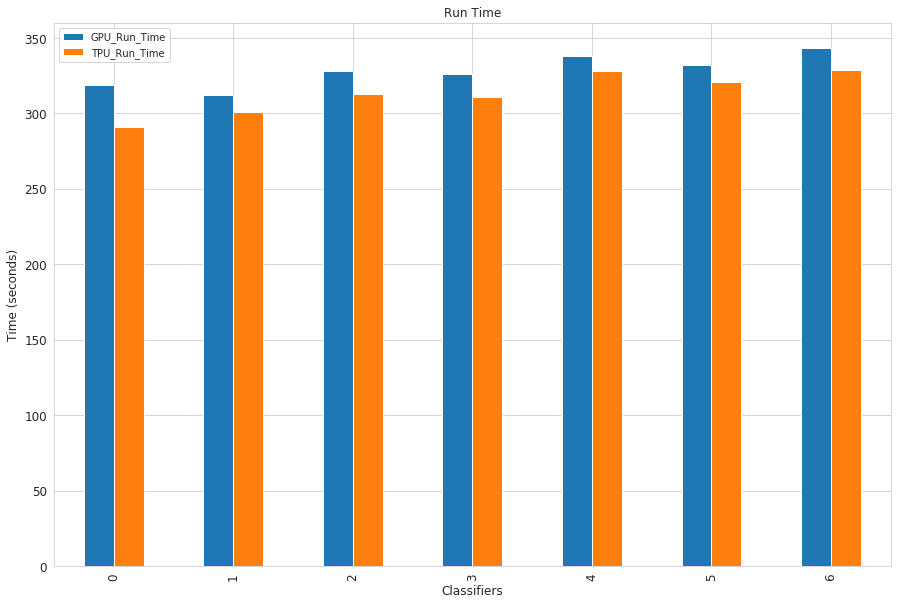

In [71]:
import matplotlib.pyplot as plt
ax = df_final[['GPU_Run_Time','TPU_Run_Time']].plot(kind='bar', title ="Run Time", figsize=(15, 10), legend=True, fontsize=12)
ax.set_xlabel("Classifiers", fontsize=12)
ax.set_ylabel("Time (seconds)", fontsize=12)
plt.show()

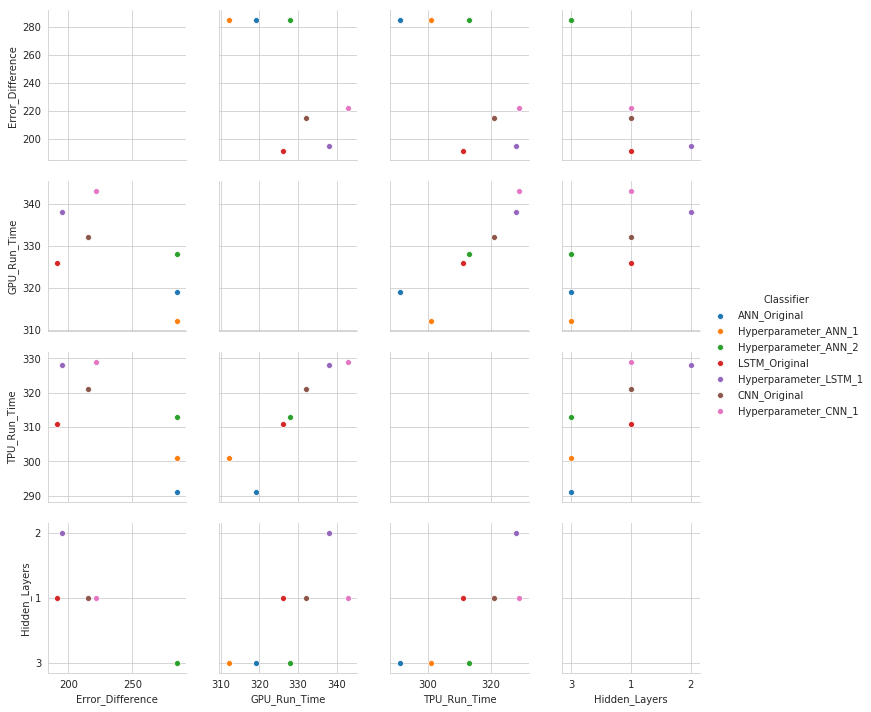

In [72]:
# Pairplot of all numerical value
sns.pairplot(df_final,hue='Classifier')

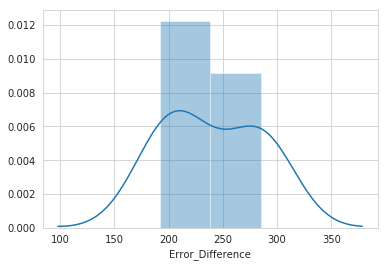

In [87]:
sns.distplot(df_final['Error_Difference'])